R script to generate DVG figures.

Input: Grouped and quantified DVG file using the subsampled PCR amplicons.

In [1]:
# load packages
require('plyr')
library('ggplot2')
library('tidyverse')
library('reshape2')
library('grid')
require('gridExtra')
library('plotly')
library('glue')
library('dunn.test')

Loading required package: plyr

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ tibble  3.0.4     ✔ dplyr   1.0.2
✔ tidyr   1.1.2     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.0
✔ purrr   0.3.4     

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::arrange()   masks plyr::arrange()
✖ purrr::compact()   masks plyr::compact()
✖ dplyr::count()     masks plyr::count()
✖ dplyr::failwith()  masks plyr::failwith()
✖ dplyr::filter()    masks stats::filter()
✖ dplyr::id()        masks plyr::id()
✖ dplyr::lag()       masks stats::lag()
✖ dplyr::mutate()    masks plyr::mutate()
✖ dplyr::rename()    masks plyr::rename()
✖ dplyr::summarise() masks plyr::summarise()
✖ dplyr::summarize() masks plyr::summarize()


Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths


Loading required package: gridExtra


Attaching package: ‘gridExtra’


The following object is masked from ‘

In [3]:
wkdir='/home/kate/Lab/zika_files/ReAlignment/SubVariants/SubDVG_PCR/'
META = '/home/kate/Lab/zika_files/ReAlignment/MetadataZika/Zika_Metadata_v4.csv'
ampsize = '/home/kate/Lab/zika_files/ReAlignment/MetadataZika/pcr.size.csv'
redmeta = "/home/kate/Lab/zika_files/ReAlignment/MetadataZika/Zika_Metadata_Reduced_v1.csv"

subsamps = c('ZIKA')

segment_list = c('MR766') # genome name

top_plas = "PlasAmp" # we are using the fpkm calc by amplicon and subsampling to filter out DVGs

In [4]:
setwd(wkdir)

metadata = read.csv(file=META,header=T,sep=",",na.strings = c('nan'))

ampdf = read.csv(file=ampsize,header=T,sep=",",na.strings = c('nan')) #read

reduced = read.csv(file=redmeta,header=T,sep=",",na.strings = c('nan')) #read


In [5]:
# order tissues and things
#ordering the tissues 
tissue_ord = c('plasmid','stock1','stock2','mosquito','brain','spinal_cord',
        'kidney','liver','spleen','bone_marrow','blood','reproductive')

#ordering the transmission routes
transord = c('stock1', 'meal_control','blood_meal','mosquito','needle')

orderlist = c('stock1-1','stock1-2','stock1-3',
              'stock2-1','stock2-2','stock2-3',
              'mosquito-1','mosquito-2','mosquito-3',
              'brain-1','brain-2','brain-3',
              'spinal_cord-1','spinal_cord-2','spinal_cord-3',
              'kidney-1','kidney-2','kidney-3',
              'liver-1','liver-2','liver-3',
              'spleen-1','spleen-2','spleen-3',
              'bone_marrow-1','bone_marrow-2','bone_marrow-3',
              'blood-1','blood-2','blood-3',
              'reproductive-1','reproductive-2','reproductive-3')


In [6]:
tissue_list2 = c('brain','liver','kidney','spinal_cord','bone_marrow',
                 'stock2','mosquito','spleen',
                 'stock1','blood','reproductive')

reducedColors =c('#66c2a4','#fc8d62','#8d9fcb','#e78ac3',
                 '#a6d854','#ffd92f','#e5c494','#b2b3b2',
                 '#feffb3','#0a068b','#fe3636')

names(reducedColors) =tissue_list2
RedColScale=scale_color_manual(name='grp',values=reducedColors)
RedColFill = scale_fill_manual(name='grp',values=reducedColors)

In [7]:
# reduce metadata and rearrange
reduced = reduced %>% filter(tissue %in% tissue_list2) %>%
  droplevels()

reduced$tissue_pcr = paste0(reduced$tissue,'-',reduced$PCR)

reduced$tissue_pcr = factor(reduced$tissue_pcr,levels=orderlist)

reduced$transmission = factor(reduced$transmission,levels=transord)


In [8]:
# setting up gene id dataframes using info from ncbi site
Gene_ID = c('C','prM','E','NS1','NS2A','NS2B','NS3','NS4A','2K','NS4B','NS5')
Gene_start = c(107,473,977,2477,3533,4211,4601,6452,6833,6902,7655)
Gene_End = c(472,976,2476,3532,4210,4600,6451,6832,6901,7654,10363) 

Gene_df = cbind(Gene_ID,Gene_start,Gene_End)
Gene_df = as.data.frame(Gene_df)
Gene_df$Gene_start = (as.numeric(as.character(Gene_df$Gene_start)))-106
Gene_df$Gene_End = as.numeric(as.character(Gene_df$Gene_End))-106
Gene_df$Gene_ID = factor(Gene_df$Gene_ID,levels=Gene_ID)

In [9]:
# generate subdirectories for figures 
if (!dir.exists(glue("{wkdir}/DVG_Figures"))) {
      dir.create(glue("{wkdir}DVG_Figures"))
    }

if (!dir.exists(glue("{wkdir}/DVG_Figures/Counts"))) {
      dir.create(glue("{wkdir}DVG_Figures/Counts"))
    }

if (!dir.exists(glue("{wkdir}/DVG_Figures/PIE"))) {
      dir.create(glue("{wkdir}DVG_Figures/PIE"))
    }

if (!dir.exists(glue("{wkdir}/DVG_Figures/fpkm"))) {
      dir.create(glue("{wkdir}DVG_Figures/fpkm"))
    }


if (!dir.exists(glue("{wkdir}/DVG_Figures/DVG_diversity"))) {
      dir.create(glue("{wkdir}DVG_Figures/DVG_diversity"))
    }

if (!dir.exists(glue("{wkdir}/DVG_Figures/curvy"))) {
      dir.create(glue("{wkdir}DVG_Figures/curvy"))
    }

if (!dir.exists(glue("{wkdir}/DVG_Figures/histos"))) {
      dir.create(glue("{wkdir}DVG_Figures/histos"))
    }

if (!dir.exists(glue("{wkdir}/DVG_Figures/SharedDVGs"))) {
      dir.create(glue("{wkdir}DVG_Figures/SharedDVGs"))
    }

if (!dir.exists(glue("{wkdir}/DVG_DiversityStats"))) {
      dir.create(glue("{wkdir}DVG_DiversityStats"))
    }

if (!dir.exists(glue("{wkdir}/DVG_FPKMstats"))) {
      dir.create(glue("{wkdir}/DVG_FPKMstats"))
    }

if (!dir.exists(glue("{wkdir}/DVG_Figures/CompareSub"))) {
      dir.create(glue("{wkdir}/DVG_Figures/CompareSub"))
    }


In [10]:
CountSamps = function(df){
    numbsamps = ggplot(df,aes(x=tissue_pcr, group=tissue_pcr)) +
      geom_bar() +
      theme_bw() +
      facet_grid(.~transmission, scales='free',space='free')+
      theme(axis.text.x = element_text(angle = 90, hjust=1)) +
      scale_y_continuous(name="Number of Samples",breaks=c(0,2,4,6,8,10,12,14,16))
    print(numbsamps)
    ggsave(numbsamps, 
       file=glue("{wkdir}DVG_Figures/Counts/Zika.NumberOfSamples.pdf"), 
         width=10, height=4.5,limitsize=FALSE, useDingbats=FALSE)



    count.samps  = df %>%
      group_by(PCR,tissue,transmission) %>%
      tally() %>%
      arrange(desc(n))
    colnames(count.samps) = c("pcr","tissue","transmission","total")
    
    return(count.samps)
}

In [11]:
MergeOutWMeta = function(df_name, metadf,freq){
    DF =  read.csv(file=df_name,header=T,sep=",",na.strings = c('nan'))
    
    DF = DF %>%
            separate(name,c("name","pcr"),'_pcr') %>%
                droplevels()

    DF = DF %>% separate(pcr,c("pcr","subsample"), "_") %>%
                droplevels()
    
    
    DF = merge(DF, metadf, by='name', all.x = T)
    
    DF = DF %>% 
          select(name,pcr,subsample,segment,segment_size,totalreads,strain,group,
             NewGap, NewStart, NewEnd, GapSize, EstimatedLength,boundaries,
             DVG_freq, SegTotalDVG, DVG_RPKM, Segment_RPKM, DVG_PercentAbundancePerkb, 
             Segment_PercentAbundancePerkb, DVG_PercentTotalDVG, mouse_id, transmission,
             tissue, tissue2, sex, type, id2, id, full, experiment) %>%
          droplevels()
    
    return(DF)
}

In [12]:
CompareBC = function(DF){
    # filter and merge
    BC1= filter(DF,mouse_id=='BC1')
    BC2 = filter(DF,mouse_id=='BC2')

    BC = merge(BC1,BC2,by=c('pcr','subsample','segment','group','NewGap','NewStart',
                       'NewEnd','transmission','type','full',
                        'experiment','GapSize','segment_size','strain',
                        'GapSize','EstimatedLength','sex','boundaries',
                       'tissue','tissue2'))
    
    #average 
    BC$name = 'stock2'
    BC$tissue = 'stock2'
    BC$DVG_freq =rowMeans(subset(BC,select=c('DVG_freq.x','DVG_freq.y')))
    BC$SegTotalDVG = rowMeans(subset(BC,select=c('SegTotalDVG.x','SegTotalDVG.y')))
    BC$totalreads = rowMeans(subset(BC,select=c('totalreads.x','totalreads.y')))
    BC$id = 'stock2'
    BC$id2 = 'stock2'
    BC$mouse_id ='stock2'
    BC$DVG_RPKM = rowMeans(subset(BC,select=c('DVG_RPKM.x',
                                                   'DVG_RPKM.y')))

    BC$Segment_RPKM = rowMeans(subset(BC,select=c('Segment_RPKM.x',
                                                   'Segment_RPKM.y')))


    BC$DVG_PercentTotalDVG = rowMeans(subset(BC,select=c('DVG_PercentTotalDVG.x',
                                                   'DVG_PercentTotalDVG.y')))

    BC$DVG_PercentAbundancePerkb = rowMeans(subset(BC,
                                                 select=c('DVG_PercentAbundancePerkb.x',
                                                   'DVG_PercentAbundancePerkb.y')))

    BC$Segment_PercentAbundancePerkb = rowMeans(subset(BC,
                                                 select=c('Segment_PercentAbundancePerkb.x',
                                                          
                                                   'Segment_PercentAbundancePerkb.y')))

    return(BC)
}

In [13]:
MergeWAvgBC = function(BC, DF, ampdf){
    #INPUT: dataframe, BC dataframe, and amplicon size dataframe
    #OUTPUT: dataframe with all info from 3 input dataframes
    BC = BC %>%
        select(name,pcr,subsample,segment,segment_size,totalreads,strain,group,
         NewGap, NewStart, NewEnd, GapSize, EstimatedLength,boundaries,
         DVG_freq, SegTotalDVG, DVG_RPKM, Segment_RPKM, DVG_PercentAbundancePerkb, 
         Segment_PercentAbundancePerkb, DVG_PercentTotalDVG, mouse_id, transmission,
         tissue, tissue2, sex, type, id2, id, full, experiment) %>%
      droplevels()
    
    bc_list =c('BC1','BC2')

    DF = filter(DF, !mouse_id %in% bc_list) %>%
      droplevels()

    DF = rbind(DF,BC)
    
    DF = DF[!duplicated(DF),] %>%
          droplevels()

    DF = merge(DF,ampdf,by=c('segment','pcr'),all.x=T)
    
    DF$DVG_RPKM_FRAG = DF$DVG_freq/((DF$amplicon_size/1000)*(DF$totalreads/1000000)) 
    
    return(DF)
}

In [14]:
# check on plasmid samples
PlasmidDVG = function(DF){
    plasmid = DF %>% filter(mouse_id =='plasmid') %>%
                    droplevels() %>%
                    arrange(desc(DVG_freq))

    #highest DVG_freq is 8 reads
    #we can then filter everything that is above 8 reads 
    plasdvg = levels(factor(plasmid$NewGap))
    
    top_plas = plasmid[1:1,]$DVG_RPKM_FRAG
    
    return(list(plasdvg, top_plas))
}

In [15]:
FiltDVGs = function(DF, plasmid_DVG, tissue_list){
    message("Dimensions before filtering: ", dim(DF))
    
    df.DVG_freq.filt = DF %>% filter(DVG_RPKM_FRAG >= DVG_RPKM_PLAS & tissue %in% tissue_list & !NewGap %in% plasmid_DVG) %>% 
      droplevels() # filter for tissues we are interested in, filter out DVGs below fpkm thresholds, filter out plasmid DVGs
    
    df.DVG_freq.filt = df.DVG_freq.filt[!duplicated(df.DVG_freq.filt), ] # remove any potential duplicates
    
    message("Dimensions after filtering: ", dim(df.DVG_freq.filt))
    
    # sum up DVG freqs across each sample 
    NewDVG_freq = aggregate(df.DVG_freq.filt$DVG_freq ~ df.DVG_freq.filt$name + df.DVG_freq.filt$pcr + df.DVG_freq.filt$subsample, FUN=sum)
    
    colnames(NewDVG_freq) = c("name","pcr","subsample","NewGapTotal")

    # merge these new counts with the filtered dataframe and return it
    df.DVG_freq.filt = merge(df.DVG_freq.filt, 
                             NewDVG_freq,
                             by=c("name","pcr","subsample"), all.x=TRUE)
    
    return(df.DVG_freq.filt)
}

In [16]:
NoDVG = function(metadf, subfreq){
    
    # INPUT: metadata with all sample info, and the dataframe used to calc fpkm
    # OUTPUT: merged metadata with samples that don't have DVGs given a 0 calc
    #select the columns that we want (name and pcrs)
    metadf = metadf %>% select(name, tissue, experiment, transmission, mouse_id,
                               pcr1, pcr2, pcr3) %>% droplevels()
    
    # melt make pcrs all one column 
    m_melt = melt(metadf, id.vars = c('name', 'tissue','experiment','transmission','mouse_id')) 

    # the way the dataframe is set up, they should be the same value if an amplicon was present for the sample
    m_melt = m_melt %>% filter(variable == value)
    
    m_melt$value = gsub('pcr','', m_melt$value)
    
    m_melt = m_melt %>% select(name, tissue, experiment, transmission, mouse_id, value)
    
    colnames(m_melt) = c('name','tissue','experiment','transmission','mouse_id', 'pcr') # this will allow us to merge with name and pcr 
    
    return(m_melt) # return this df to be used for other analyses
    
}

In [17]:
# calculating log10 information 
CalcFPKM = function(df, ampdf){
    RPM_FILT = select(df,name,pcr,subsample,segment,tissue,segment_size,
                  NewGapTotal,totalreads,experiment,
                      transmission,mouse_id)
    
    
    RPM_FILT = RPM_FILT[!duplicated(RPM_FILT), ] %>% droplevels()

    RPM_FILT = merge(RPM_FILT, ampdf,by=c('segment','pcr'),all.x=T)
    
    RPM_FILT = RPM_FILT[!duplicated(RPM_FILT),] %>% droplevels()
       
    #calculating rpkm for each pcr (which in this case is considered 'segment size')
    RPM_FILT$RPKM = RPM_FILT$NewGapTotal/((RPM_FILT$amplicon_size/1000)*(RPM_FILT$totalreads/1000000))
   
    # I am changing all 'na' fpkms to 1, so when log10 is taken it turns it to 0
    RPM_FILT$RPKM[is.na(RPM_FILT$RPKM)] = 1
    
    return(RPM_FILT)
}

In [18]:
FPM_Figs = function(RPM_FILT, savedir, colorscale, subsamp, countcut){

    rpkm.tissue.pcr = ggplot(RPM_FILT,aes(x=PcrGroup,y=log10(RPKM),group=PcrGroup)) +
      geom_boxplot() +
      geom_jitter(aes(color=tissue,shape=experiment),width=0.2) +
      theme_bw()+
      theme(axis.text.x = element_text(angle =90,hjust=1)) +
      colorscale +
        theme(legend.key = element_blank(), 
          strip.background = element_rect(colour="black", fill="white")) 
      ylab("Log10 Total Gap-Spanning FPKM")
    
    print(rpkm.tissue.pcr)
    ggsave(rpkm.tissue.pcr, 
           file = glue("{savedir}/{subsamp}.fpkm.pcr.tissue.{countcut}.pdf"),
           width=8, height=4.5,limitsize=FALSE, useDingbats=FALSE)


    rpkm_pcr = ggplot(RPM_FILT,aes(x=pcr,y=log10(RPKM),group=pcr)) +
      geom_boxplot() +
      geom_jitter(aes(shape=experiment),width=0.2) +
      theme_bw()+
      theme(axis.text.x = element_text(angle =90,hjust=1)) +
      facet_grid(.~transmission,space='free',scales='free') +
      colorscale +
      ylab("Log10 Total Gap-Spanning FPKM") +
      xlab("Amplicon Fragment") + 
      theme(legend.key = element_blank(), 
          strip.background = element_rect(colour="black", fill="white")) 
    
    print(rpkm_pcr)
    ggsave(rpkm_pcr, 
           file= glue("{savedir}/{subsamp}.fpkm.pcr.{countcut}.pdf"),
           width=8, height=3,limitsize=FALSE, useDingbats=FALSE)


    # filter just for mosquito and needle inoc
    inoc = c('mosquito', 'needle')
    rpkm_pcr2 = ggplot(data = filter(RPM_FILT,transmission %in% inoc),aes(x=pcr,y=log10(RPKM),group=pcr)) +
      geom_boxplot() +
      geom_jitter(aes(shape=experiment),width=0.2) +
      theme_bw()+
      theme(axis.text.x = element_text(angle =90,hjust=1)) +
      facet_grid(.~transmission,space='free',scales='free') +
      colorscale +
      ylab("Log10 Total Gap-Spanning FPKM") +
      xlab("Amplicon Fragment") +
    theme(legend.key = element_blank(), 
          strip.background = element_rect(colour="black", fill="white")) 
    
    print(rpkm_pcr2)
    ggsave(rpkm_pcr2, 
           file = glue("{savedir}/{subsamp}.rpkm.pcr.v2.{countcut}.pdf"),
           width=5, height=4.5,limitsize=FALSE, useDingbats=FALSE)

    
    # perform kruskal wallis test on total FPKM of DVGs
    pval = kruskal.test(RPKM~PcrGroup, data=RPM_FILT)
    
    message(glue("Kruskal Test on DVG FPKM ({subsamp}) p-value: "), pval$p.value)
    
    print(subsamp)
    
    # perform pairwise dunn test post kruskal wallis to determine significance between tissue/pcr groups
    print(dunn.test(RPM_FILT$RPKM, RPM_FILT$PcrGroup, method="bonferroni"))
    
    comparisons = dunn.test(RPM_FILT$RPKM, RPM_FILT$PcrGroup, method="bonferroni")$comparisons
    padj = dunn.test(RPM_FILT$RPKM, RPM_FILT$PcrGroup, method="bonferroni")$P.adjust
    pvals = dunn.test(RPM_FILT$RPKM, RPM_FILT$PcrGroup, method="bonferroni")$P
    
    fpkm_stats = data.frame(comparisons, padj, pvals)
    
    return(fpkm_stats)

}

In [19]:
# look at DVG diversity: 
DVGDiversity = function(RPM_FILT, reduced_meta, savedir, subtype, countcut){

    # FILTER DATAFRAME 
    div = RPM_FILT %>%
              select(pcr,subsample,mouse_id,transmission,tissue, 
                     experiment,NewGap,boundaries,amplicon_size) %>%
              group_by(pcr,subsample,mouse_id,transmission,tissue,
                         experiment,amplicon_size) %>% tally()
    
    # merge with metadata 
    div_df = merge(div, reduced_meta, all=T,
              by.x=c('pcr','mouse_id','transmission','tissue','experiment'),
              by.y=c('PCR','mouse_id','transmission','tissue','experiment'))

    # by merging with metadata - add in samples with 0 
    div_df$n[is.na(div_df$n)] = 0  # add in samples that had no dvgs what so ever but were sequenced
    div_df$n_perkb = div_df$n/(div_df$amplicon_size/1000)
    div_df$n_perkb[is.na(div_df$n_perkb)] = 0 


    # summarize the data: 
    # 'subsample' won't matter for individual files 
    sdata = ddply(div_df, c("tissue_pcr","tissue"), summarise,
               N    = length(n_perkb),
               mean = mean(n_perkb),
               sd   = sd(n_perkb),
               se   = sd / sqrt(N))
    sdata$tissue_pcr= factor(sdata$tissue_pcr,levels=orderlist)
    
    # perform kruskal wallis test on number of unique dvg species/kb in each tissue/pcr amplicon sample
    pval = kruskal.test(n_perkb~tissue_pcr,data=div_df)
    
    message(glue("Kruskal Test on DVG diversity ({subtype}) p-value: "), pval$p.value)
    #print(pval$p.value)
    
    print(subtype)
    
    # perform pairwise dunn test post kruskal wallis to determine significance between tissue/pcr groups
    print(dunn.test(div_df$n_perkb, div_df$tissue_pcr, method="bonferroni"))
    
    comparisons = dunn.test(div_df$n_perkb, div_df$tissue_pcr, method="bonferroni")$comparisons
    padj = dunn.test(div_df$n_perkb, div_df$tissue_pcr, method="bonferroni")$P.adjust
    pvals = dunn.test(div_df$n_perkb, div_df$tissue_pcr, method="bonferroni")$P
    
    div_stats = data.frame(comparisons, padj, pvals)
    
    
    #Plot mean and se diversity
    div.p = ggplot(sdata,aes(x=tissue_pcr,y=mean)) +
      geom_col(aes(fill=tissue)) +
      geom_errorbar(aes(ymin=mean-se,ymax=mean+se),width=0.4) +
      theme_bw() +
      theme(axis.text.x = element_text(angle = 90, hjust=1))  +
      RedColFill +
      ylab("Unique DVG types per amplicon kb") +
      xlab("Tissue Amplicon")
    print(div.p)
    
    ggsave(div.p , 
      file= glue("{savedir}/{subtype}.DiversityDVG.{countcut}.pdf"),
      width=7, height=4.5,limitsize=FALSE, useDingbats=FALSE)
    
    return(div_stats)

}

In [20]:
CurvyAll = function(df, Gene_dfs, savedir, subsamp, countcut){
    
    gaps = select(df,NewGap,NewStart,NewEnd) %>%
      droplevels()
    
    gaps=gaps[!duplicated(gaps),]%>%droplevels()

    ## USED
    curvy = ggplot() +
      geom_rect(data=Gene_dfs,aes(xmin=Gene_start,xmax=Gene_End,
                             ymin=-1,ymax=0),alpha=0.05,color='black') +
      geom_curve(data=gaps,aes(x=NewStart,y=0,xend = NewEnd,yend=0),alpha=0.1) +
      
      scale_y_continuous(expand = c(0,0), limits=c(-1,0)) +
      theme_bw() +
      theme(axis.text.x = element_text(angle=90)) 
    print(curvy)
    ggsave(curvy, 
           file= glue("{savedir}/{subsamp}.CurvePlots.AllDVG.{countcut}.pdf"),
           width=10, height=5,limitsize=FALSE, useDingbats=FALSE)
    }

In [21]:
CountGenes = function(df, Gene_ID, Gene_df, savedir, subtype, countcut){
    
    df.dvg = select(df,NewGap,NewStart,NewEnd,subsample) %>% 
      droplevels() #select for only gap information
    
    
    count.start = df.dvg %>% group_by(NewStart,subsample) %>% tally()  # count the number of dvg species with same start
    count.start$type = 'start'   
    colnames(count.start) = c('position','subsample','DVG_freq','type')
    
    count.end = df.dvg %>% group_by(NewEnd,subsample) %>% tally()  # count the number of dvg species with same end
    count.end$type = 'end'
    colnames(count.end) = c('position','subsample','DVG_freq','type')
    count.position = rbind(count.start,count.end)

    Genes = data.frame(gene = as.character(), position = as.numeric())
    for (id in Gene_ID){

        gene_Range = filter(Gene_df, Gene_ID == id) %>%
            droplevels() #filter for gene id

        #repeat gene id to make df
        gene_ids = c(rep(id, 
                   (gene_Range$Gene_End + 1 - gene_Range$Gene_start)))
            
        ntpos = c(seq(gene_Range$Gene_start, gene_Range$Gene_End, by =1))
        
        genes_df = cbind(gene_ids,ntpos)
      
        genes_df = as.data.frame(genes_df)
      
        Genes = rbind(Genes, genes_df)
    }
    
    count.df = merge(count.position,Genes,by.x='position', by.y='ntpos')

    count.types.genes = aggregate(count.df$DVG_freq ~ count.df$type + count.df$gene_ids,FUN=sum)

    colnames(count.types.genes) = c('type','gene_ids','DVG_freq')

    count.types.genes = merge(count.types.genes,Gene_df,by.x="gene_ids",
                          by.y='Gene_ID')

    count.types.genes$NormalizedCounts = count.types.genes$DVG_freq/((count.types.genes$Gene_End-count.types.genes$Gene_start + 1)/1000)

    # USED
    count.types.genes$gene_ids = factor(count.types.genes$gene_ids, levels = Gene_ID)
    plotcounts = ggplot(count.types.genes,aes(x=gene_ids,y=NormalizedCounts,
                                          group=gene_ids,fill=type)) +
      geom_col() +
      theme_bw() +
      scale_fill_brewer(palette = 'Paired') +
      xlab("Gene") +
      ylab("Total number of DVG start and end positions perkb of gene")
    
    print(plotcounts)
    
    ggsave(plotcounts,
           file = glue("{savedir}/{subtype}.NormalizedGeneDVGcounts.Tot.{countcut}.pdf") ,
             width=8, height=5,limitsize=FALSE, useDingbats=FALSE)

}

In [22]:
Histo = function(df, Gene_df, savedir, subsamp, countcut){
    #just grap the start positions
    StartDF = select(df,NewGap,NewStart)
    #remove any duplicates within samples-so will count multiple dvgs and samples that have same dvg

    StartDF = StartDF[!duplicated(StartDF),] %>% droplevels()
    EndDF = select(df,NewGap,NewEnd)
    EndDF = EndDF[!duplicated(EndDF),] %>% droplevels()

    #this is normalized by all DVGs and samples 
    p6 = ggplot() +
        geom_rect(data=Gene_df,aes(xmin=Gene_start,xmax=Gene_End,
                             ymin=0,ymax=0.10),alpha=0.1,color='black') +
        geom_histogram(data = StartDF,
                   aes(x=NewStart,
                       y=(..count..)/tapply(..count..,..PANEL..,sum)[..PANEL..]),
                   binwidth=30,fill='#d6604d',alpha=0.9) +
        geom_histogram(data = EndDF, 
                   aes(x=NewEnd,
                       y=(..count..)/tapply(..count..,..PANEL..,sum)[..PANEL..]),
                   binwidth=30,fill='#4393c3',alpha=0.7) +
        ggtitle("Normalized Counts") +
        xlab("CDS position") + 
        ylab("Freq of start and end positions of DVGs across all DVGs and samples") +
        theme_bw() +
        scale_x_continuous(expand=c(0,0)) +
        scale_y_continuous(expand=c(0,0))
    print(p6)
    ggsave(p6, 
           file=glue("{savedir}/{subsamp}.Position.Histogram.{countcut}.pdf"),
           #file=paste0(saveit,strain,".Position.Histogram.",countcut,".pdf"),
         width=8, height=5,
         limitsize=FALSE, useDingbats=FALSE)
}

In [23]:
DVG_fpkm = function(df){
    dvg.rpkm = df %>%
          select(pcr,subsample,segment,NewGap,NewStart,NewEnd,
                 transmission,tissue,name,
                 DVG_freq,NewGapTotal,totalreads,id,mouse_id,
                 segment_size,experiment,boundaries) %>%
          droplevels()
    
    dvg.rpkm = merge(dvg.rpkm, ampdf,by=c('segment','pcr'),all.x=T)
    
    dvg.rpkm$DVG_RPKM = dvg.rpkm$DVG_freq/((dvg.rpkm$amplicon_size/1000)*(dvg.rpkm$totalreads/1000000))
    
    dvg.rpkm$DVG_ABUND = dvg.rpkm$DVG_freq/((dvg.rpkm$amplicon_size/1000)*(dvg.rpkm$totalreads))
    
    return(dvg.rpkm)

}

In [24]:
TopShare = function(df, ampdf, RedColScale, savedir, subsamp, countcut){
    
    # calculate dvg specific fpkm
    dvg.rpkm = df %>%
          select(pcr,subsample,segment,NewGap,NewStart,NewEnd,
                 transmission,tissue,name,
                 DVG_freq,NewGapTotal,totalreads,id,mouse_id,
                 segment_size,experiment,boundaries) %>%
          droplevels()
    
    dvg.rpkm = merge(dvg.rpkm,ampdf,by=c('segment','pcr'),all.x=T)  # merge with amp df to get size of amplicons
    
    dvg.rpkm$DVG_RPKM = dvg.rpkm$DVG_freq/((dvg.rpkm$amplicon_size/1000)*(dvg.rpkm$totalreads/1000000)) # calculate amplicon fpkm perkb
    
    dvg.rpkm$DVG_ABUND = dvg.rpkm$DVG_freq/((dvg.rpkm$amplicon_size/1000)*(dvg.rpkm$totalreads)) # calculate amplicon abundance perkb 

    # rearrange and grab the top dvg for each SAMPLE (that include mouse/tissue, mosquito, stock, etc)
    mouse_tissue = dvg.rpkm %>% 
      group_by(name) %>%
      arrange(desc(DVG_RPKM)) %>%
      top_n(1, DVG_RPKM) %>%
      droplevels()
    
    # generate new factor for x-axis that includes the tissue type and pcr amplicon number
    mouse_tissue$tissue_pcr = paste0(mouse_tissue$tissue,'-',mouse_tissue$pcr)
    
    # generate a vector of the top DVGs that were identified
    mouse_tiss_top = c(levels(factor(mouse_tissue$NewGap)))

    # filter the dataframe for DVGs that were identified to be the top DVG in each mouse
    dvg.rpkm.mouse = df %>%
      select(pcr,subsample,segment,NewGap,NewStart,NewEnd,
             transmission,tissue,name,DVG_freq,NewGapTotal,
             totalreads,id,mouse_id,segment_size,experiment,DVG_RPKM) %>%
        filter(NewGap %in% mouse_tiss_top) %>%
        droplevels()

    # use the filtered/top dvg df to calculate the number of mice, stocks, and mosquitos that have that dvg
    mouse_p = dvg.rpkm.mouse %>%
      select(pcr,NewStart,NewEnd,NewGap,mouse_id,subsample)

    # remove any duplicates (this will remove tissue specific info because we just want mice info for now)
    mouse_p= mouse_p[!duplicated(mouse_p),] %>% 
      droplevels()

    # count the number of mice, mosquitos, stocks that have the given DVG
    mouse_p_c = mouse_p %>%
      group_by(pcr,NewStart,NewEnd,NewGap, subsample) %>%
      tally() %>%
      arrange(desc(n))

    # this is our 'mouse count' and will be used for the bar plot
    colnames(mouse_p_c) =  c('pcr','NewStart','NewEnd','NewGap','subsample', 'mouse_count')
    
    # this is redundant and should be identical to mouse_tiss_top above. Consider removing
    topmice = levels(factor(mouse_p_c$NewGap))
    print(length(topmice))
    print(length(mouse_tiss_top))
    
    message(glue("Number of DVGs found to be top across all samples ({subsamp}): "), length(topmice))
    
    
    # generating a count of tissue samples with DVG (how many mice have dvg in given tissue?)
    # reduce information and remove duplicates
    mouse_p_t = dvg.rpkm %>%
      select(pcr,NewStart,NewEnd,NewGap,mouse_id,tissue,subsample)
    
    mouse_p_t= mouse_p_t[!duplicated(mouse_p_t),] %>% 
      droplevels()

    # group by tissue, pcr, and subsample freq to count the number of mice that have tissue with given DVG
    mouse_p_t_c = mouse_p_t %>%
      group_by(pcr,NewStart,NewEnd,NewGap,tissue,subsample) %>%
      tally() %>%
      arrange(desc(n))
    
    # name this count column 'tissue count'
    colnames(mouse_p_t_c) =  c('pcr','NewStart','NewEnd','NewGap','tissue','subsample','tissue_count')

    # merge all of this information into one dataframe, including fpkm information
    all.c.dvg = merge(dvg.rpkm, mouse_p_c, by=c("pcr","NewStart","NewEnd","NewGap","subsample"))
    
    all.c.dvg = merge(all.c.dvg, mouse_p_t_c, by=c("pcr","NewStart","NewEnd","NewGap","tissue","subsample"))

    # rearrange dataframe which may come in useful for figures
    all.c.dvg = all.c.dvg %>%
      arrange(desc(mouse_count))

    # because we merged with the fpkm dataframe, we want to refilter for those that we are interested in only
    topdvg = all.c.dvg %>%
      filter(NewGap %in% topmice) %>%
      droplevels()

    # reduce the information and remove duplciates
    mousetop = topdvg %>% 
      select(NewGap,NewStart,NewEnd,pcr,subsample,mouse_count)
                       
    mousetop = mousetop[!duplicated(mousetop),]%>%droplevels()

    
    #topbar2 = ggplot(mousetop,aes(x=reorder(NewGap,-mouse_count),y=mouse_count))+
    #  geom_col(width=0.7) +
    #  theme_bw()+
    #  xlab("DVG") +
    #  ylab("Number of samples with DVG 
    #   (stocks, mice, and mosquitos)") +
    #  facet_grid(.~subsample) + 
    #  theme(axis.text.x = element_text(angle = 90, hjust=1),legend.position="NONE")
    #print(topbar2)
    #ggsave(topbar2, 
    #       file=glue("{savedir}/{subsamp}.TopDVGs.Bar.Subsampled.{countcut}.pdf"),
    #     width=15, height=5,
    #     limitsize=FALSE, useDingbats=FALSE)
    
    # provide the sample count information for the DVG (number of mice, mosquito, stock samples)
    topbar = ggplot(mousetop,aes(x=reorder(NewGap,-mouse_count),y=mouse_count))+
      geom_col(width=0.7) +
      theme_bw()+
      xlab("DVG") +
      ylab("Number of samples with DVG 
       (stocks, mice, and mosquitos)") +
      theme(axis.text.x = element_text(angle = 90, hjust=1),legend.position="NONE")

    # provide the tissue count for the mice
    bytiss = ggplot(topdvg,aes(x=reorder(NewGap,-mouse_count),y=tissue))+
      geom_point(aes(size=tissue_count*1.3),color='black') +
      geom_point(aes(size=tissue_count,color=tissue)) +
      theme_bw()+
      xlab("DVG") +
      ylab("") +
      theme(axis.text.x = element_text(angle = 90,hjust=1),legend.position="NONE") +
      RedColScale 

    # provide the log10 fpkm for individual dvg species found in each tissue and mouse sample
    byrpkm = ggplot(topdvg,aes(x=reorder(NewGap,-mouse_count),y=log10(DVG_RPKM))) +
      geom_boxplot() +
      geom_jitter(aes(color=tissue),size=0.7,alpha=0.9,width=0.25) +
      theme_bw()+
      xlab("DVG") +
      ylab("Log10 DVG FPKM") +
      theme(axis.text.x = element_text(angle = 90,hjust=1),legend.position="NONE") +
      RedColScale

    # also generate a curvy plot showing these dvgs (not used in manuscript)
    curvy = ggplot() +
      geom_curve(data=mousetop,aes(x=NewStart,y=0,xend = NewEnd,yend=0),alpha=0.7) +
      scale_y_continuous(expand = c(0,0), limits=c(-1,0)) +
      theme_bw() +
      theme(axis.text.x = element_text(angle=90)) 

    # generate a stacked figure to return/save
    g1 = ggplotGrob(topbar)
    g2 = ggplotGrob(bytiss)
    g3 = ggplotGrob(byrpkm)
    gf = rbind(g1,g2,size="first")
    gf = rbind(gf,g3,size="first")
    y = grid.arrange(gf)

    ggsave(y,
           file=glue("{savedir}/{subsamp}.TopDVG.WithinMiceTissues.{countcut}.pdf"),
           width=10, height=10,limitsize=FALSE, useDingbats=FALSE)
    
    return(dvg.rpkm)
}

In [25]:
PiePlot = function(df, savedir, subsamp, countcut){

    # the names of the stocks used (to remove/compare to)
    stocklist =c('stock1','stock2')
    
    # grab mouse specific information (removes info on tissue)
    mouse_p = df %>% 
            filter(!mouse_id %in% stocklist) %>%
            droplevels() %>% 
            select(pcr,NewStart,NewEnd,NewGap,mouse_id) %>% 
            droplevels()
    
    # remove duplicate dvgs (if two tissues in one mouse have same dvg it will remove this duplicate)
    mouse_p= mouse_p[!duplicated(mouse_p),] %>% 
      droplevels()

    # count the number of mice with the given dvg (by pcr amplicon)
    # for example: a 10 for a specific DVG suggests 10 different mice/stock/mosq samples had DVG
    mouse_p_c = mouse_p %>%
      group_by(pcr,NewStart,NewEnd,NewGap) %>%
      tally() %>%
      arrange(desc(n))
    
    # mouse specific count because we removed tissue information
    colnames(mouse_p_c) =  c('pcr','NewStart','NewEnd','NewGap','mouse_count')


    # count the number of tissues with dvg
    # Now add in tissue information, will count how many tissue samples have DVG across the different mice
    # want to include stock here so it can count stock #s
    mouse_p_t = df %>%
      select(pcr,NewStart,NewEnd,NewGap,mouse_id,tissue)
    
    # remove any duplicate information
    mouse_p_t= mouse_p_t[!duplicated(mouse_p_t),] %>% 
      droplevels()

    # group by tissue and pcr - count how many mice have DVG in specific tissue. For example a 3 for liver DVG indicates 3 different mice had the DVG in the liver samples
    mouse_p_t_c = mouse_p_t %>%
      group_by(pcr,NewStart,NewEnd,NewGap,tissue) %>%
      tally() %>%
      arrange(desc(n)) 
    
    # rename the count column 'tissue count' indicates number of mice have DVG in tissue
    colnames(mouse_p_t_c) =  c('pcr','NewStart','NewEnd','NewGap','tissue','tissue_count')

    # calculate the number of times a DVG appears in one mouse and multiple tissues 
    t_win_mice = df %>%
      group_by(mouse_id,pcr,NewStart,NewEnd,NewGap) %>%
      tally() %>%
      arrange(desc(n))
    
    # one mouse but multiple tissue count:
    colnames(t_win_mice)  = c('mouse_id','pcr','NewStart','NewEnd','NewGap',"withinMiceCount")

    # merge all of this info into one data frame
    abun_dvg = merge(mouse_p_c, mouse_p_t_c, by=c('pcr','NewStart','NewEnd','NewGap'))
    
    abun_dvg = merge(abun_dvg, t_win_mice, by=c('pcr','NewStart','NewEnd','NewGap'))
    
    abun_dvg = abun_dvg[!duplicated(abun_dvg), ] %>% droplevels()
    
    # calculate the total number of DVGs 
    total_dvg = length(levels(factor(abun_dvg$NewGap)))
    

    # Calc the number of DVGs that are found in multiple mouse/mosquito samples and found in stock
    stock_mice = abun_dvg %>% 
      filter(mouse_count >= 1 & mouse_id %in% stocklist)
    
    stock_mice = length(levels(factor(stock_mice$NewGap))) # calculate the number that was found
    
    message(glue("Count in stock and at least one mouse ({subsamp}): "), stock_mice)

    # calculate the number of DVGs that are found across mice and NOT in stock 
    acrossmice = abun_dvg %>% filter(mouse_count>1) # mouse count here does not include stock
    
    acrossmice_n = length(levels(factor(acrossmice$NewGap)))
    
    message(glue("Count across mice (no stock) ({subsamp}): "), acrossmice_n)

    
    # calculate the DVG count within mice and multiple tissue 
    withinmice = abun_dvg %>% filter(mouse_count == 1 & withinMiceCount > 1)
    
    withinmice_n = length(levels(factor(withinmice$NewGap)))
    
    message(glue("Count within mice across tissues ({subsamp}): "), withinmice_n)

    
    # count the number of DVGs that are found only in one mouse and one tissue 
    withinonly = abun_dvg %>% filter(mouse_count == 1 & withinMiceCount == 1)
    
    withinonly_n = length(levels(factor(withinonly$NewGap)))
    
    message(glue("Count within only one mouse one tissue ({subsamp}): "), withinonly_n)

    # generate dataframe with the various counts
    data = data.frame(
      group = c("SharedAcrossMiceNoStock", "OneMouseMultiTissue",
            "OneMouseOneTissue","InStockandMouse"),
      values =c(acrossmice_n-stock_mice,withinmice_n,withinonly_n,stock_mice))

    share_pie= ggplot(data,aes(x="",y=values,fill=group)) +
      geom_bar(stat='identity',width=1,color='white') +
      coord_polar("y",start=0)+
      theme_void() +
    scale_fill_manual(values=c("#a7c5cc","#75979f","#3b3d50","#a0d0c8"))

    ggsave(share_pie,
          file=glue("{savedir}/{subsamp}.DVGPie.{countcut}.PCR.pdf"),
     width=5, height=5,limitsize=FALSE, useDingbats=FALSE)

    print(share_pie)
}

In [26]:
FiltIt = function(df, subsamp_freq){
    
    df = df %>% filter(subsample == subsamp_freq) %>% droplevels()
    
    df = df %>% select(segment, pcr, NewGap, transmission, tissue, name, experiment, DVG_RPKM) %>% droplevels()
    
    df[!duplicated(df), ] %>% droplevels()
    
    colnames(df) = c('segment','pcr','NewGap','transmission','tissue','name','experiment', glue("Sub{subsamp_freq}"))
    
    return(df)
}

## Analysis using the plasmid amplicons individually as amplicon specific thresholds

[1] "1"
ZIKA_1


`summarise()` regrouping output by 'pcr' (override with `.groups` argument)

Dimensions before filtering: 1666434

Dimensions after filtering: 168734



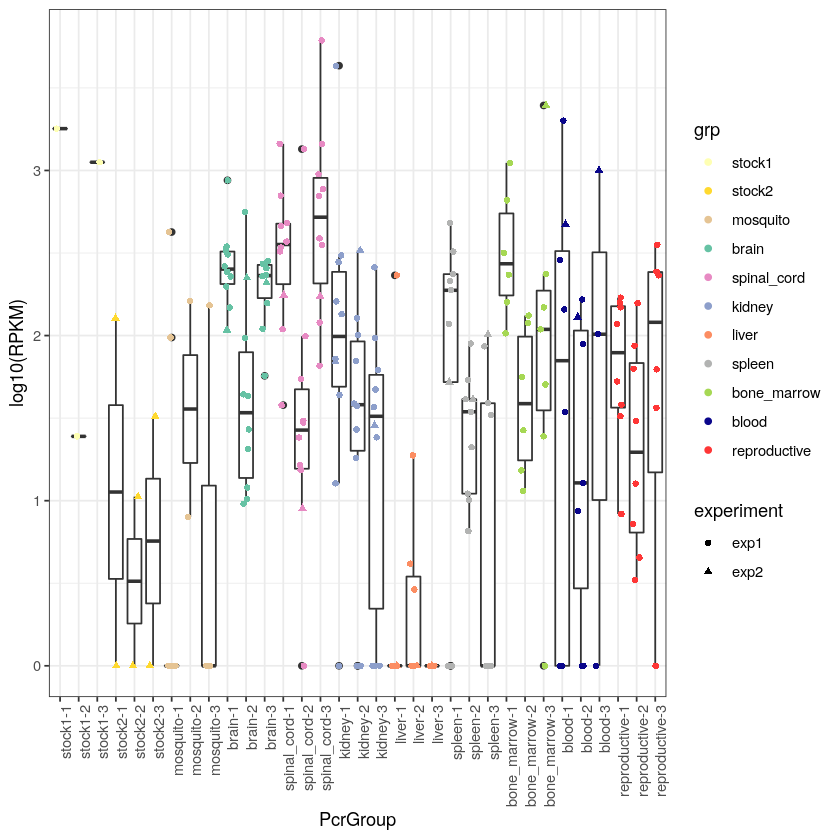

Kruskal Test on DVG FPKM (ZIKA_1) p-value: 2.8177675065741e-11



ZIKA_1
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 114.9046, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   0.829858
         |     1.0000
         |
 blood-3 |  -0.178539  -0.797553
         |     1.0000     1.0000
         |
bone_mar |  -1.801147  -2.520404  -1.204710
         |     1.0000     1.0000     1.0000
         |
bone_mar |   0.306704  -0.474259   0.405187   1.971714
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -0.386066  -1.177314  -0.114390   1.389276  -0.656868
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -1.966565  -2.764410  -1.233443   0.077279  -2.12

Kruskal Test on DVG diversity (ZIKA_1) p-value: 3.28930275749912e-15



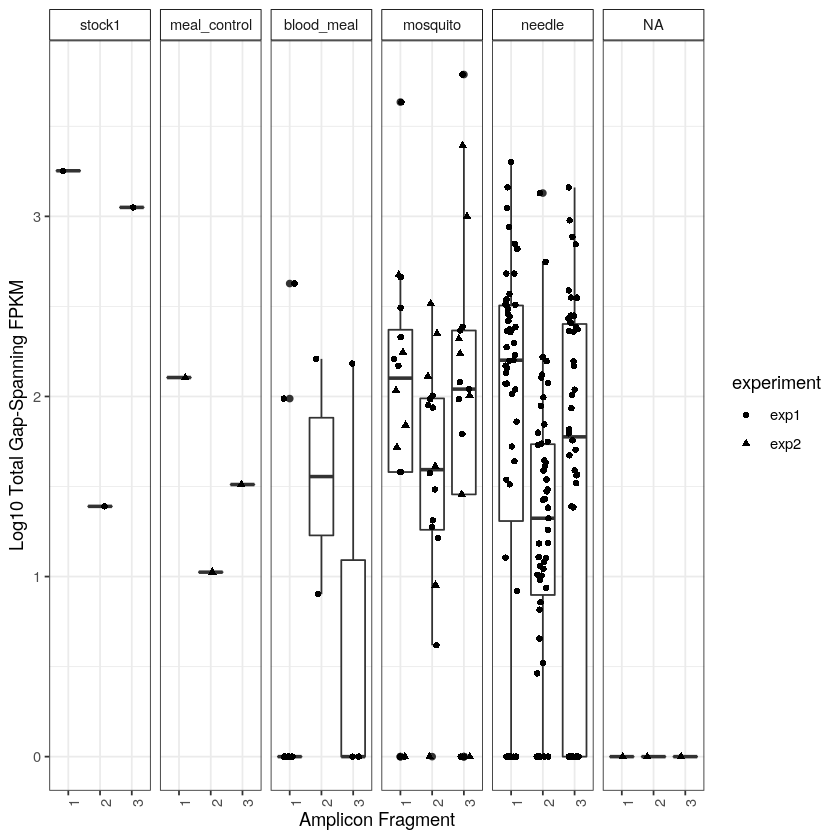

ZIKA_1
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 138.51, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   0.104590
         |     1.0000
         |
 blood-3 |   0.213353   0.130872
         |     1.0000     1.0000
         |
bone_mar |  -2.488628  -2.513071  -2.104991
         |     1.0000     1.0000     1.0000
         |
bone_mar |  -1.752234  -1.798234  -1.542561   0.688833
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -0.912349  -0.984647  -0.893577   1.567052   0.852215
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -3.997387  -3.957460  -3.099845  -1.069164  -1.8393

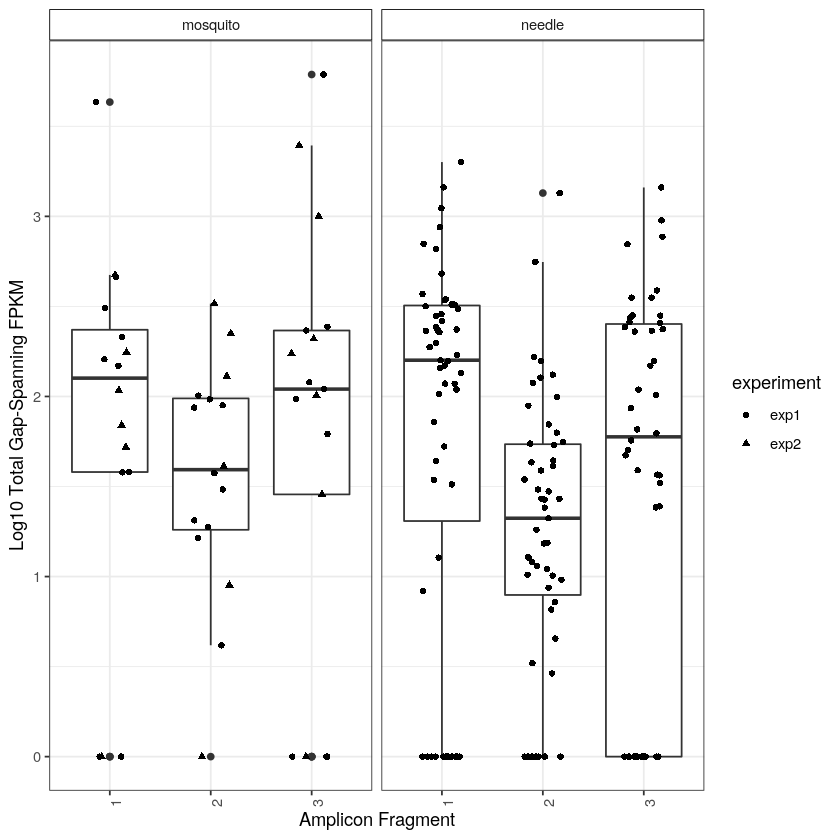

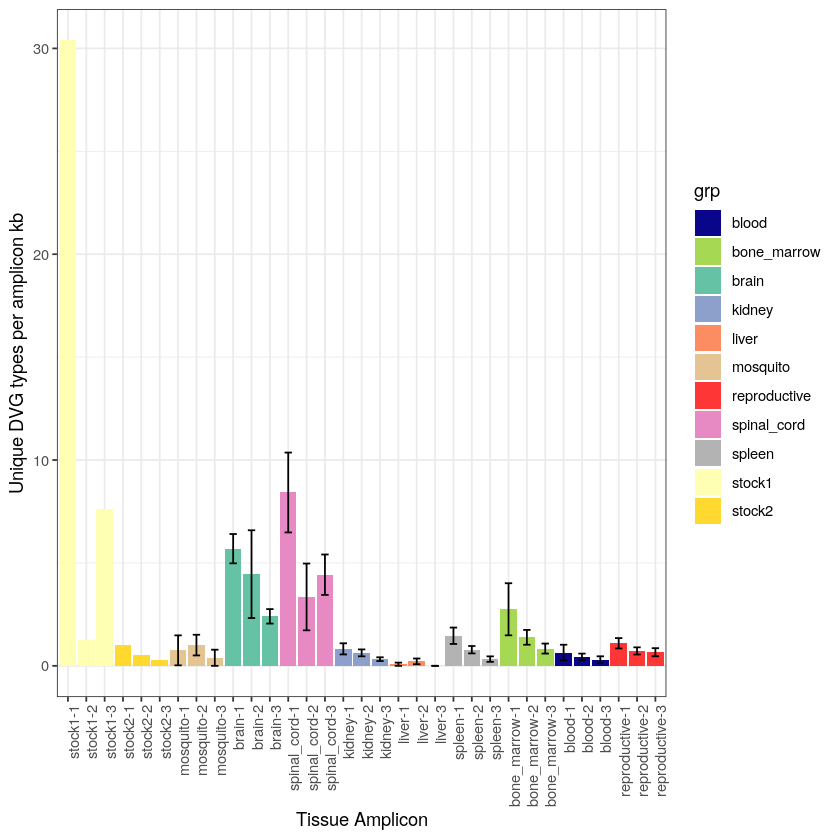

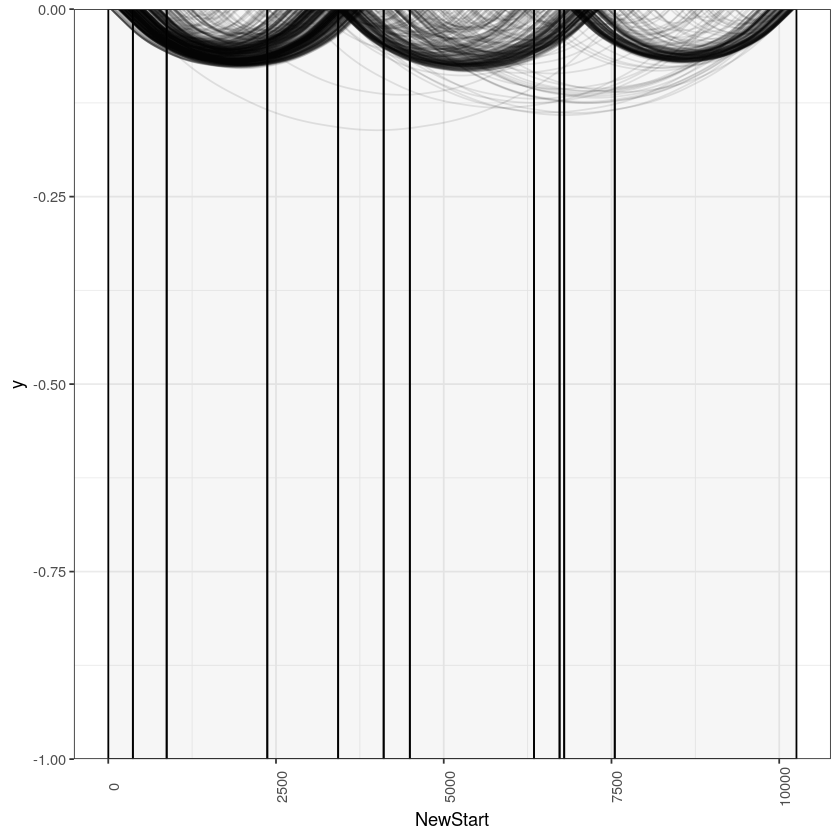

[1] 63
[1] 63


Number of DVGs found to be top across all samples (ZIKA_1): 63



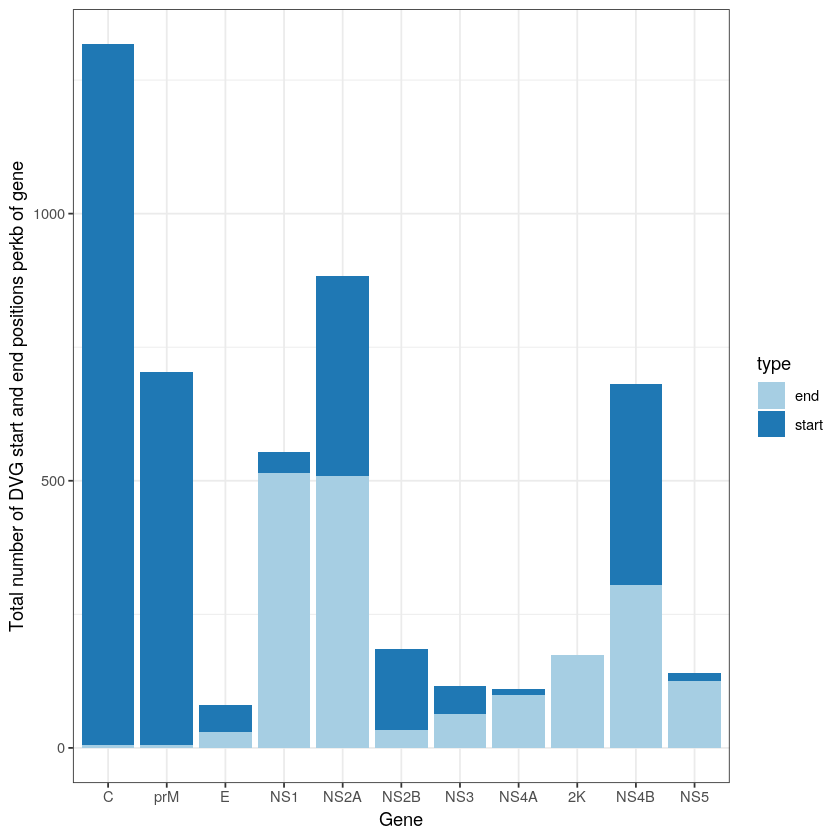

Count in stock and at least one mouse (ZIKA_1): 64

Count across mice (no stock) (ZIKA_1): 182

Count within mice across tissues (ZIKA_1): 8

Count within only one mouse one tissue (ZIKA_1): 920



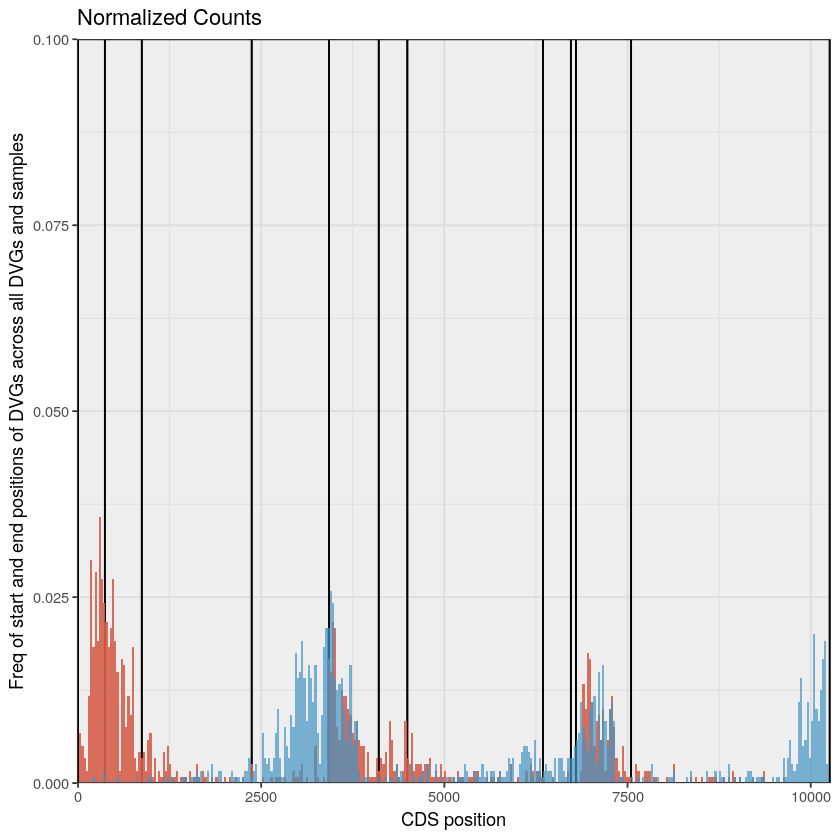

[1] "0.75"
ZIKA_0.75


`summarise()` regrouping output by 'pcr' (override with `.groups` argument)

Dimensions before filtering: 1401434

Dimensions after filtering: 132434



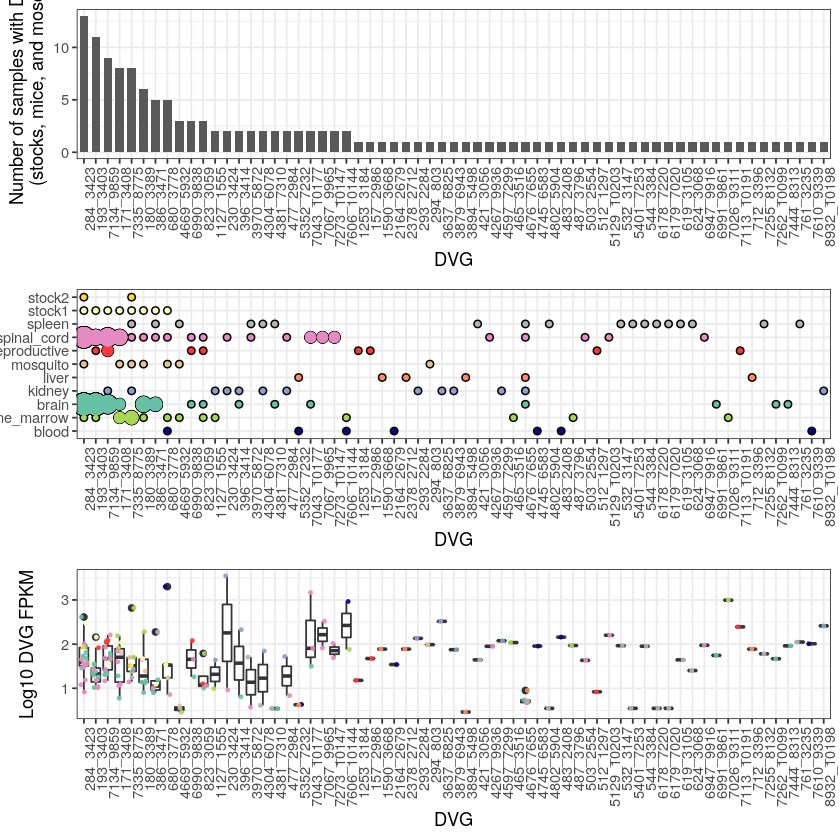

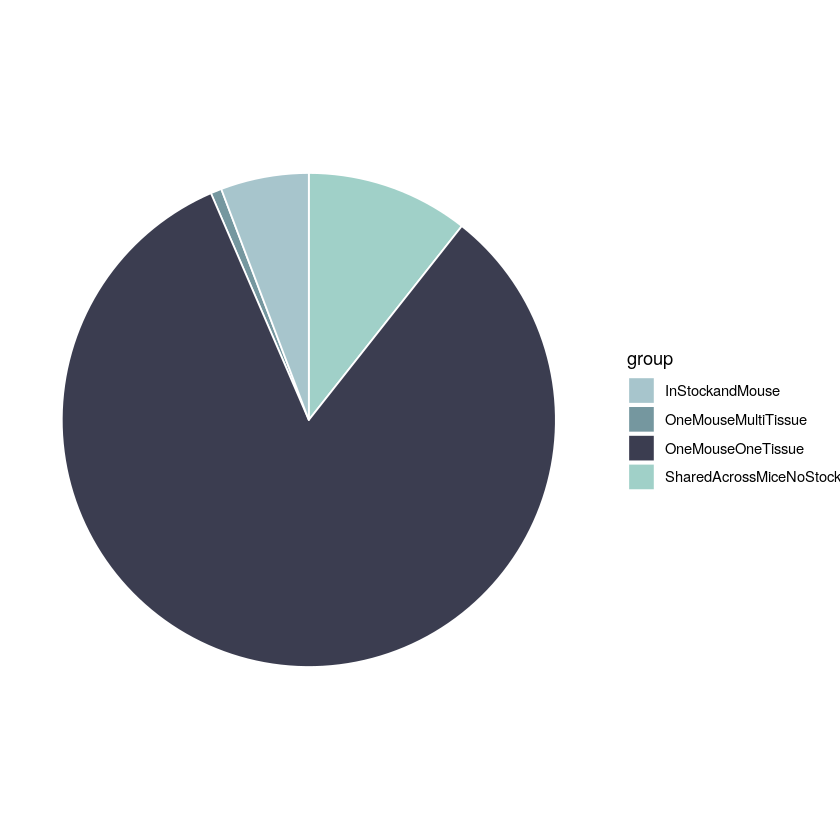

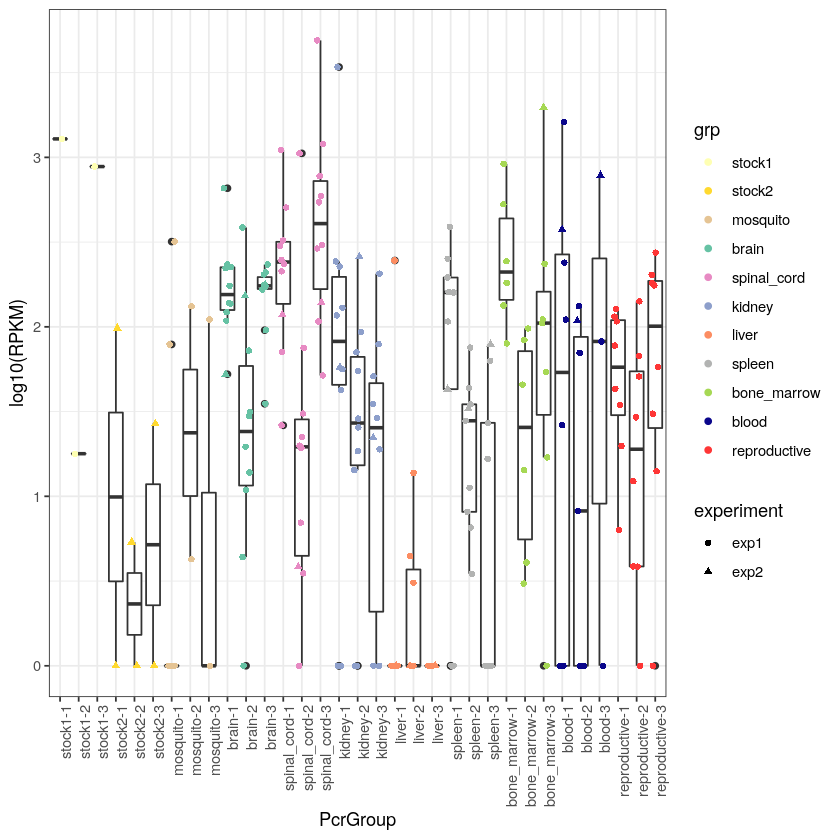

Kruskal Test on DVG FPKM (ZIKA_0.75) p-value: 1.41601589882403e-10



ZIKA_0.75
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 110.5404, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   0.995097
         |     1.0000
         |
 blood-3 |  -0.190602  -0.933317
         |     1.0000     1.0000
         |
bone_mar |  -1.832613  -2.704664  -1.217193
         |     1.0000     1.0000     1.0000
         |
bone_mar |   0.510475  -0.430167   0.572370   2.191759
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -0.485484  -1.433566  -0.177118   1.327337  -0.947158
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -1.667462  -2.650049  -1.005510   0.384930  -2

Kruskal Test on DVG diversity (ZIKA_0.75) p-value: 1.49863454163785e-13



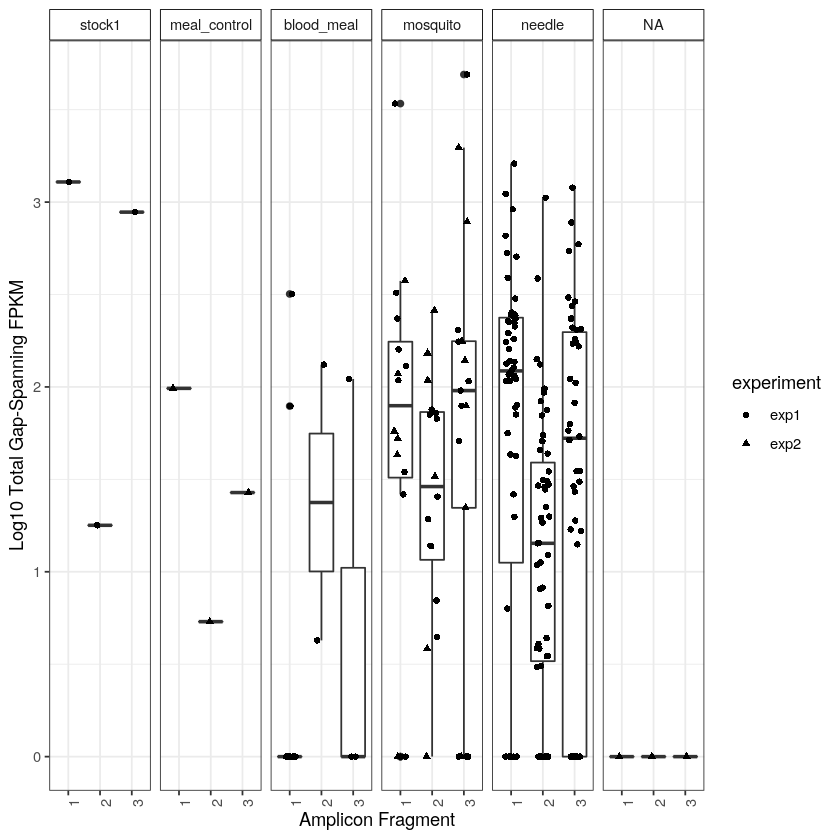

ZIKA_0.75
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 128.7114, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   0.346199
         |     1.0000
         |
 blood-3 |   0.159534  -0.103134
         |     1.0000     1.0000
         |
bone_mar |  -2.488131  -2.737348  -2.053084
         |     1.0000     1.0000     1.0000
         |
bone_mar |  -0.859405  -1.156302  -0.809124   1.523533
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -1.187928  -1.485413  -1.047461   1.310209  -0.270836
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -3.507334  -3.739508  -2.691375  -0.619541  -2

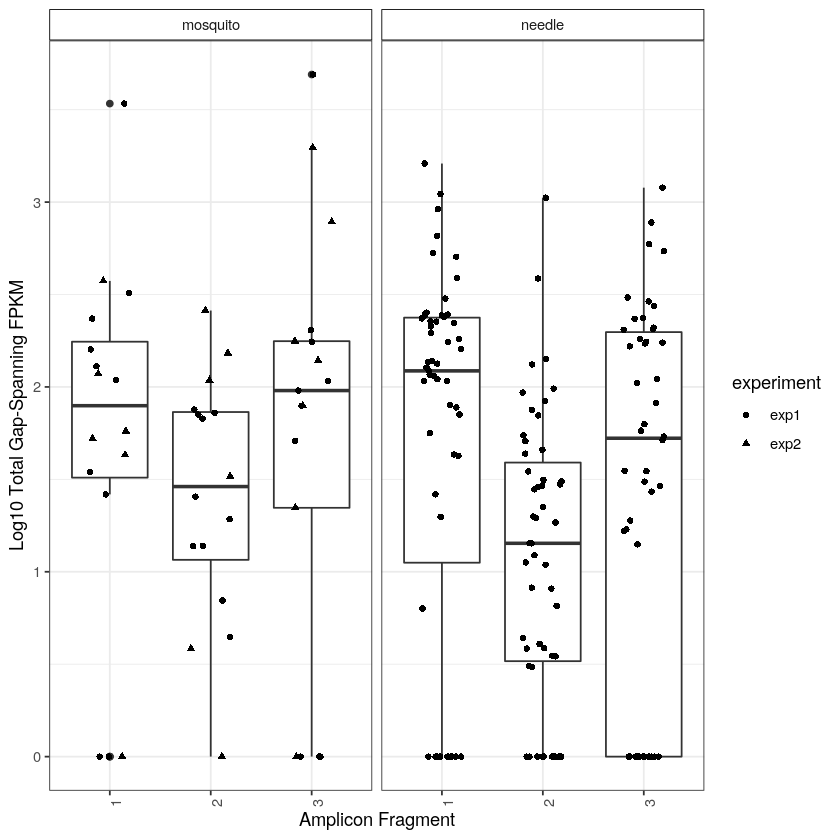

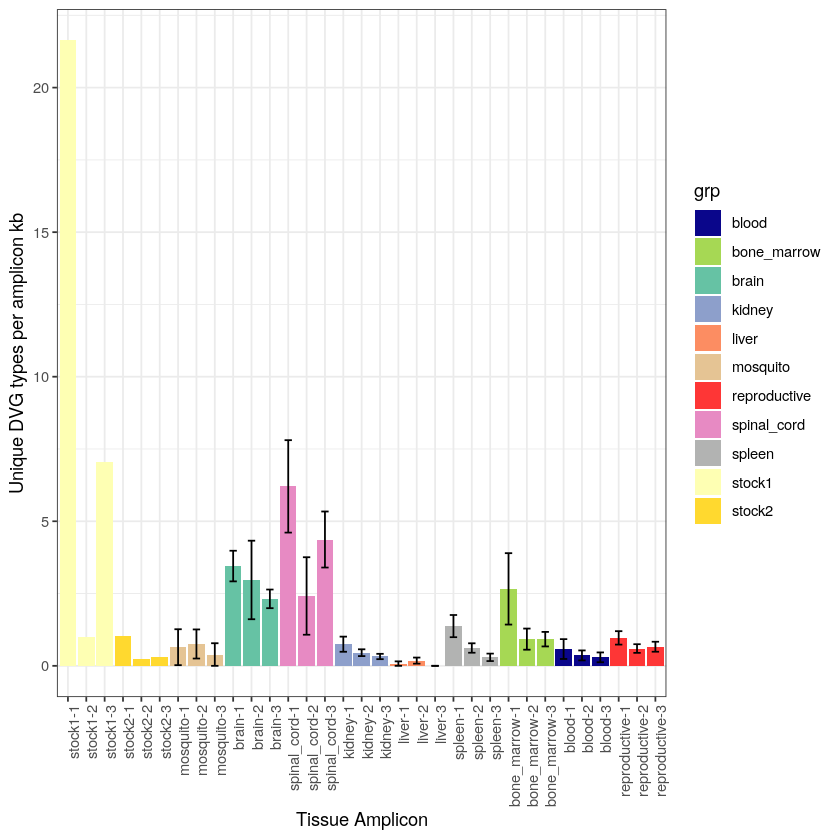

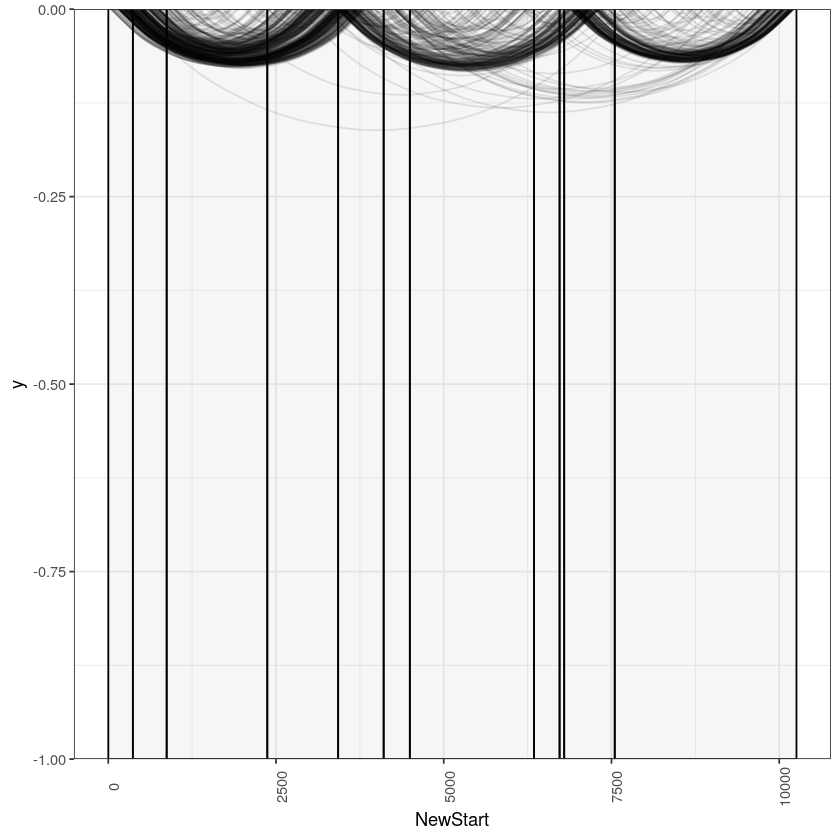

[1] 60
[1] 60


Number of DVGs found to be top across all samples (ZIKA_0.75): 60



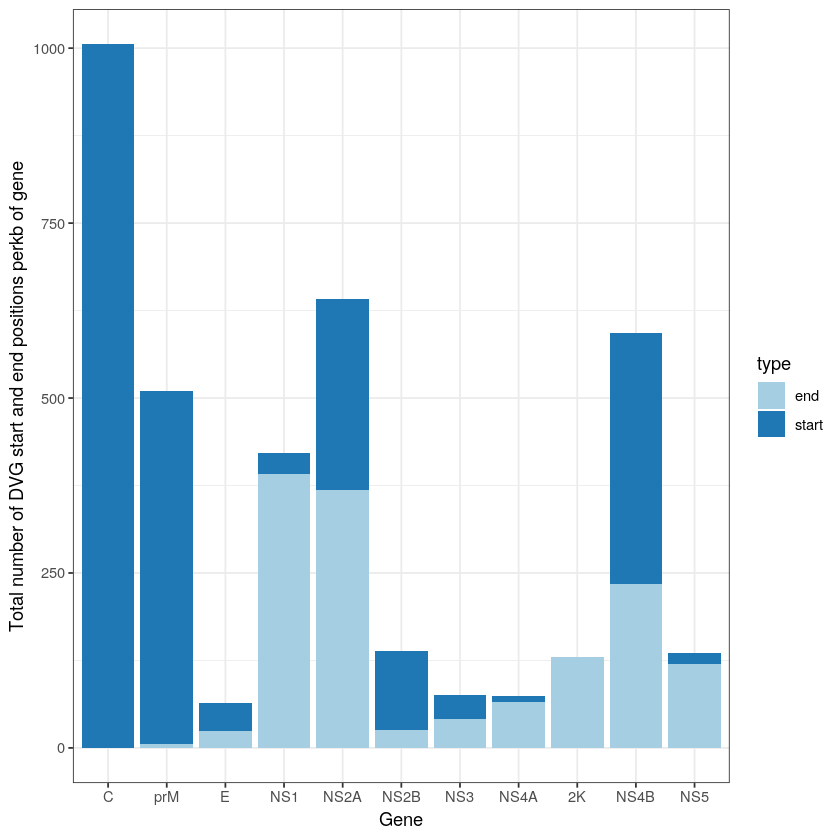

Count in stock and at least one mouse (ZIKA_0.75): 49

Count across mice (no stock) (ZIKA_0.75): 136

Count within mice across tissues (ZIKA_0.75): 4

Count within only one mouse one tissue (ZIKA_0.75): 760



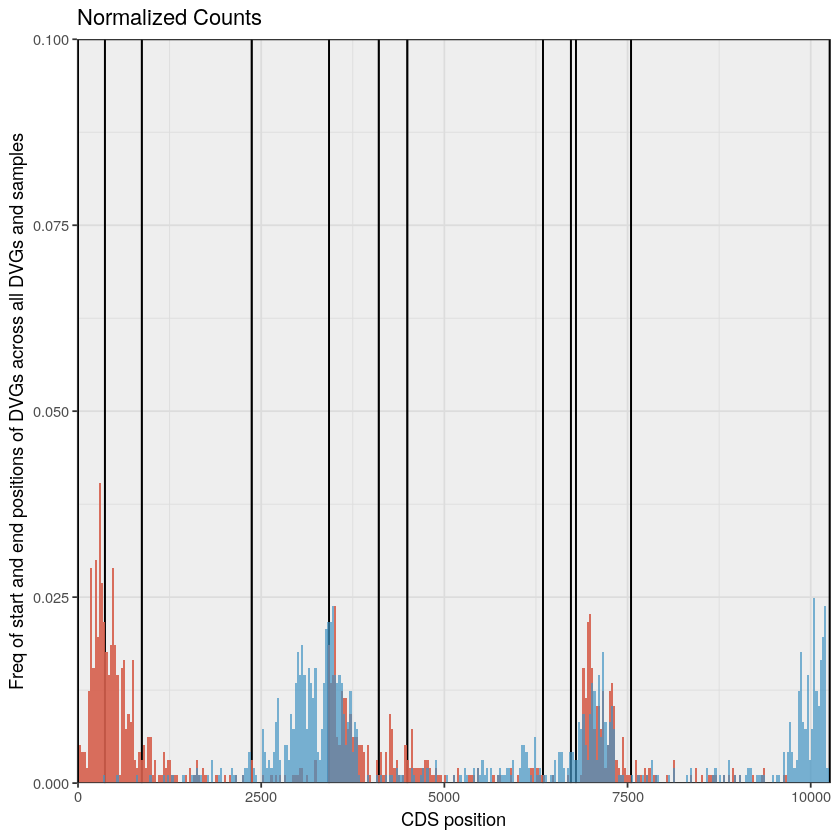

[1] "0.50"
ZIKA_0.50


`summarise()` regrouping output by 'pcr' (override with `.groups` argument)

Dimensions before filtering: 1075934

Dimensions after filtering: 106834



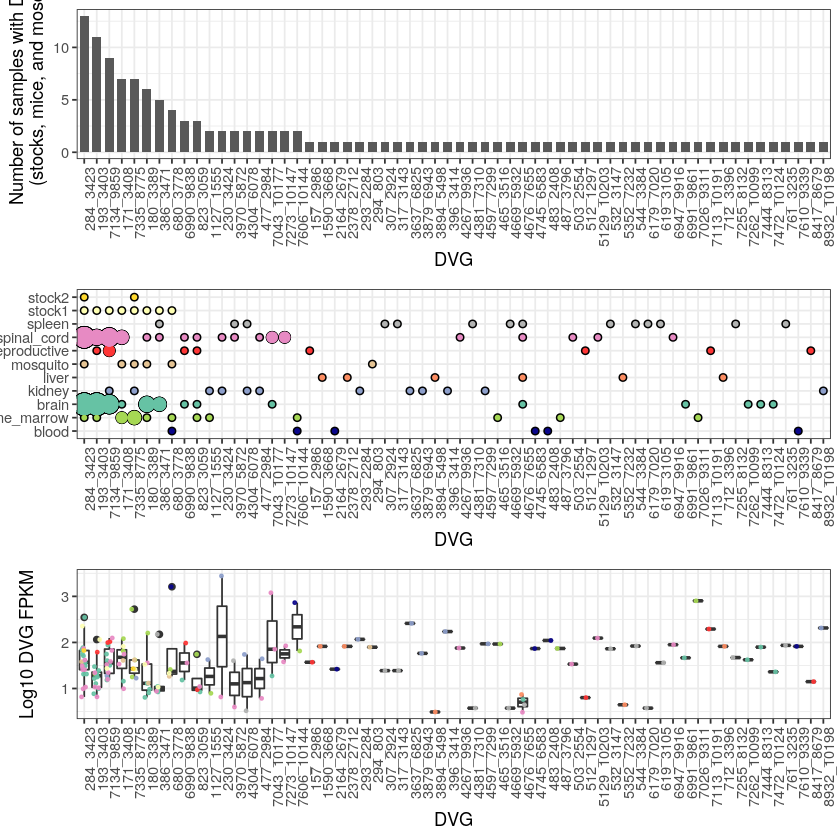

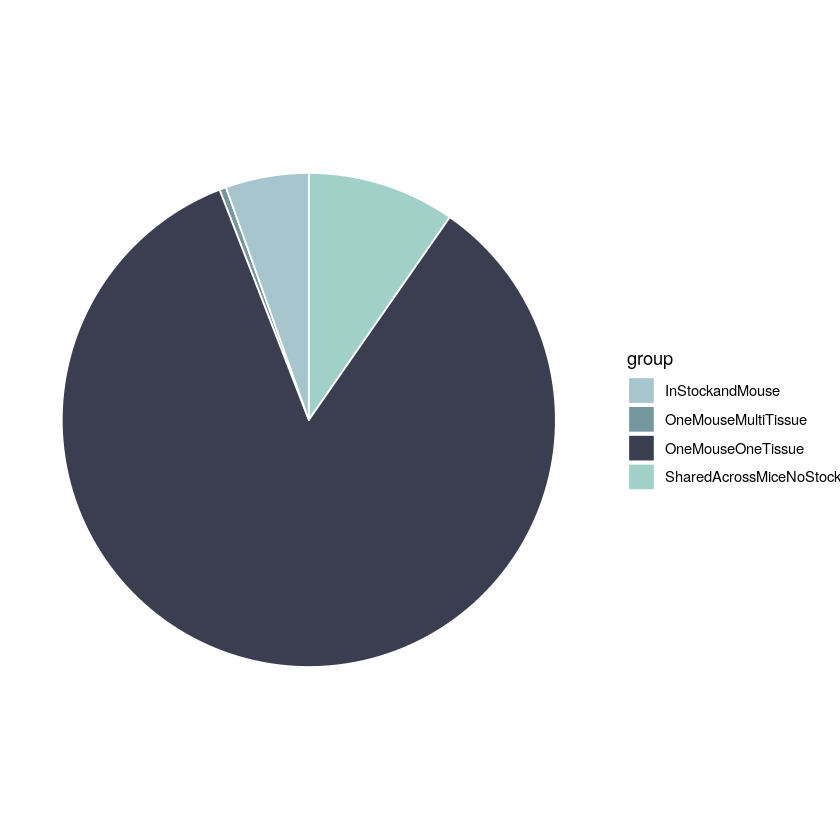

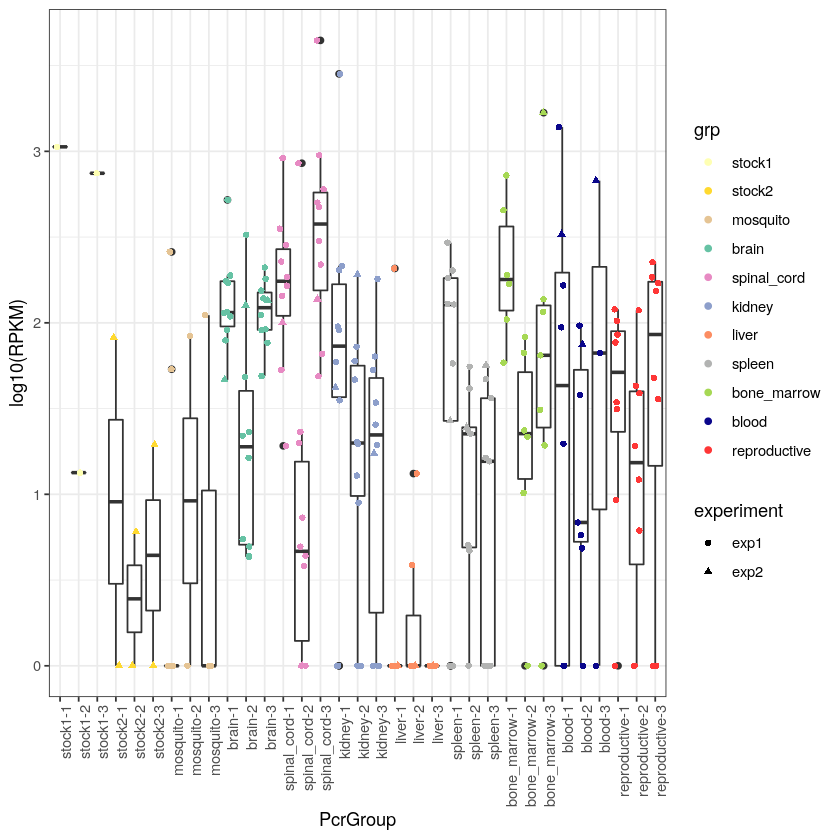

Kruskal Test on DVG FPKM (ZIKA_0.50) p-value: 3.99101350513055e-10



ZIKA_0.50
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 107.7077, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   0.685301
         |     1.0000
         |
 blood-3 |  -0.215274  -0.725175
         |     1.0000     1.0000
         |
bone_mar |  -1.810561  -2.395066  -1.176730
         |     1.0000     1.0000     1.0000
         |
bone_mar |   0.500490  -0.151669   0.588365   2.161791
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -0.437550  -1.087196  -0.116963   1.350522  -0.892874
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -1.621791  -2.280738  -0.947227   0.403820  -2

Kruskal Test on DVG diversity (ZIKA_0.50) p-value: 3.8651365316031e-13



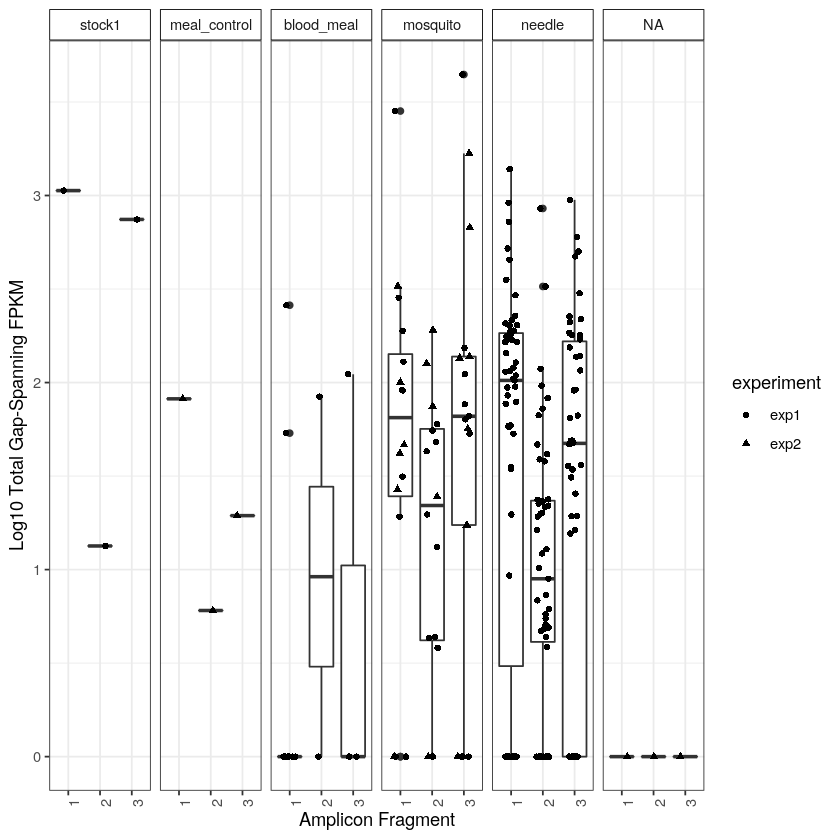

ZIKA_0.50
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 126.2481, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |  -0.160511
         |     1.0000
         |
 blood-3 |  -0.044196   0.077024
         |     1.0000     1.0000
         |
bone_mar |  -2.546130  -2.322275  -1.902324
         |     1.0000     1.0000     1.0000
         |
bone_mar |  -1.021342  -0.842125  -0.737748   1.426308
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -1.203299  -1.009675  -0.859115   1.352211  -0.127938
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -3.643231  -3.338160  -2.579774  -0.683714  -2

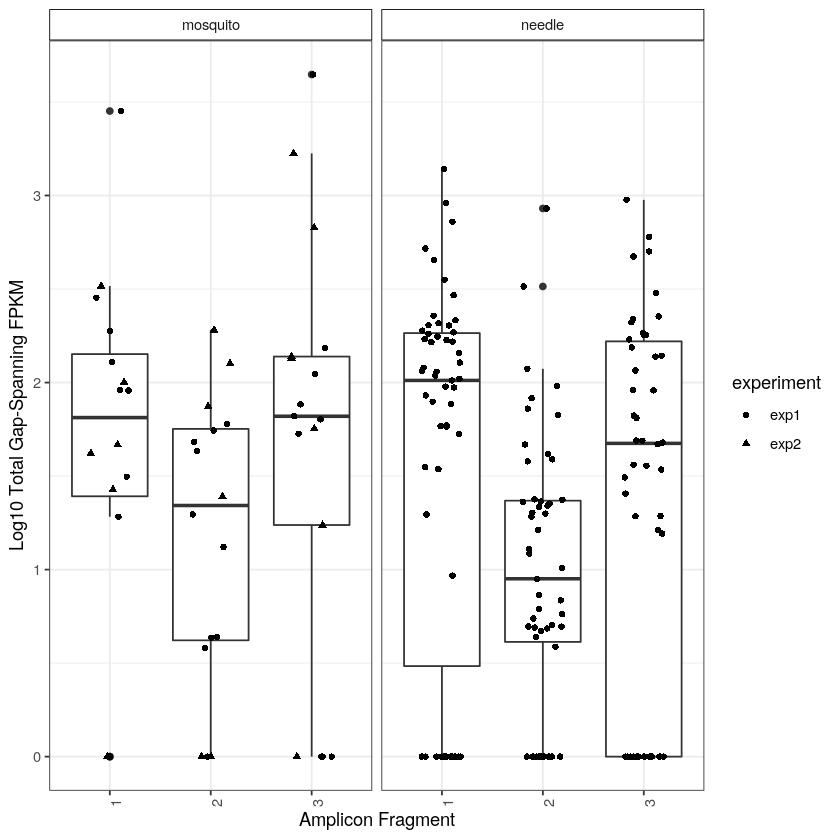

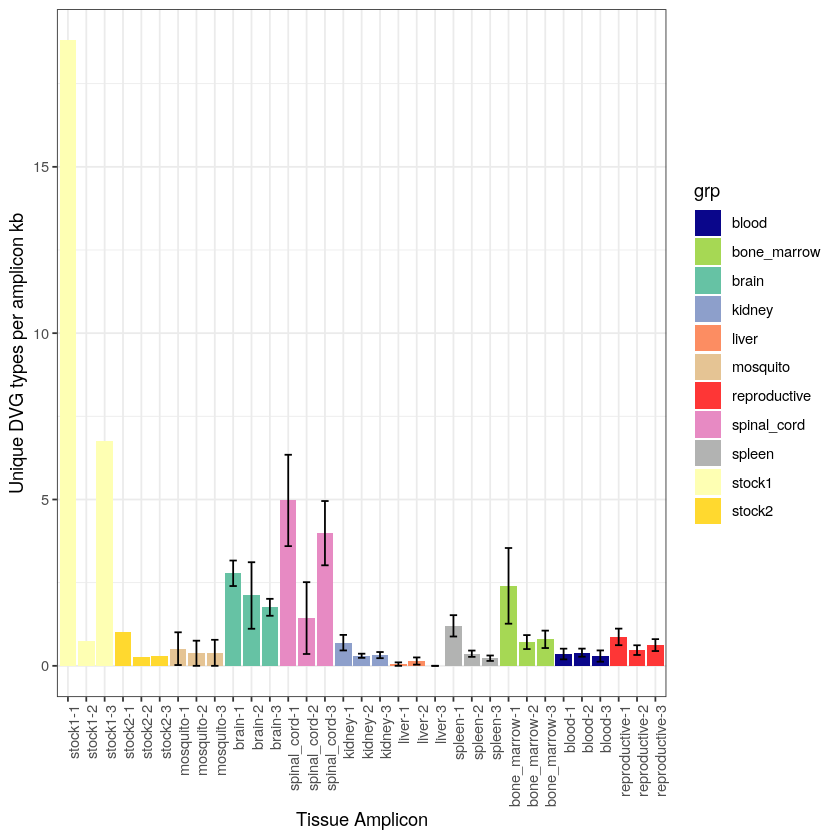

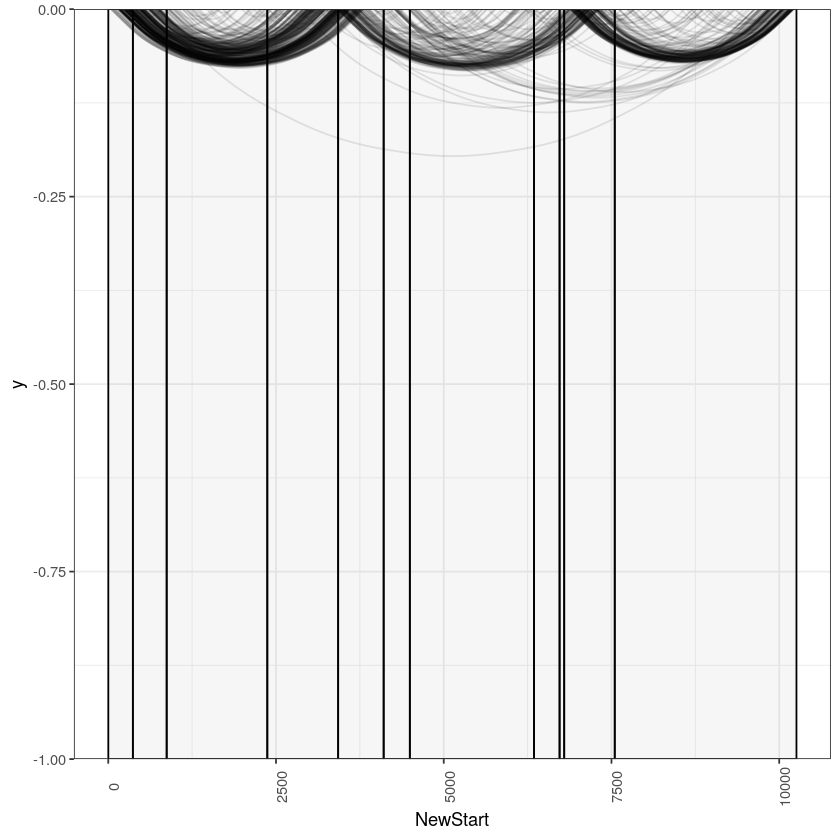

[1] 56
[1] 56


Number of DVGs found to be top across all samples (ZIKA_0.50): 56



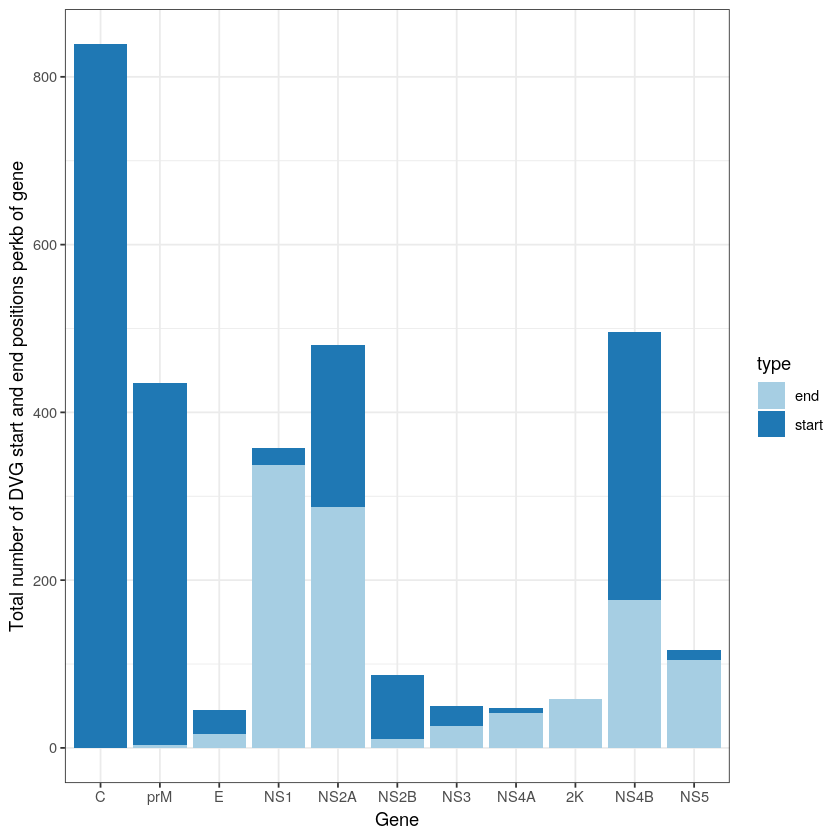

Count in stock and at least one mouse (ZIKA_0.50): 40

Count across mice (no stock) (ZIKA_0.50): 100

Count within mice across tissues (ZIKA_0.50): 4

Count within only one mouse one tissue (ZIKA_0.50): 618



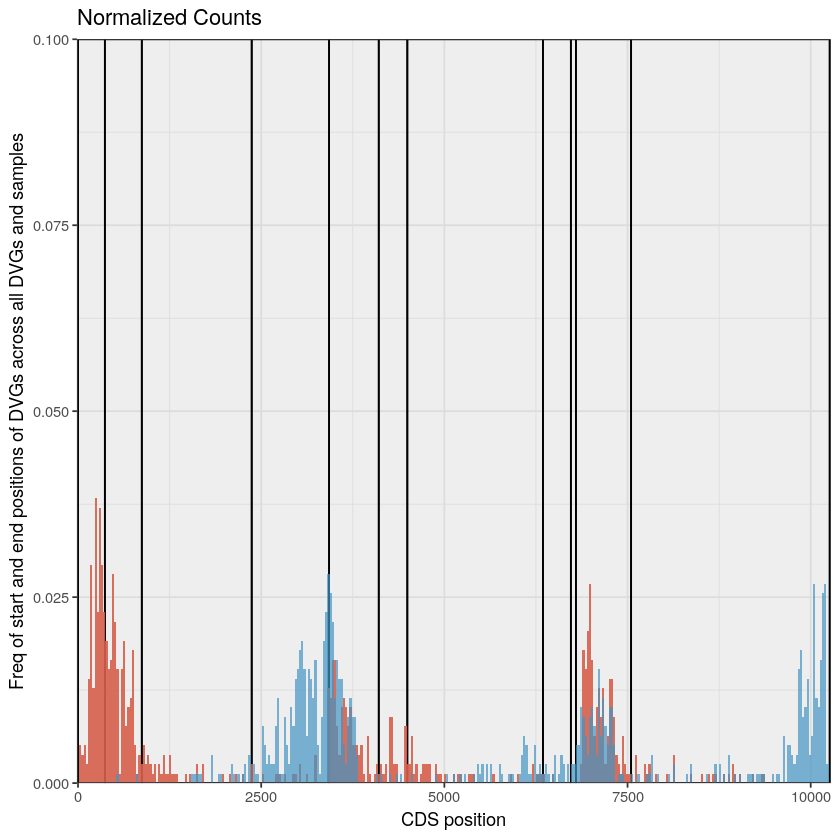

[1] "0.25"
ZIKA_0.25


`summarise()` regrouping output by 'pcr' (override with `.groups` argument)

Dimensions before filtering: 656834

Dimensions after filtering: 117034



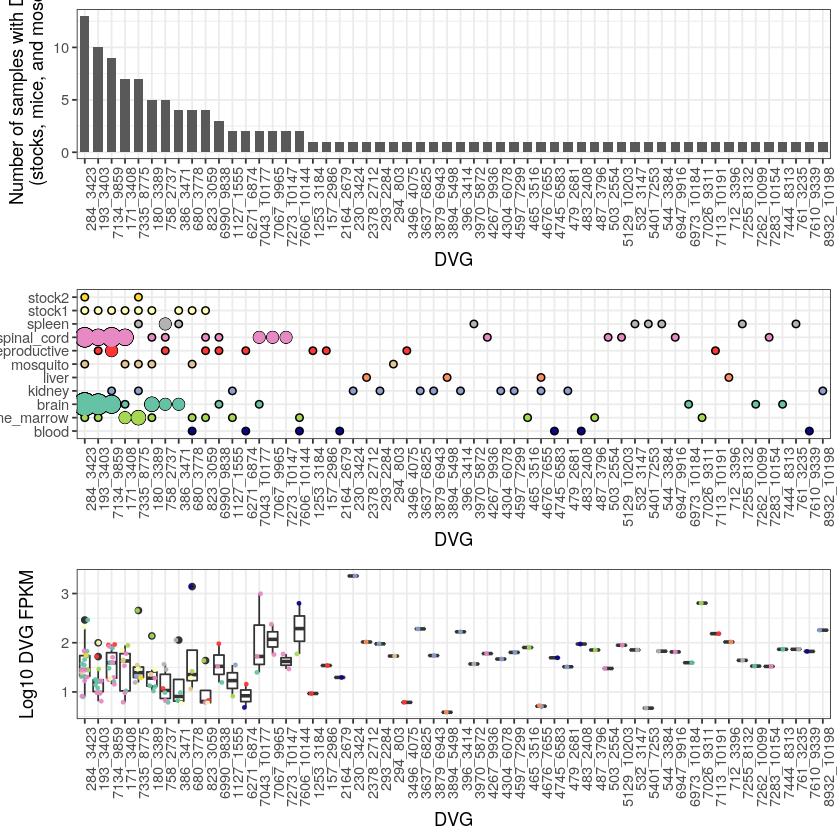

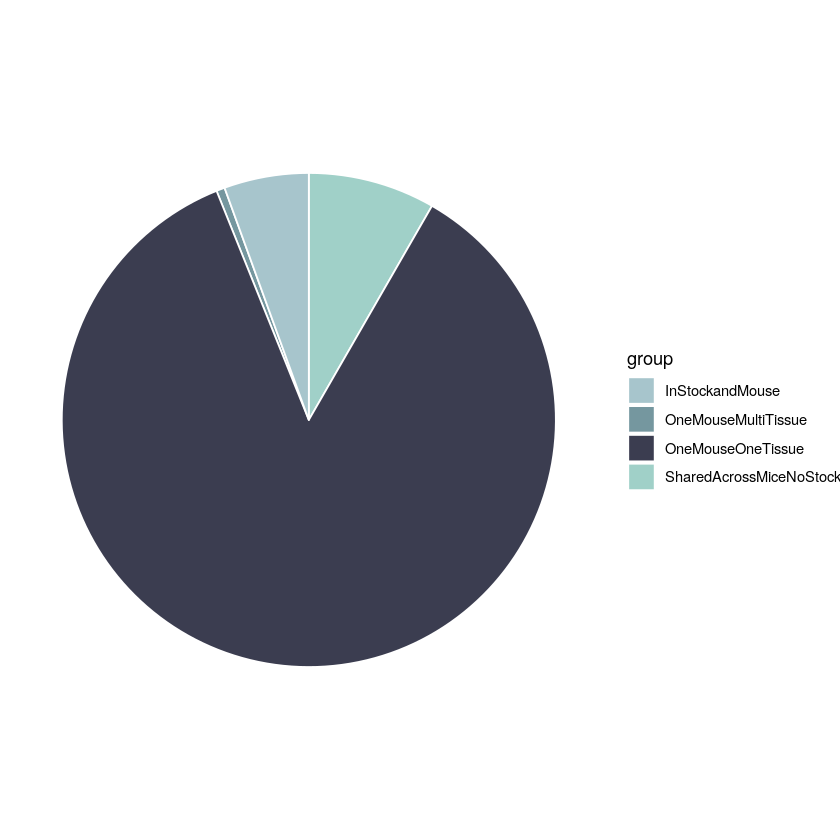

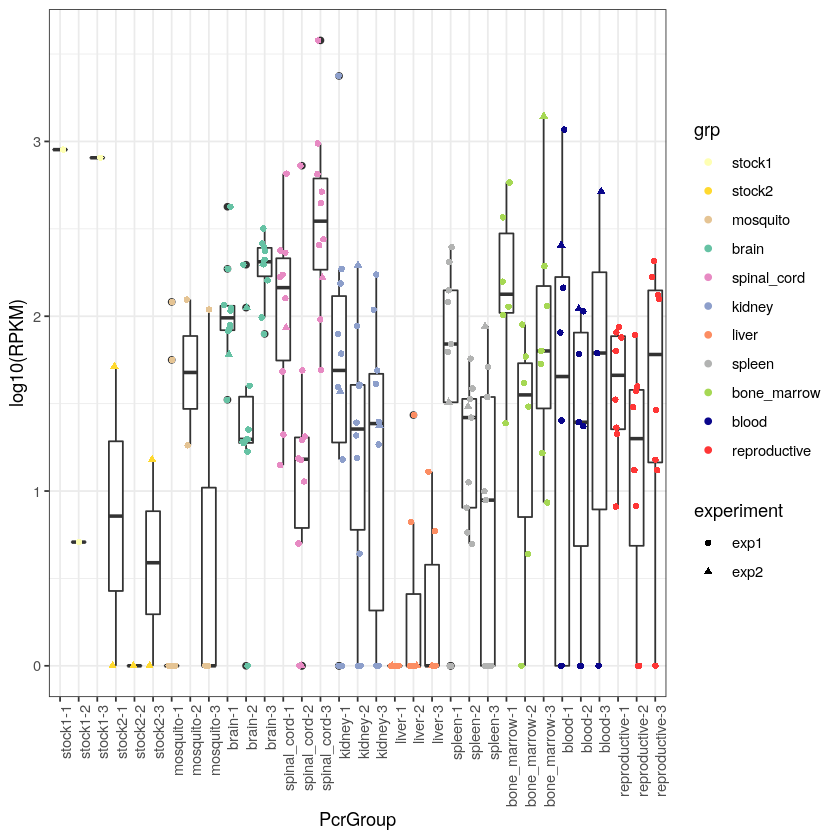

Kruskal Test on DVG FPKM (ZIKA_0.25) p-value: 4.85625605064364e-11



ZIKA_0.25
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 113.4396, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   0.422166
         |     1.0000
         |
 blood-3 |  -0.206671  -0.519384
         |     1.0000     1.0000
         |
bone_mar |  -1.564586  -1.911509  -0.997099
         |     1.0000     1.0000     1.0000
         |
bone_mar |   0.424648   0.019491   0.522203   1.860758
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -0.796656  -1.180120  -0.394732   0.777686  -1.153314
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -1.414645  -1.805007  -0.806810   0.336849  -1

Kruskal Test on DVG diversity (ZIKA_0.25) p-value: 2.41922455338546e-13



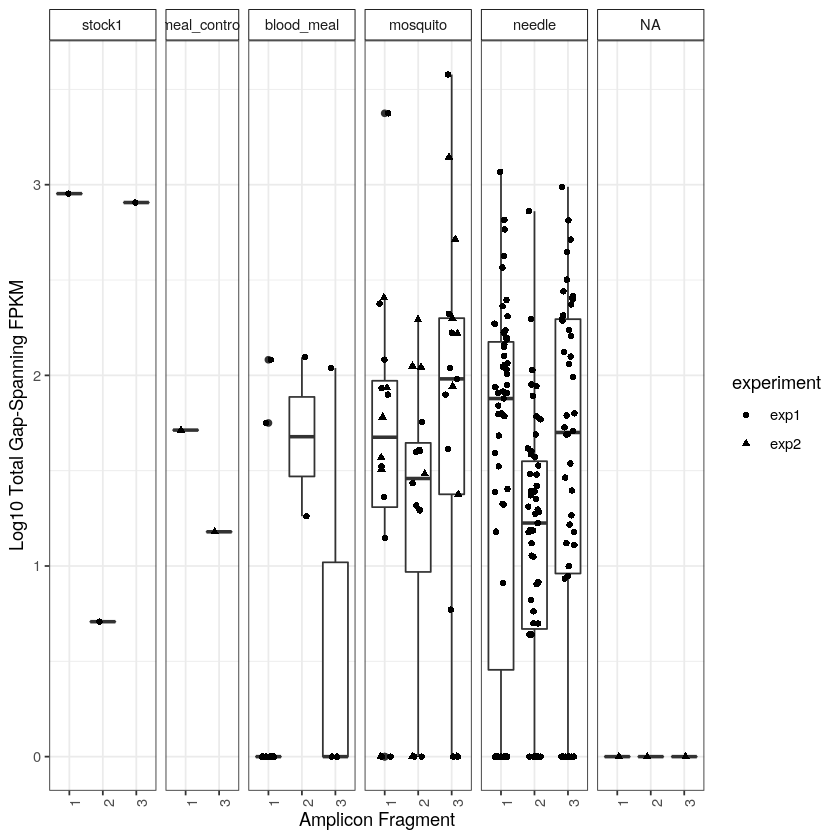

ZIKA_0.25
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 127.468, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |  -1.086725
         |     1.0000
         |
 blood-3 |   0.045526   0.859708
         |     1.0000     1.0000
         |
bone_mar |  -2.091175  -1.019018  -1.640749
         |     1.0000     1.0000     1.0000
         |
bone_mar |  -1.151618  -0.106966  -0.923151   0.878875
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -1.817478  -0.707548  -1.407773   0.339228  -0.572823
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -3.277732  -2.013636  -2.408678  -0.823785  -1.

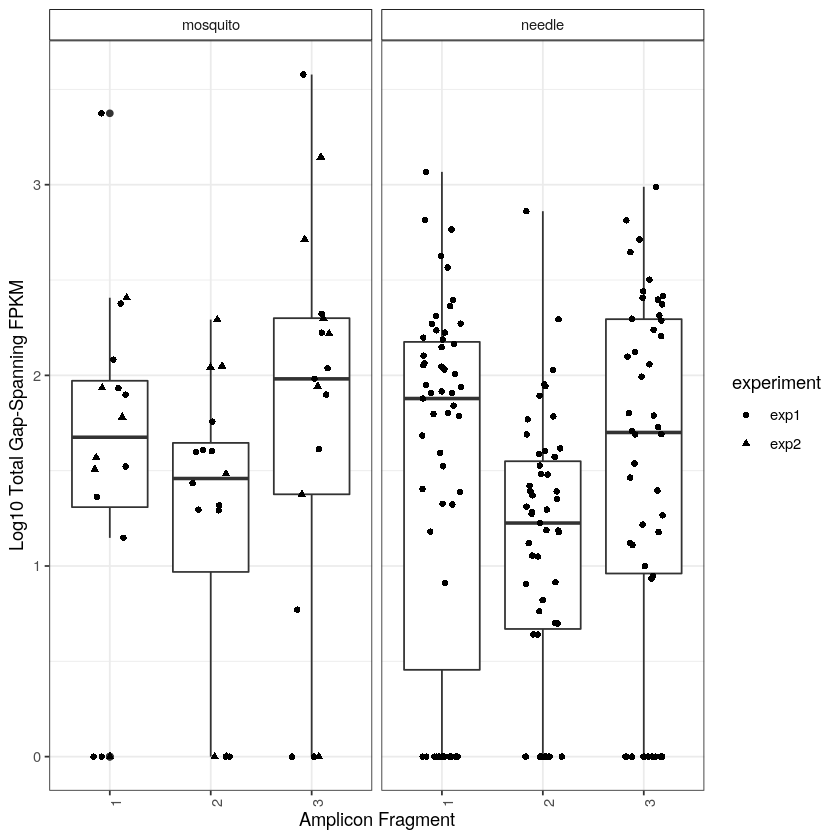

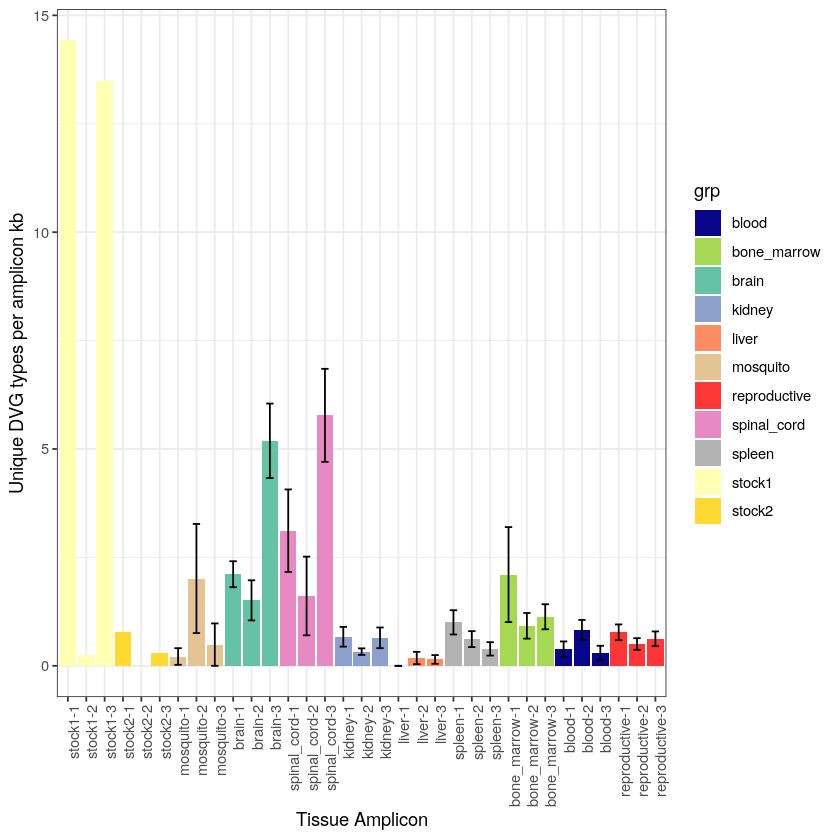

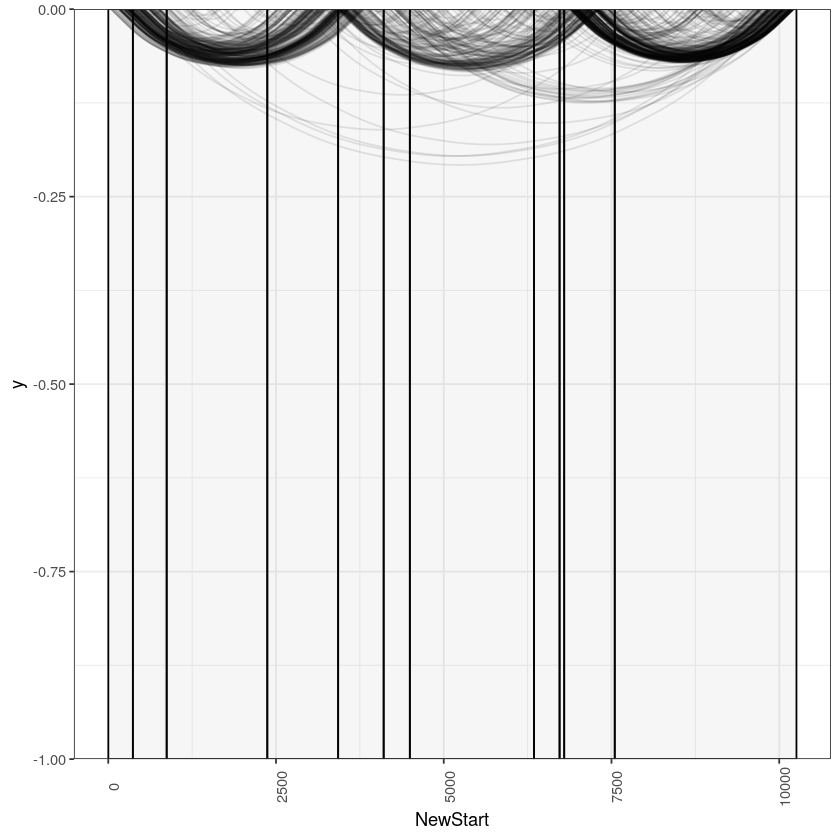

[1] 56
[1] 56


Number of DVGs found to be top across all samples (ZIKA_0.25): 56



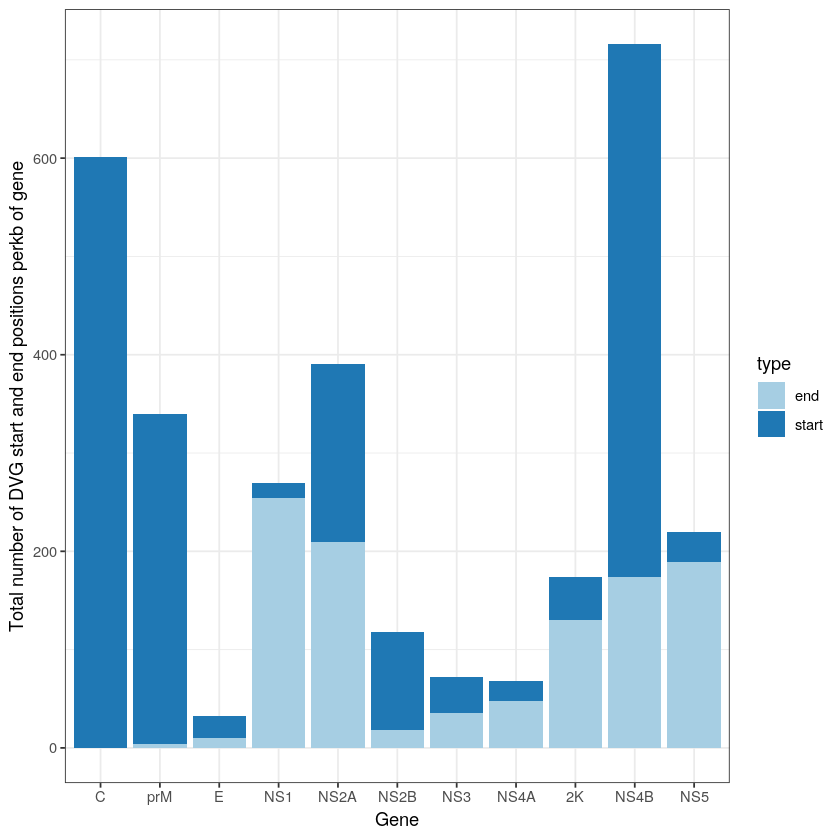

Count in stock and at least one mouse (ZIKA_0.25): 36

Count across mice (no stock) (ZIKA_0.25): 119

Count within mice across tissues (ZIKA_0.25): 3

Count within only one mouse one tissue (ZIKA_0.25): 688



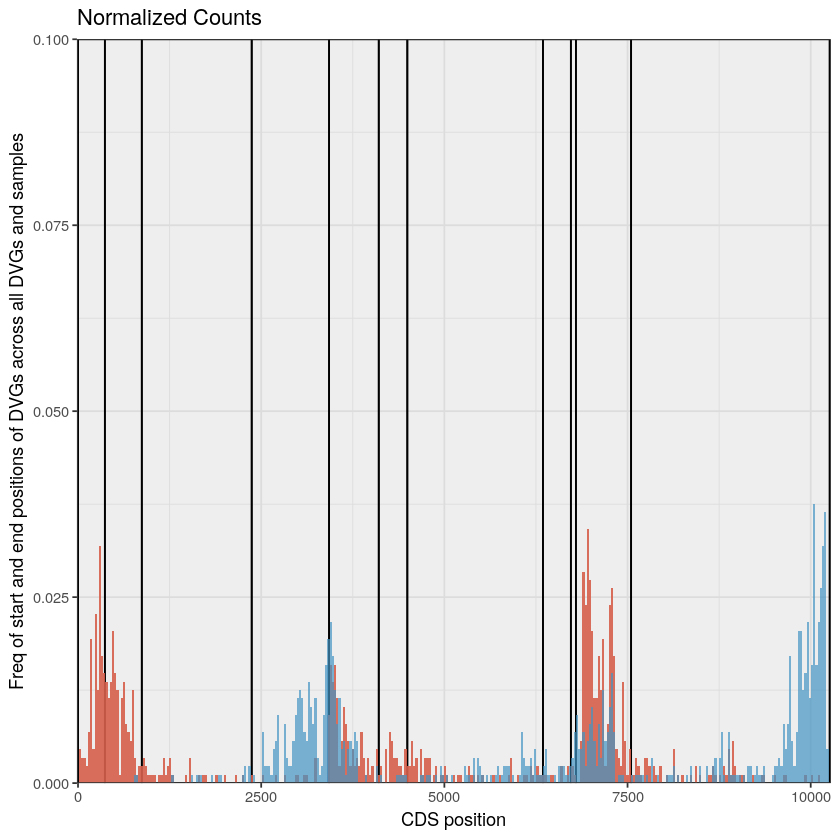

[1] "0.10"
ZIKA_0.10


`summarise()` regrouping output by 'pcr' (override with `.groups` argument)

Dimensions before filtering: 328534

Dimensions after filtering: 151034



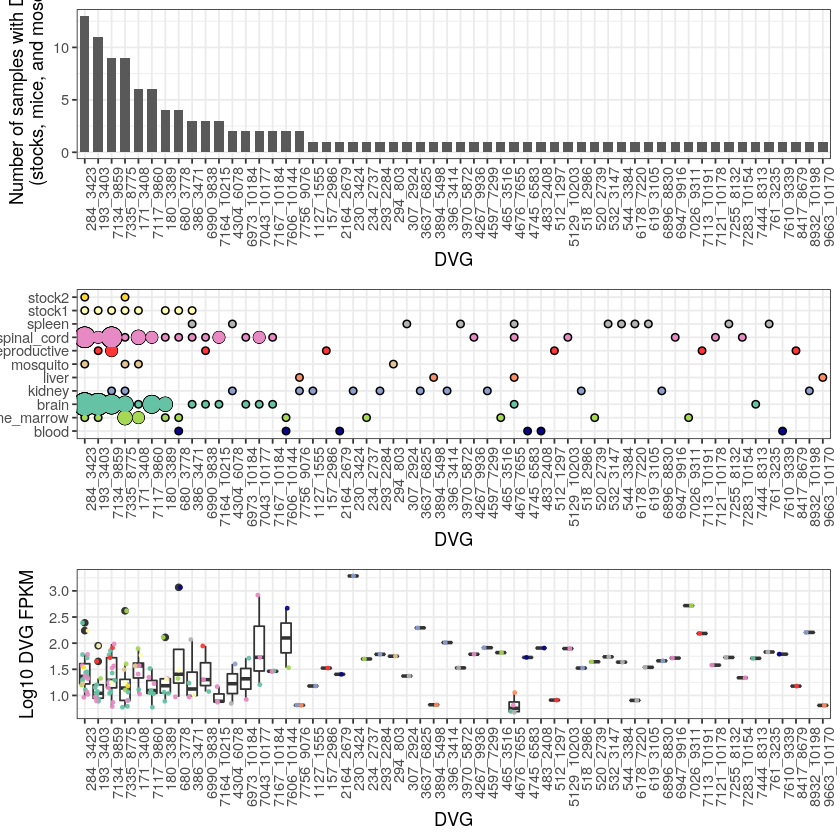

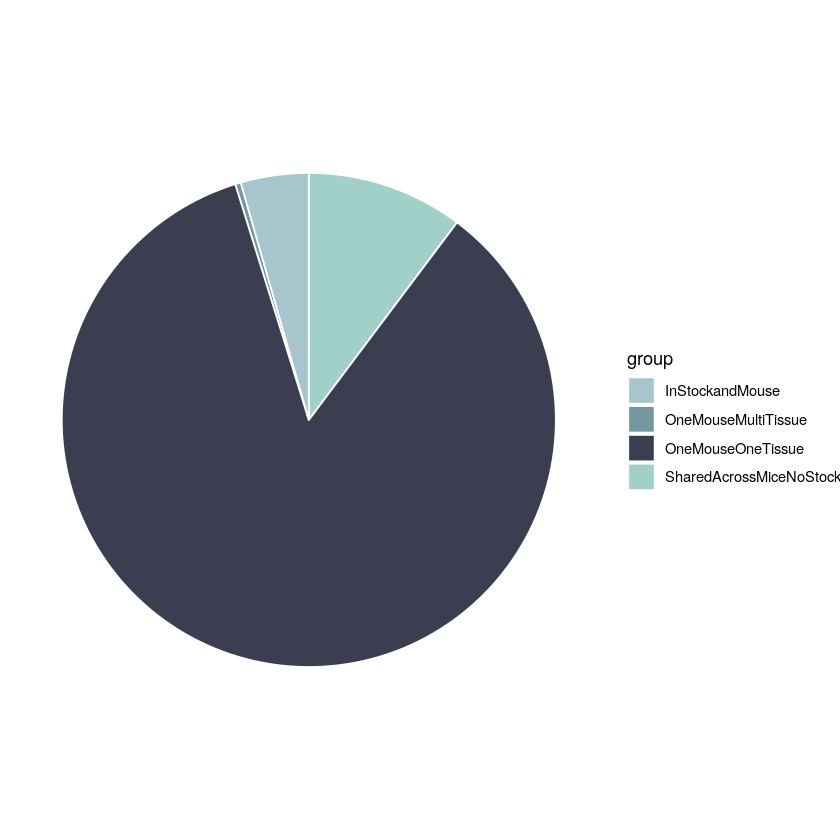

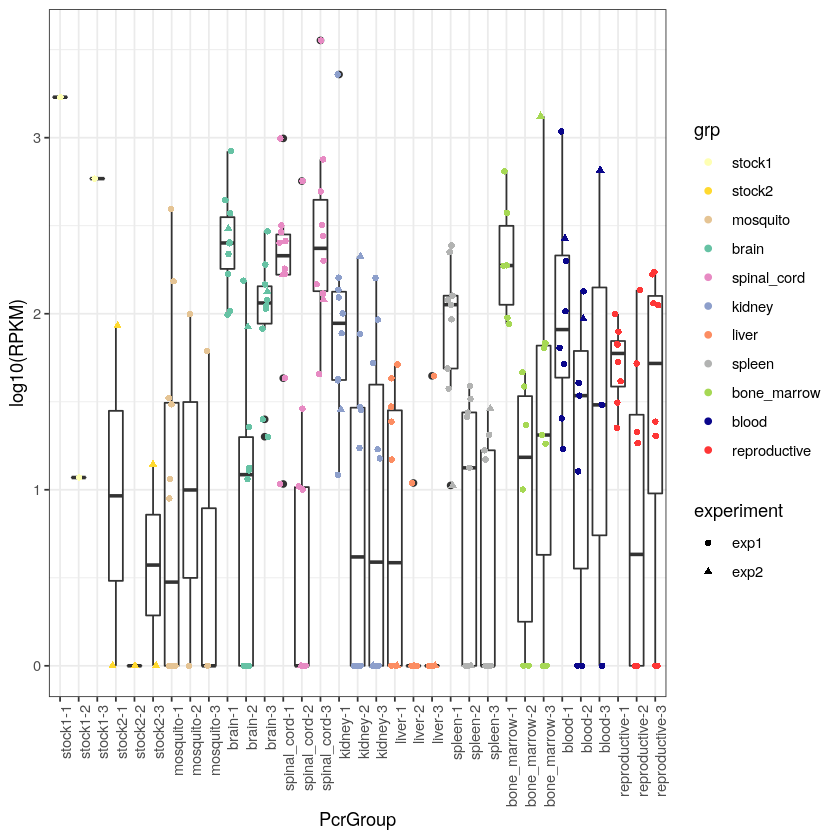

Kruskal Test on DVG FPKM (ZIKA_0.10) p-value: 3.27053135825365e-12



ZIKA_0.10
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 120.6421, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   1.585712
         |     1.0000
         |
 blood-3 |   0.775937  -0.428035
         |     1.0000     1.0000
         |
bone_mar |  -0.838524  -2.289103  -1.383337
         |     1.0000     1.0000     1.0000
         |
bone_mar |   2.103499   0.566793   0.863670   2.752011
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |   1.401427  -0.178433   0.289821   2.117669  -0.738227
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -1.250387  -2.868871  -1.699006  -0.271603  -3

Kruskal Test on DVG diversity (ZIKA_0.10) p-value: 3.63002975482524e-15



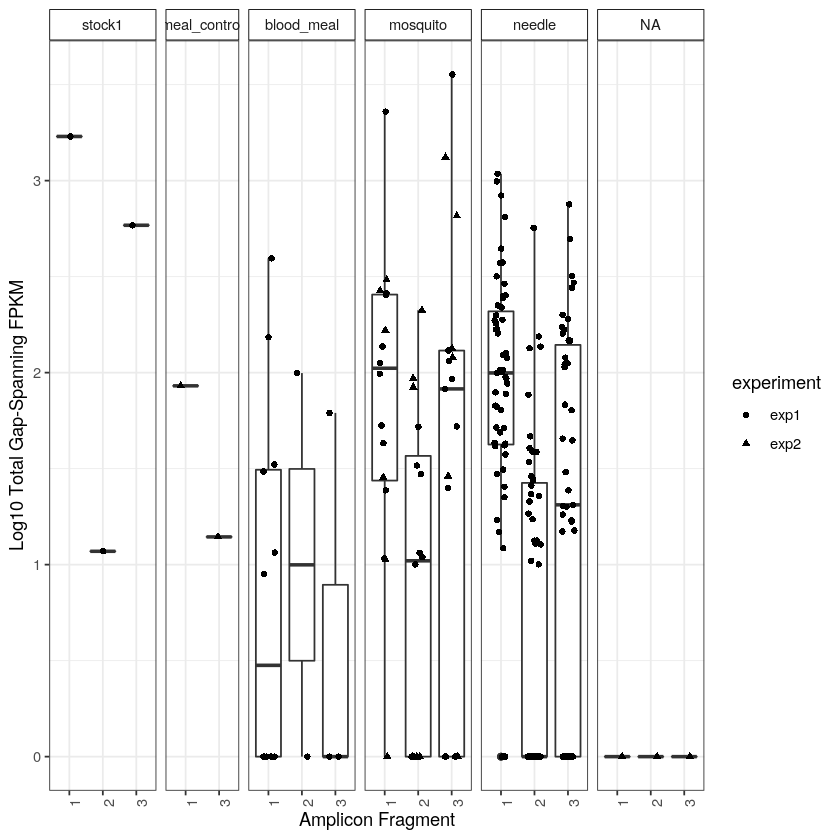

ZIKA_0.10
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 138.2595, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   1.943268
         |     1.0000
         |
 blood-3 |   1.664014   0.175064
         |     1.0000     1.0000
         |
bone_mar |  -0.903127  -2.684434  -2.282947
         |     1.0000     1.0000     1.0000
         |
bone_mar |   2.472575   0.592445   0.295288   3.157680
         |     1.0000     1.0000     1.0000     0.4198
         |
bone_mar |   1.640688  -0.292972  -0.401999   2.402955  -0.873923
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -1.687439  -3.665057  -2.927271  -0.605499  -4

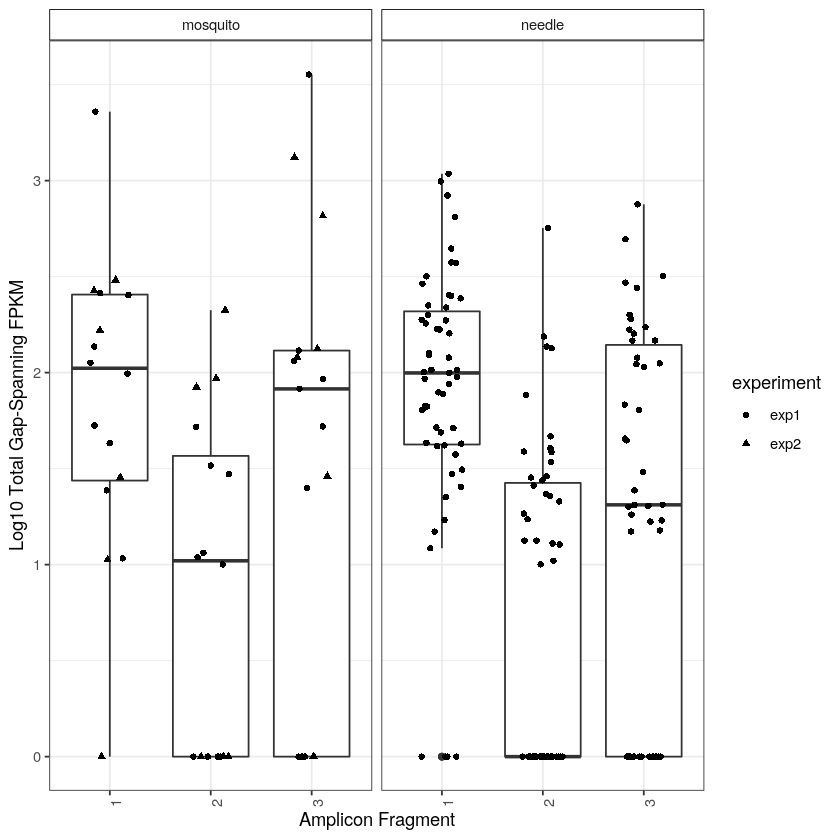

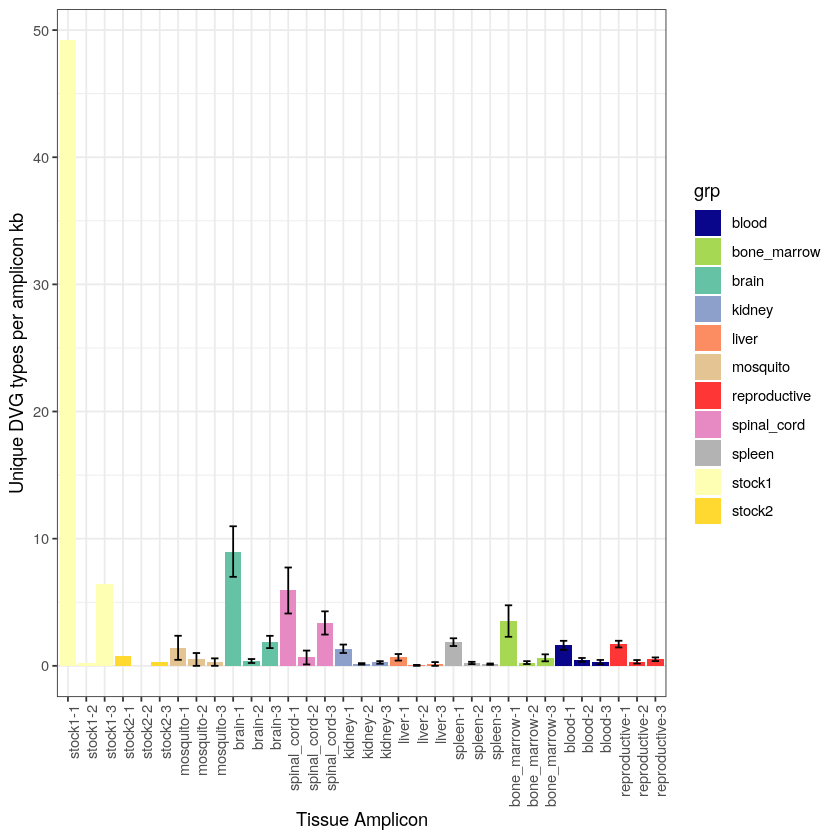

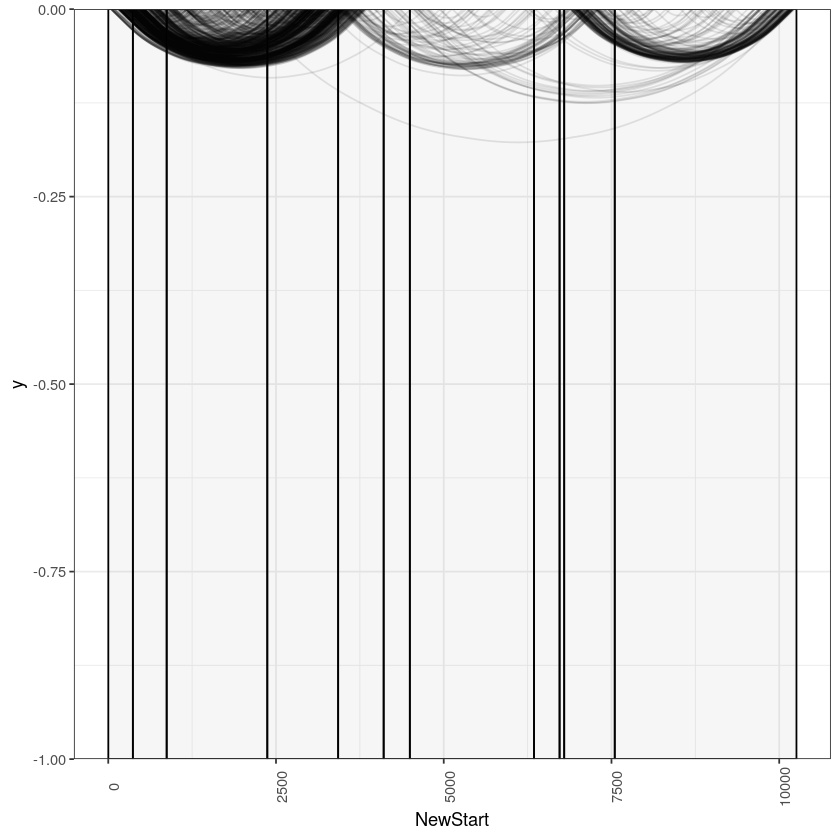

[1] 111
[1] 111


Number of DVGs found to be top across all samples (ZIKA_0.10): 111



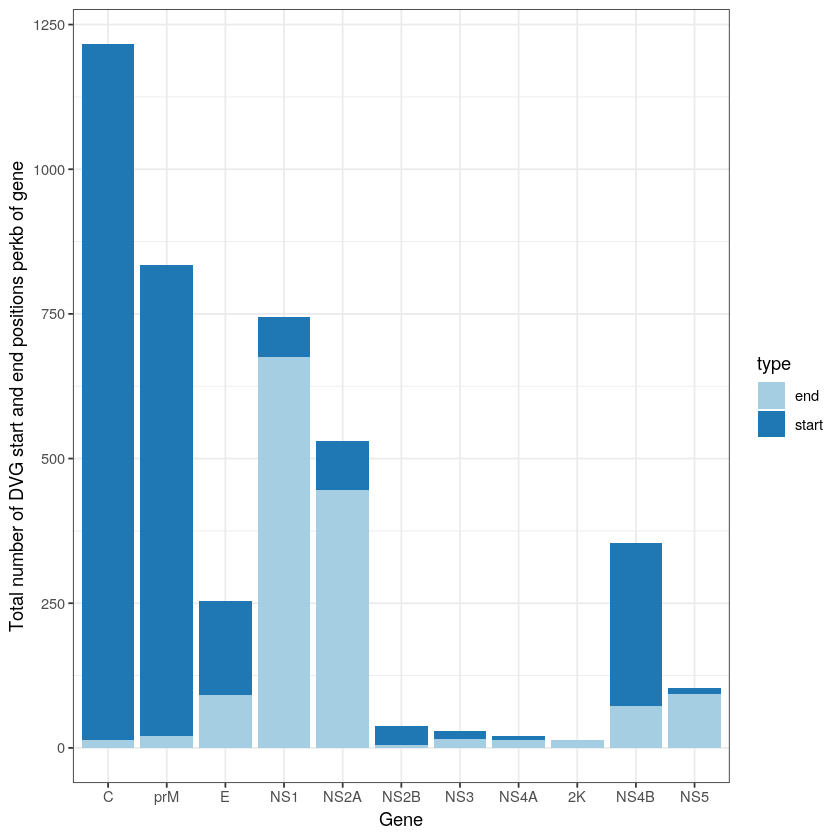

Count in stock and at least one mouse (ZIKA_0.10): 62

Count across mice (no stock) (ZIKA_0.10): 150

Count within mice across tissues (ZIKA_0.10): 5

Count within only one mouse one tissue (ZIKA_0.10): 828



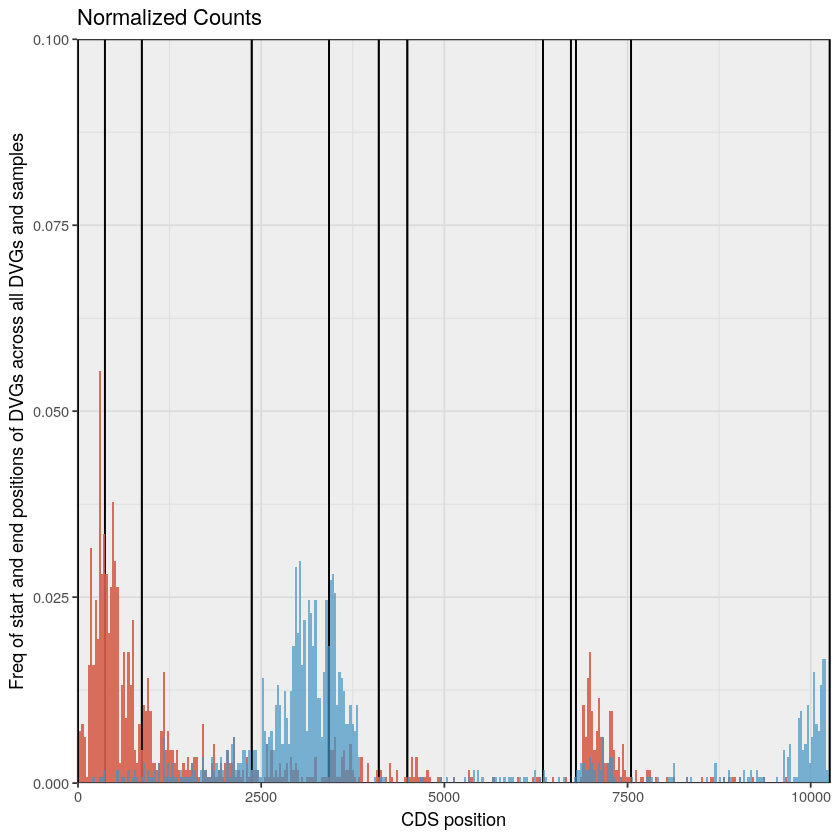

[1] "0.05"
ZIKA_0.05


`summarise()` regrouping output by 'pcr' (override with `.groups` argument)

Dimensions before filtering: 193534

Dimensions after filtering: 104034



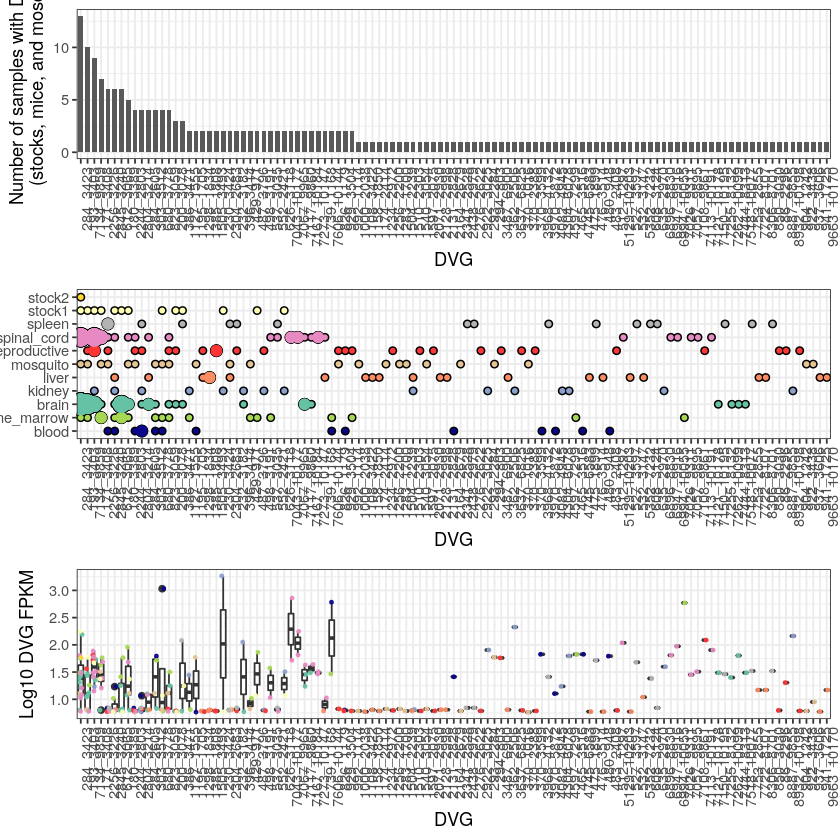

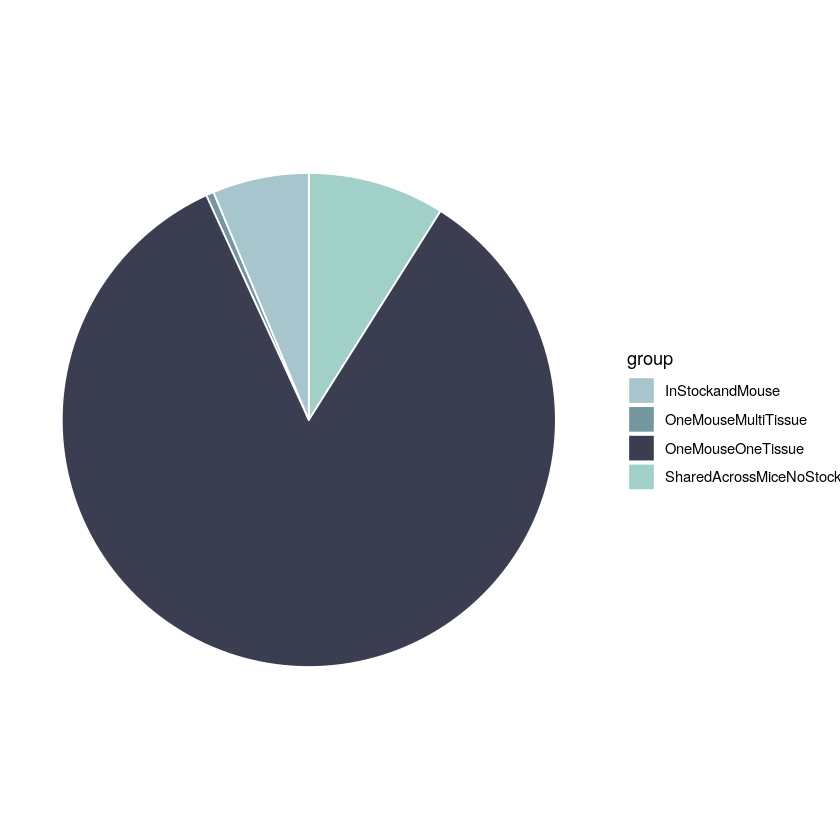

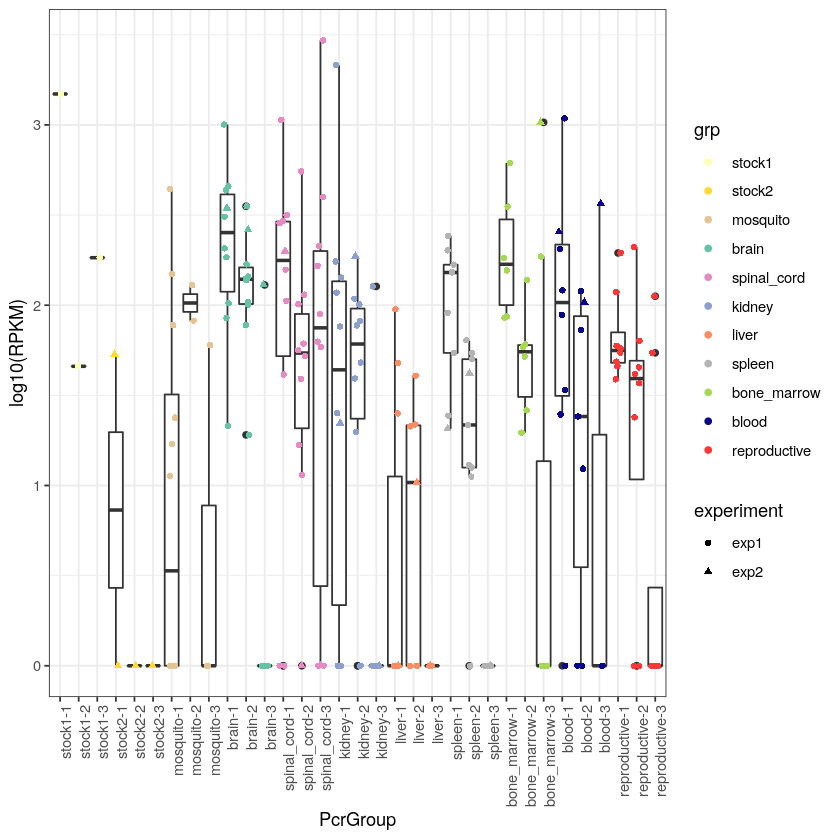

Kruskal Test on DVG FPKM (ZIKA_0.05) p-value: 6.76258747237473e-10



ZIKA_0.05
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 106.2557, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   1.307345
         |     1.0000
         |
 blood-3 |   1.219164   0.215577
         |     1.0000     1.0000
         |
bone_mar |  -0.979306  -2.166809  -1.915218
         |     1.0000     1.0000     1.0000
         |
bone_mar |   0.593427  -0.640117  -0.714023   1.471157
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |   1.888750   0.562943   0.220476   2.707668   1.180975
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -1.183732  -2.512369  -2.106809  -0.063144  -1

Kruskal Test on DVG diversity (ZIKA_0.05) p-value: 7.2732370825827e-13



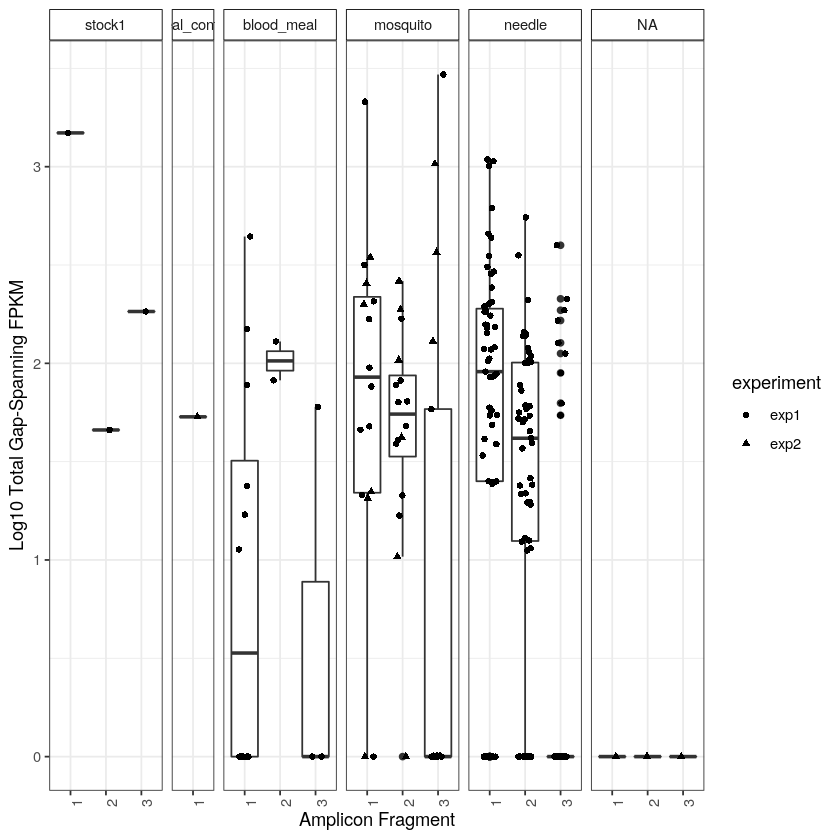

ZIKA_0.05
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 124.5965, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   1.178906
         |     1.0000
         |
 blood-3 |   1.812300   0.893815
         |     1.0000     1.0000
         |
bone_mar |  -1.524949  -2.576997  -2.899844
         |     1.0000     1.0000     0.9856
         |
bone_mar |  -0.026281  -1.122202  -1.755218   1.401875
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |   1.955186   0.751629  -0.311605   3.299139   1.844344
         |     1.0000     1.0000     1.0000     0.2560     1.0000
         |
 brain-1 |  -1.655508  -2.831582  -3.056766   0.074148  -1

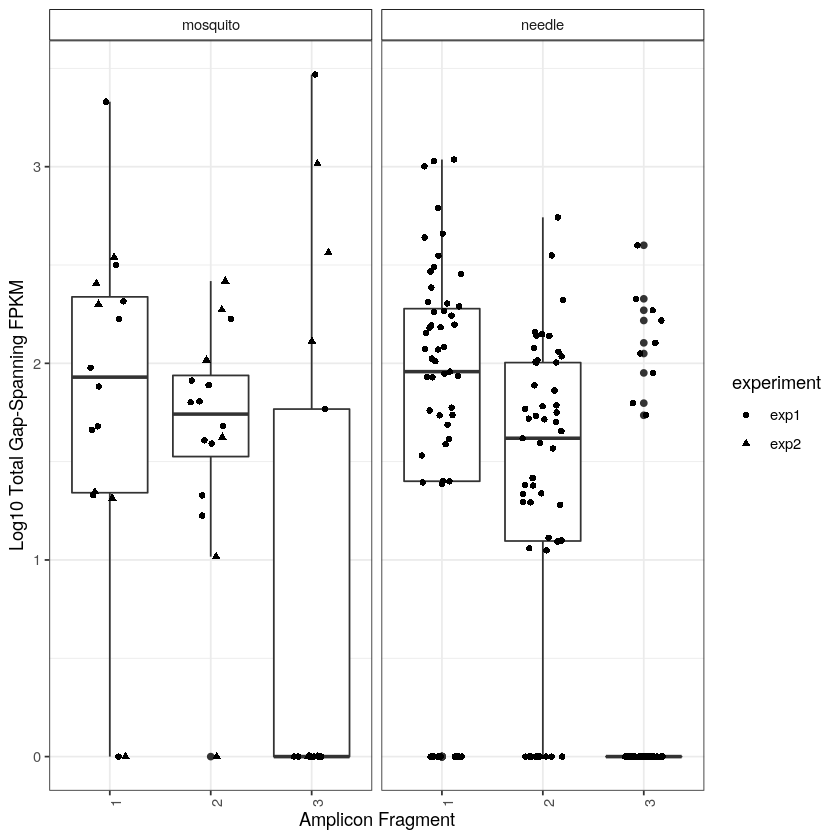

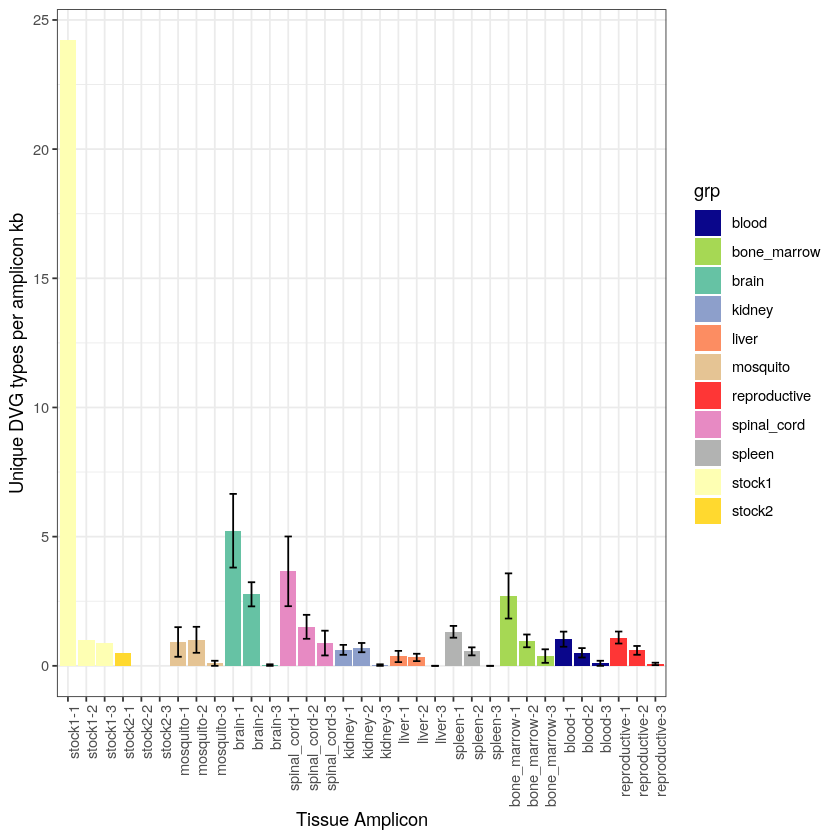

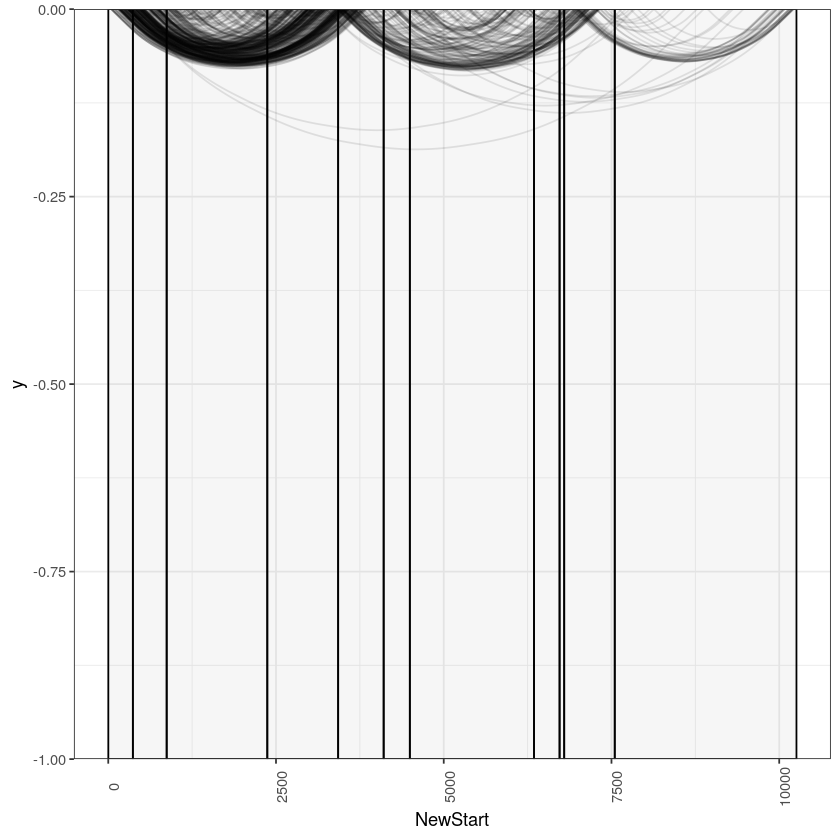

[1] 101
[1] 101


Number of DVGs found to be top across all samples (ZIKA_0.05): 101



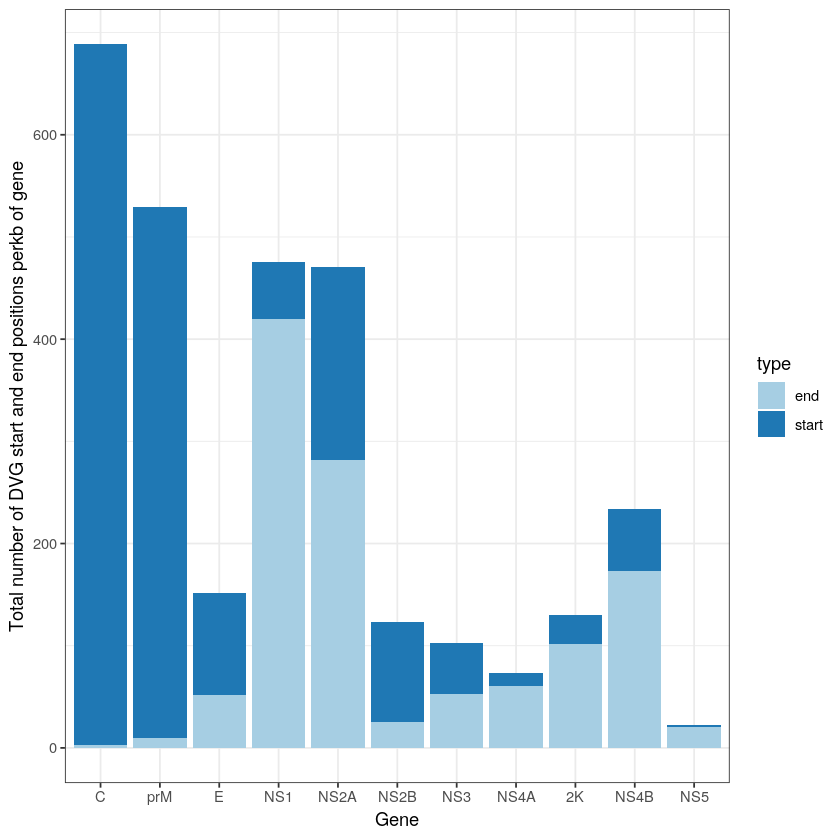

Count in stock and at least one mouse (ZIKA_0.05): 29

Count across mice (no stock) (ZIKA_0.05): 82

Count within mice across tissues (ZIKA_0.05): 4

Count within only one mouse one tissue (ZIKA_0.05): 701



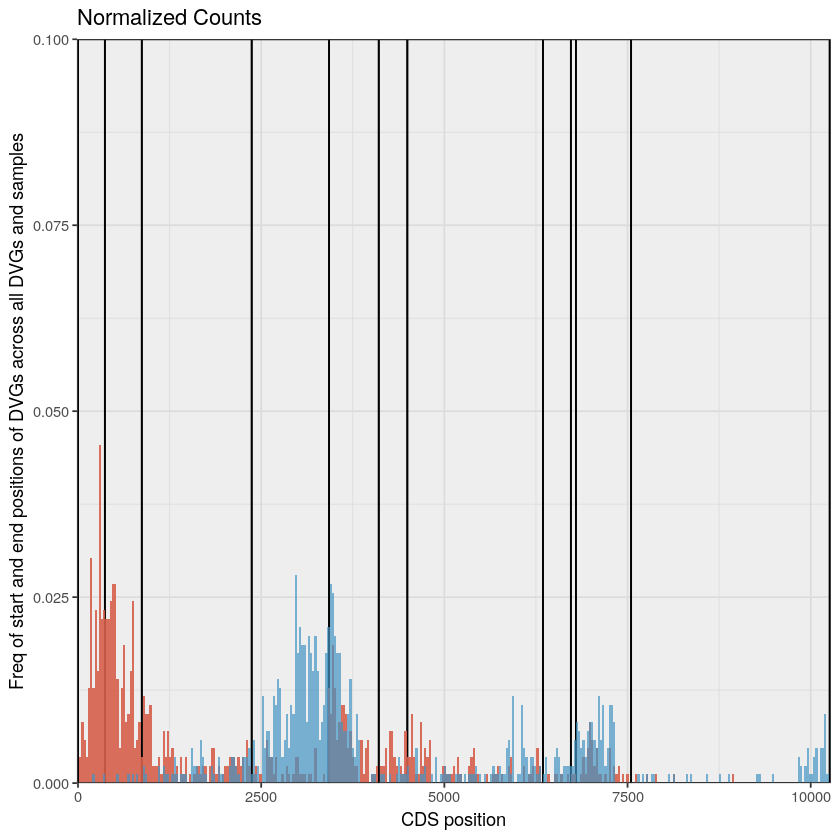

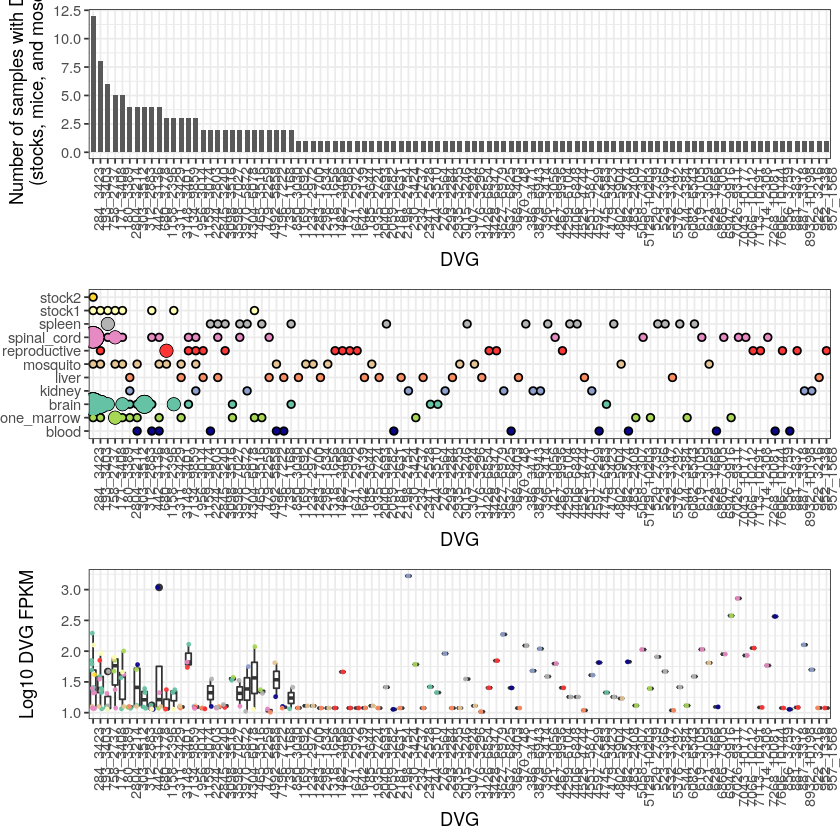

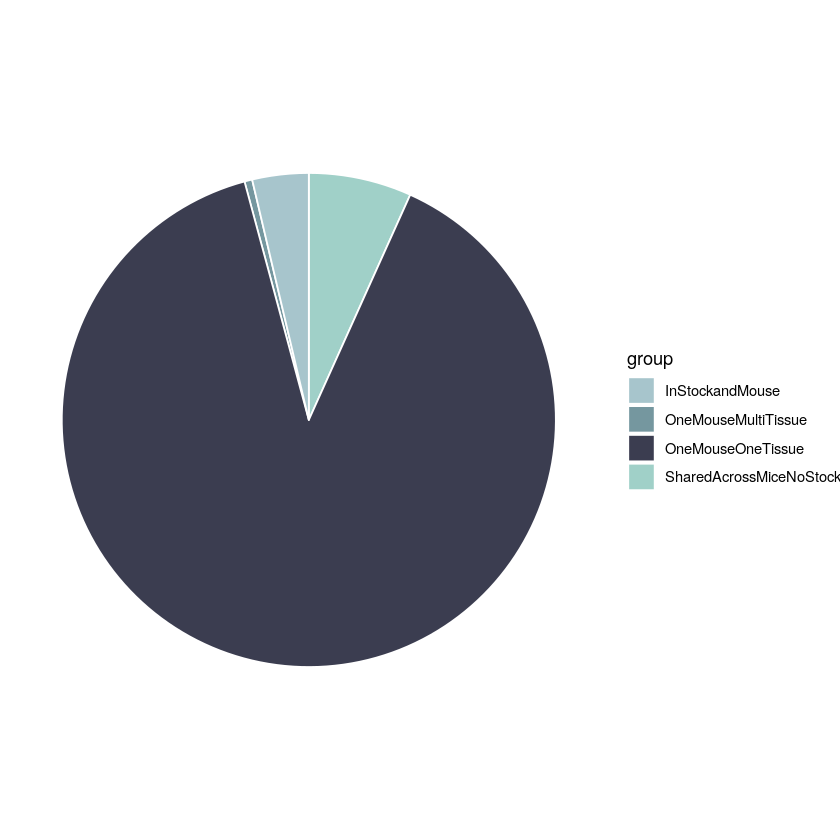

In [27]:
top_plas = "PlasAmp" # we are using the fpkm calc by amplicon and subsampling to filter out DVGs

freqs  = c('1','0.75','0.50','0.25','0.10','0.05')

zika = data.frame()

ZIKA_f = data.frame()

for (f in freqs){
    print(f)
    
    subsamp = glue("ZIKA_{f}") # generate the subsampling name
    
    print(subsamp)
    
    dfname = glue("{wkdir}FinalDVGfiles/ZIKA.DVG.FINAL.OneGap.N1.Mis1.M25.csv") # file name for dvgs
    
    x = MergeOutWMeta(dfname, metadata) # read and merge with metadata
    
    x = filter(x, subsample == f) %>% droplevels() # filter out for subsample that we want to use
    
    x2 = CompareBC(x) # compare stock two samples and take only what is in both
    
    x3 = MergeWAvgBC(x2, x, ampdf) # add back the two stock 2 samples to the dataframe (removing the replicates as well)
    
    p = PlasmidDVG(x3) # grab information on the plasmid - which will be used for cutoffs. (This is not completely the case now. Used to filter out DVG coordinates but not used for FPKM threshold)
        
    plasdvg = c(p[[1]]) # a list of dvgs that are found in the plasmid sample - will use to filter out DVGs in sample. These are likely to be sequence specific/aligner DVGs rather than biologically relevant DVGs

    # calculating the maximum DVG_RPKM_FRAG for the plasmid by pcr and subsample
    plasmid_cutoffs = x3 %>% 
        filter(name == 'plasmid_control') %>% 
            group_by(pcr, subsample) %>% 
            summarise(DVG_RPKM_PLAS = max(DVG_RPKM_FRAG)) # determine the max FPKM for each subsample/amplicon and append to df. Used to filter.

    x4 = merge(x3, plasmid_cutoffs, by = c('pcr','subsample'), all.x = TRUE)  # merge the plasmid cutoffs to the x3 dataframe - used to filter

    df_f = FiltDVGs(x4, plasdvg, tissue_list2)  # filtering out the dataframe using the plasmid cutoffs 

    AllSamps = NoDVG(metadata, f) # add in samples with 0 dvgs
    
    # merge the two dataframes together keeping ALL of the metadata info (will generate rows with NA)
    df = merge(df_f, AllSamps, 
                     by=c('name','tissue','experiment','transmission','mouse_id', 'pcr'), 
                     all = TRUE)
    
    df = df[!duplicated(df), ] %>% droplevels() # always check to make sure merging didn't generate dups
    
    df$subsample = f # add sub samp freq info
    
    df$segment = 'MR766' # add segment
    
    df$segment_size = 10260 # add genome size
    
    zika = rbind(zika, df)
    
    fpkm = CalcFPKM(df, ampdf) # calculate fpkm (including samples that have 0 dvgs)
    
    fpkm = fpkm %>% filter(tissue %in% tissue_list2) %>% droplevels()
    
    #reorder factors for figures
    fpkm$tissue = factor(fpkm$tissue,levels=tissue_ord)
    
    fpkm$PcrGroup = paste0(fpkm$tissue, '-',fpkm$pcr)
    
    fpkm$transmission =factor(fpkm$transmission,levels=transord)
    
    fpkm$PcrGroup = factor(fpkm$PcrGroup,levels=orderlist)

    ZIKA_f = rbind(ZIKA_f, fpkm)
    
    # generate dvg figures and stats tables
    fpkm_stats = FPM_Figs(fpkm, glue("{wkdir}DVG_Figures/fpkm"), RedColScale, subsamp, top_plas) # FPKM figures
    
    fpkm_stats = fpkm_stats %>% filter(padj <= 0.05) %>% droplevels()
    
    write.csv(fpkm_stats,
             file=glue("{wkdir}/DVG_FPKMstats/DunnTest.SigVal.DVG.FPKM.{subsamp}.{top_plas}.csv"),
             row.names=FALSE)
    
    # the diversity function adds in samples that had 0 dvgs called
    Div_stats = DVGDiversity(df_f, reduced, glue("{wkdir}DVG_Figures/DVG_diversity"), subsamp, top_plas)  # diversity figures
    
    Div_stats = Div_stats %>% filter(padj <= 0.05) %>% droplevels()
    
    write.csv(Div_stats,
             file=glue("{wkdir}/DVG_DiversityStats/DunnTest.SigVal.DVG.Diversity.{subsamp}.{top_plas}.csv"),
             row.names = FALSE)
    
    CurvyAll(df_f, Gene_df, glue("{wkdir}DVG_Figures/curvy"), subsamp, top_plas)  # curve plot figures
    
    CountGenes(df_f, Gene_ID, Gene_df, glue("{wkdir}DVG_Figures/Counts"), subsamp, top_plas)  # counting DVGs in each gene figure
    
    Histo(df_f, Gene_df, glue("{wkdir}DVG_Figures/histos"), subsamp, top_plas)  # histogram of start/end points figure
        
    DVG.FPKM = TopShare(df_f, ampdf, RedColScale, glue("{wkdir}DVG_Figures/SharedDVGs"), subsamp, top_plas)  # Figure showing shared/top DVGs
        
    PiePlot(df_f, glue("{wkdir}DVG_Figures/PIE"), subsamp, top_plas)  # pie plot figure 

}

In [28]:
ZIKA = DVG_fpkm(zika)
ZIKA$DVG_RPKM[is.na(ZIKA$DVG_RPKM)] = 0 # if there aren't any DVGS make fpkm 0 
ZIKA = ZIKA[!duplicated(ZIKA),] %>% droplevels()

In [29]:
# filter out DFs for different subsampling frequencies
z100 = FiltIt(ZIKA, "1")
z75 =  FiltIt(ZIKA, "0.75")
z50 =  FiltIt(ZIKA, "0.50")
z25 =  FiltIt(ZIKA, "0.25")
z10 =  FiltIt(ZIKA, "0.10")
z05 =  FiltIt(ZIKA, "0.05")


In [30]:
# merge the subsampling frequencies into one df
z = merge(z05, z10, by=c('segment','pcr','NewGap','transmission','tissue','name','experiment'), all = TRUE)
z = merge(z, z25, by=c('segment','pcr','NewGap','transmission','tissue','name','experiment'), all = TRUE)
z = merge(z, z50, by=c('segment','pcr','NewGap','transmission','tissue','name','experiment'), all = TRUE)
z = merge(z, z75, by=c('segment','pcr','NewGap','transmission','tissue','name','experiment'), all = TRUE)
z = merge(z, z100, by=c('segment','pcr','NewGap','transmission','tissue','name','experiment'), all = TRUE)

# melt from wide format to long format so we can compare no subsampling to subsampling at different frequencies
z_melt = melt(z, id.vars = c('segment','pcr','NewGap','transmission','tissue','name','experiment','Sub1'))

z_melt[is.na(z_melt)] = 0 # any NAs indicate that it wasn't identified either in the subsampled bam or the nonsubsampled bam


In [31]:
# rename the filtered dfs 
colnames(z05) = c('segment','pcr','NewGap','transmission','tissue','name','experiment',"DVG.FPKM")
z05$subsample = 'S5'

colnames(z10) = c('segment','pcr','NewGap','transmission','tissue','name','experiment',"DVG.FPKM")
z10$subsample = 'S10'

colnames(z25) = c('segment','pcr','NewGap','transmission','tissue','name','experiment',"DVG.FPKM")
z25$subsample = 'S25'

colnames(z50) = c('segment','pcr','NewGap','transmission','tissue','name','experiment',"DVG.FPKM")
z50$subsample = 'S50'

colnames(z75) = c('segment','pcr','NewGap','transmission','tissue','name','experiment',"DVG.FPKM")
z75$subsample = 'S75'

colnames(z100) = c('segment','pcr','NewGap','transmission','tissue','name','experiment',"DVG.FPKM")
z100$subsample = 'S100'

# bind together to make faceted plots
z2 = rbind(z05, z10)
z2 = rbind(z2, z25)
z2 = rbind(z2, z50)
z2 = rbind(z2, z75)
z2 = rbind(z2, z100)

In [32]:
# the fpkm boxplots, but faceted by subsampling frequency
#xplot = ggplot(fpkm, aes(x=PcrGroup, log10(RPKM))) + 
xplot = ggplot(ZIKA_f, aes(x=PcrGroup, log10(RPKM))) + 
    geom_boxplot() +
    geom_jitter(width=0.25, aes(color=tissue, shape=experiment)) +
    theme_bw() +
    facet_wrap(.~subsample, ncol = 3) +
    RedColScale +
    ylab("Log10 total DVG FPKM") + 
    xlab("Tissue-PCR Amplicon") + 
    theme(legend.key = element_blank(), 
          strip.background = element_rect(colour="black", fill="white"),
          axis.text.x = element_text(angle =90,hjust=1))

ggsave(xplot,
          file=glue("{wkdir}/DVG_Figures/CompareSub/FPKM.Boxplots.Subsamps.{top_plas}.pdf"),
     width=15, height=8,limitsize=FALSE, useDingbats=FALSE)


In [33]:
# correlation with the subsampled data and the nonsubsampled data
# looking at individual dvg species fpkm values
z_melt = z_melt %>% filter(tissue %in% tissue_list2) %>% droplevels()

xplot2 = ggplot(z_melt, aes(x = Sub1, y = value)) +
    geom_point(aes(color=tissue, shape = experiment), alpha = 0.5) +
    ylab("Individual DVG FPKM (subsampling)") + 
    xlab("Individual DVG FPKM (no subsampling)") + 
    facet_grid(.~variable) +
    theme_bw() + 
    RedColScale + 
    theme(legend.key = element_blank(), 
          strip.background = element_rect(colour="black", fill="white")) 

ggsave(xplot2,
          file=glue("{wkdir}/DVG_Figures/CompareSub/DVG.Correlations.{top_plas}.pdf"),
     width=12, height=3,limitsize=FALSE, useDingbats=FALSE)

In [34]:
# filtering the df to calculate the correlation values
c5 = z_melt %>% filter(variable == 'Sub0.05') %>% droplevels()
c10 = z_melt %>% filter(variable == 'Sub0.10') %>% droplevels()
c25 = z_melt %>% filter(variable == 'Sub0.25') %>% droplevels()
c50 = z_melt %>% filter(variable == 'Sub0.50') %>% droplevels()
c75 = z_melt %>% filter(variable == 'Sub0.75') %>% droplevels()

cor(c5$Sub1, c5$value)
cor(c10$Sub1, c10$value)
cor(c25$Sub1, c25$value)
cor(c50$Sub1, c50$value)
cor(c75$Sub1, c75$value)


[1] 0.9601359

[1] 0.9781534

[1] 0.9863878

[1] 0.9912957

[1] 0.9991214

## Analysis using the most abudnant dvg in the plasmid as the threshold across all amplicons

[1] "1"
ZIKA_1


`summarise()` ungrouping output (override with `.groups` argument)

Dimensions before filtering: 1666434

Dimensions after filtering: 70934



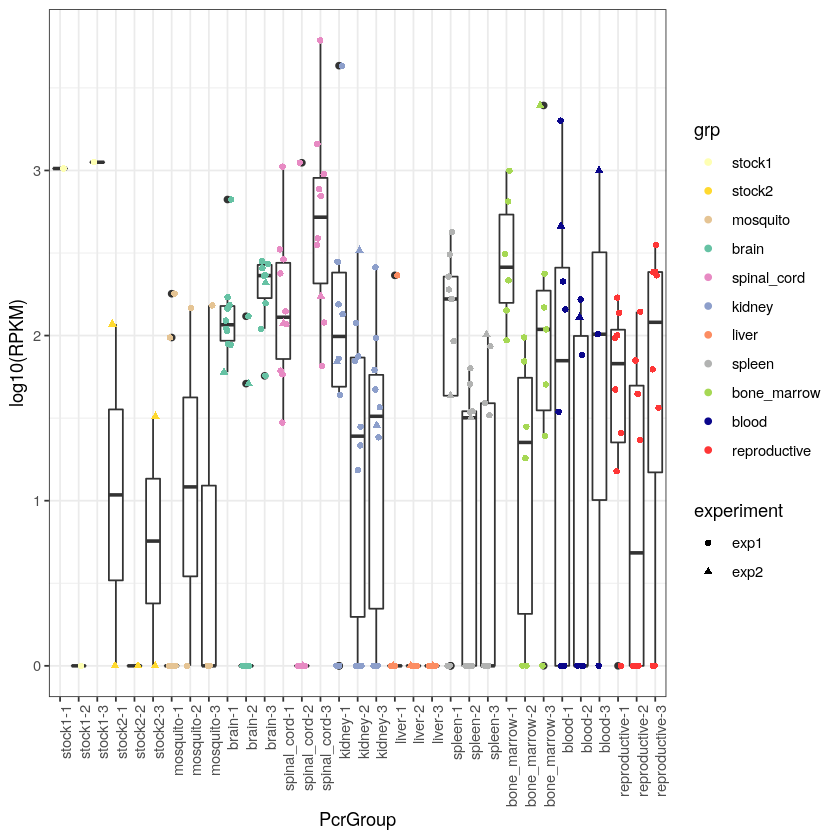

Kruskal Test on DVG FPKM (ZIKA_1) p-value: 5.88528741255564e-11



ZIKA_1
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 112.9209, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   1.067391
         |     1.0000
         |
 blood-3 |  -0.200059  -0.996816
         |     1.0000     1.0000
         |
bone_mar |  -1.699236  -2.642444  -1.106271
         |     1.0000     1.0000     1.0000
         |
bone_mar |   0.997032  -0.025107   0.953038   2.522128
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -0.429473  -1.449333  -0.125832   1.249970  -1.367366
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -1.015386  -2.098329  -0.525914   0.844412  -1.97

Kruskal Test on DVG diversity (ZIKA_1) p-value: 1.39649116920661e-14



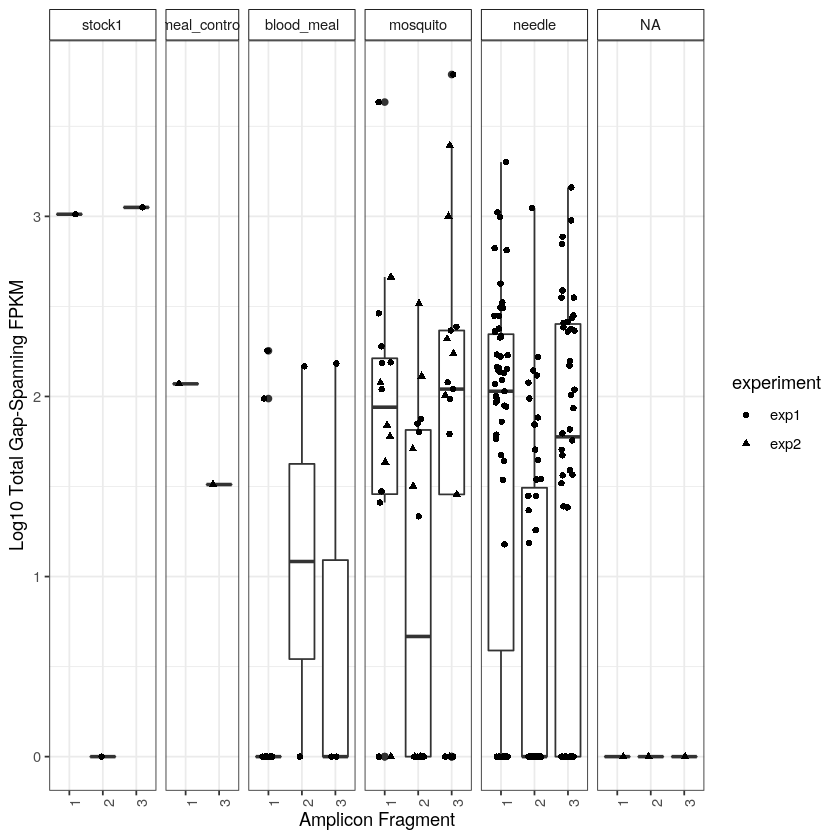

ZIKA_1
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 134.8235, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   0.331132
         |     1.0000
         |
 blood-3 |  -0.107706  -0.354016
         |     1.0000     1.0000
         |
bone_mar |  -2.388994  -2.627096  -1.721503
         |     1.0000     1.0000     1.0000
         |
bone_mar |   0.200367  -0.113537   0.256153   2.422125
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -1.477549  -1.751248  -1.002495   0.944550  -1.569007
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -2.618349  -2.868007  -1.775952   0.093362  -2.61

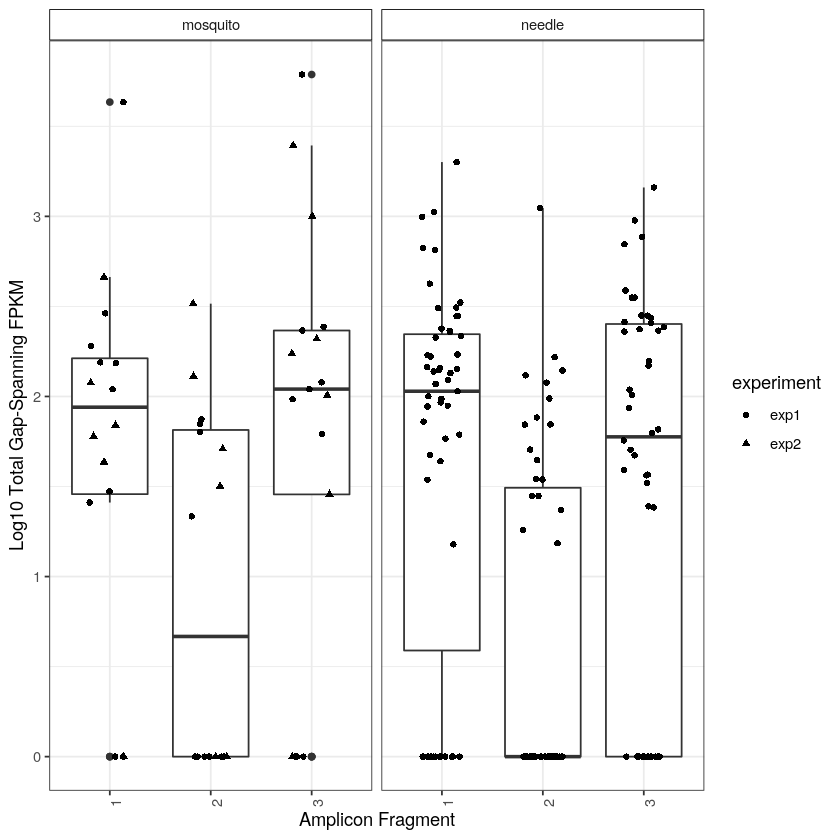

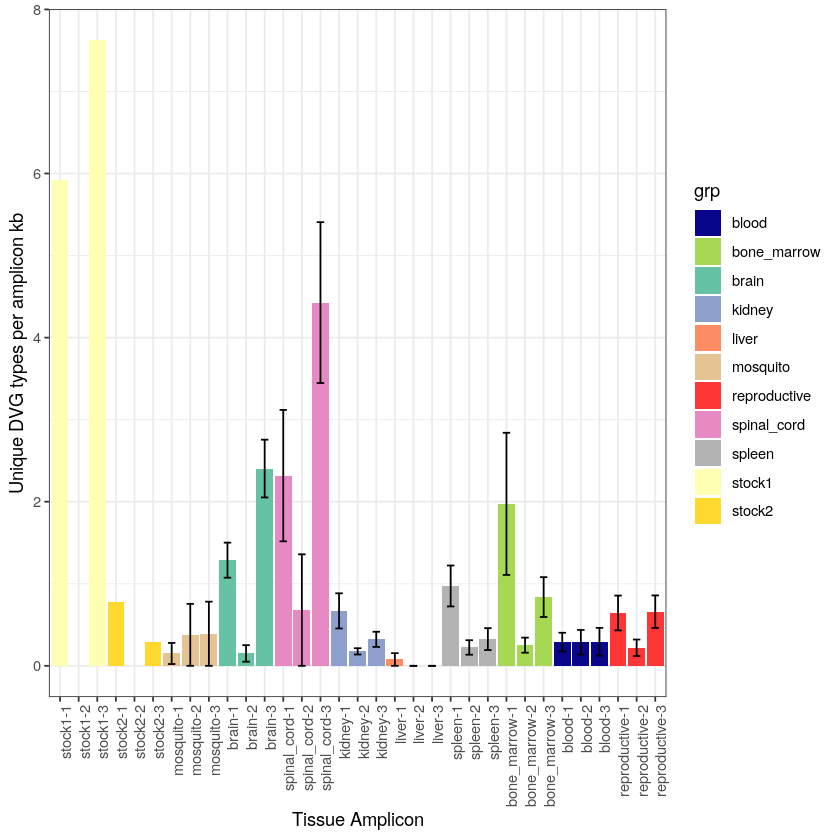

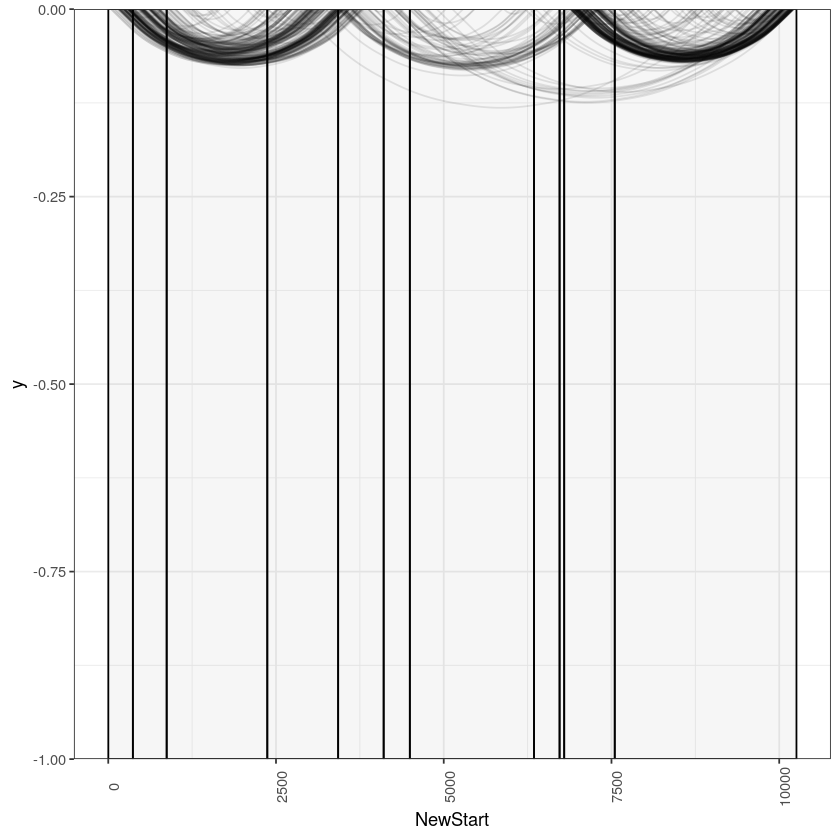

[1] 53
[1] 53


Number of DVGs found to be top across all samples (ZIKA_1): 53



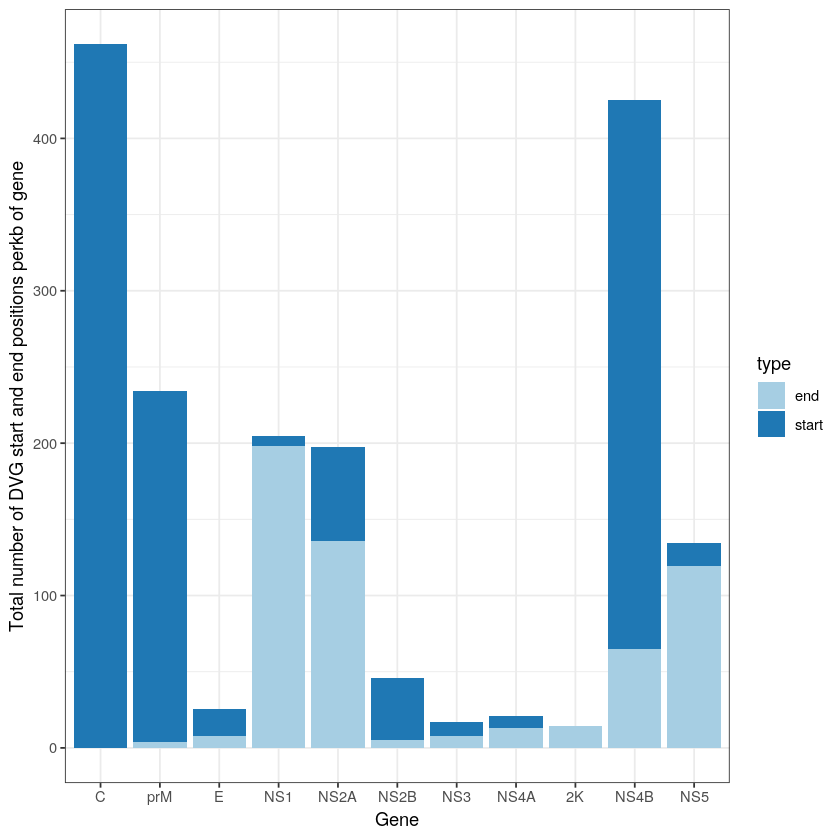

Count in stock and at least one mouse (ZIKA_1): 21

Count across mice (no stock) (ZIKA_1): 73

Count within mice across tissues (ZIKA_1): 0

Count within only one mouse one tissue (ZIKA_1): 416



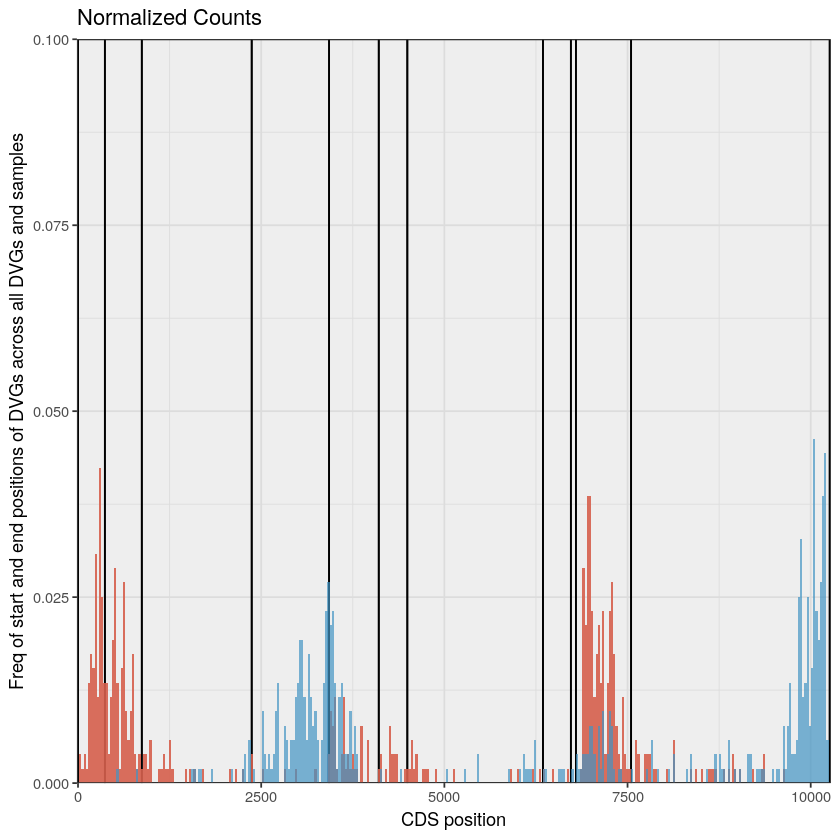

[1] "0.75"
ZIKA_0.75


`summarise()` ungrouping output (override with `.groups` argument)

Dimensions before filtering: 1401434

Dimensions after filtering: 67634



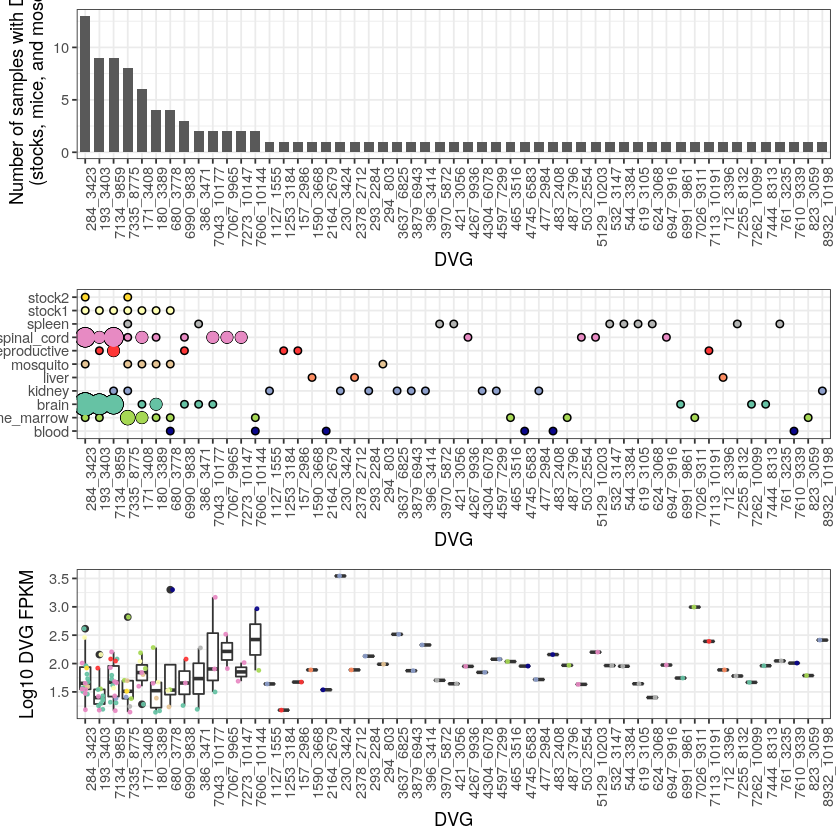

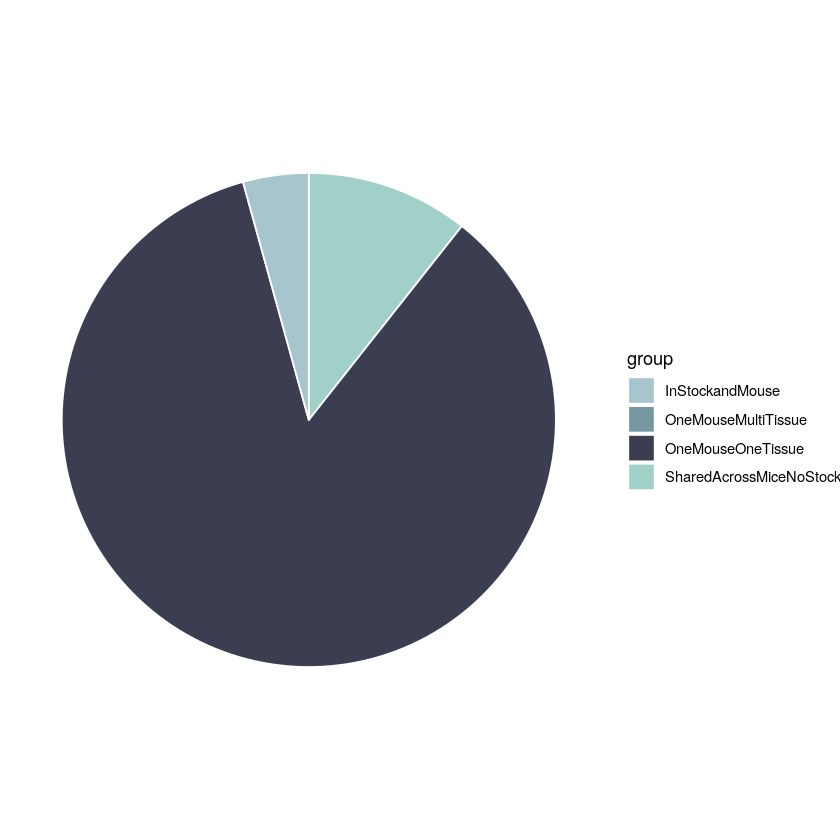

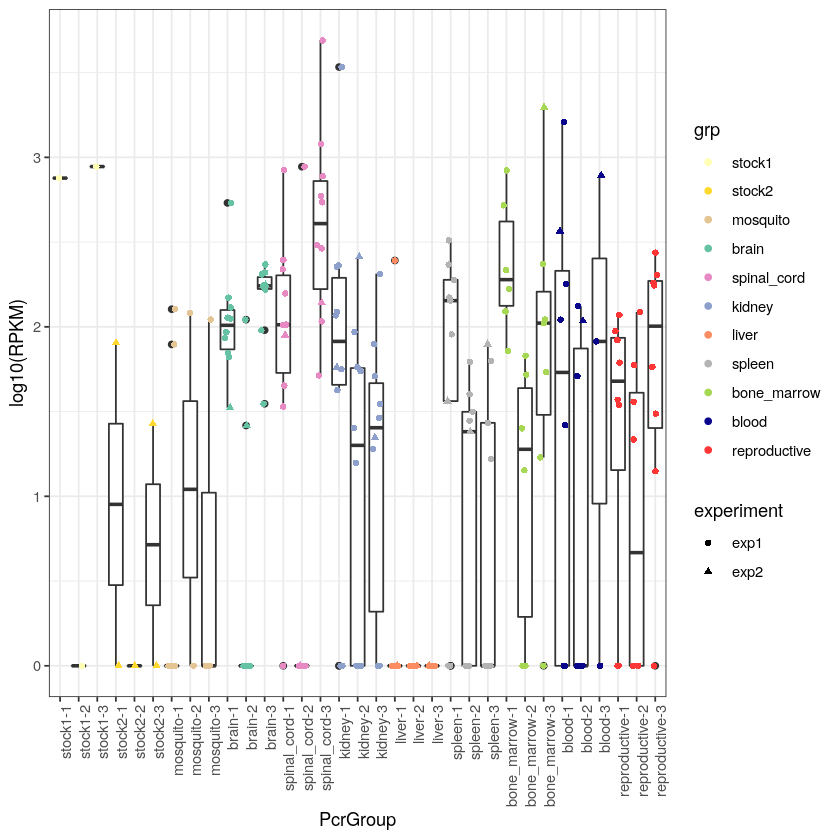

Kruskal Test on DVG FPKM (ZIKA_0.75) p-value: 9.81082575293828e-11



ZIKA_0.75
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 111.5375, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   1.102943
         |     1.0000
         |
 blood-3 |  -0.188814  -1.012448
         |     1.0000     1.0000
         |
bone_mar |  -1.698541  -2.674842  -1.116505
         |     1.0000     1.0000     1.0000
         |
bone_mar |   1.028935  -0.027211   0.966639   2.551321
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -0.529259  -1.580374  -0.211703   1.156467  -1.491163
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -1.014551  -2.134862  -0.536876   0.844452  -2

Kruskal Test on DVG diversity (ZIKA_0.75) p-value: 6.00685669157422e-14



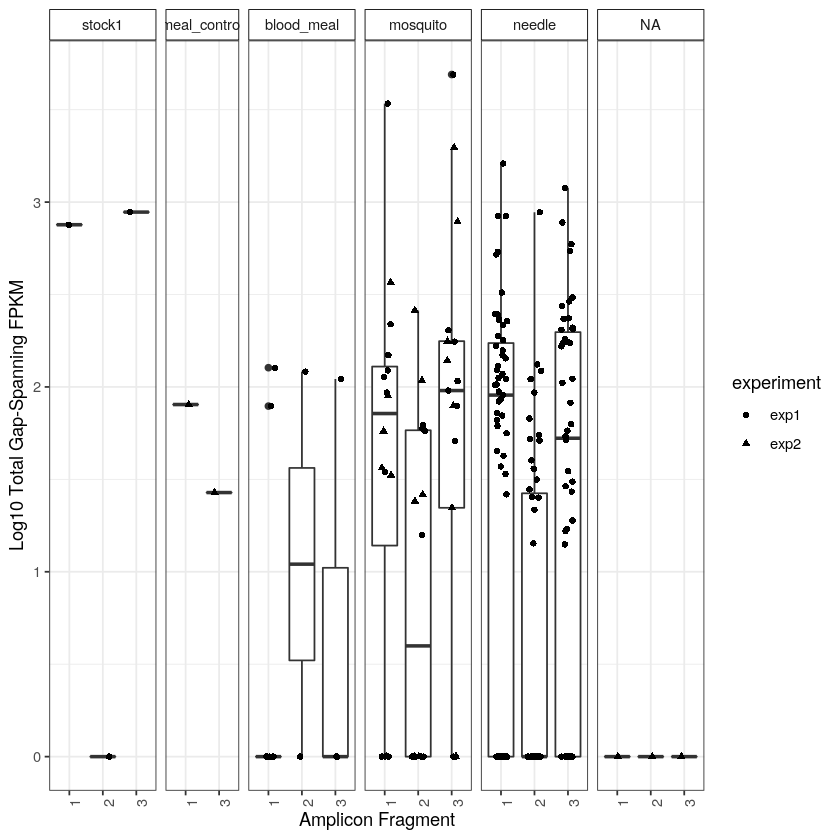

ZIKA_0.75
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 131.0755, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   0.416498
         |     1.0000
         |
 blood-3 |  -0.122754  -0.432804
         |     1.0000     1.0000
         |
bone_mar |  -2.262478  -2.583697  -1.610468
         |     1.0000     1.0000     1.0000
         |
bone_mar |   0.192196  -0.200881   0.264320   2.296138
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -1.602149  -1.954547  -1.081181   0.705828  -1.676986
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -2.603527  -2.943392  -1.749795  -0.025335  -2

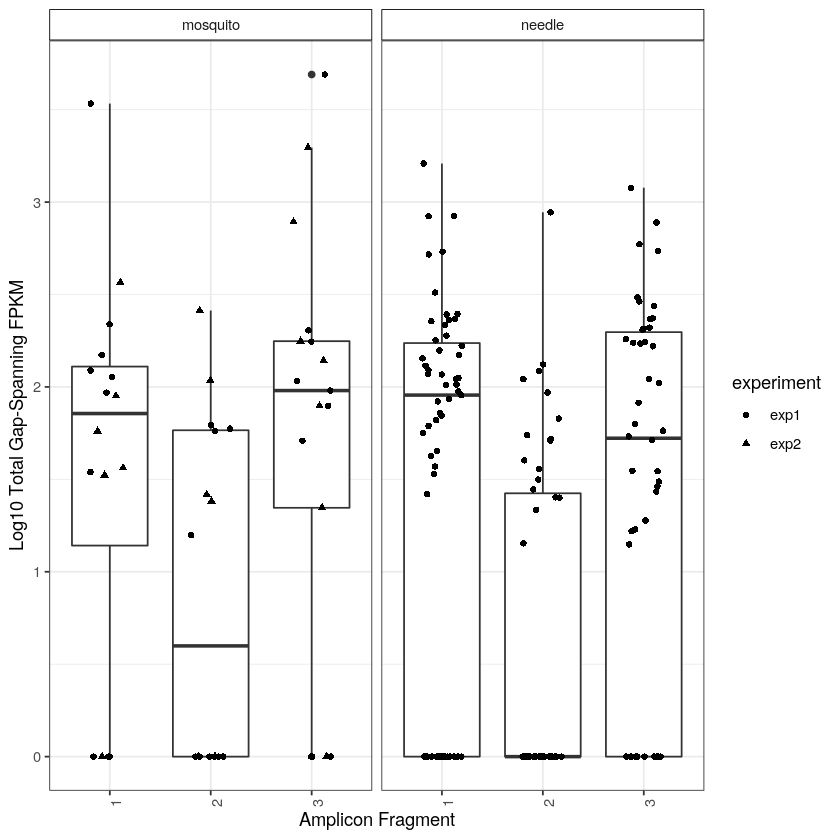

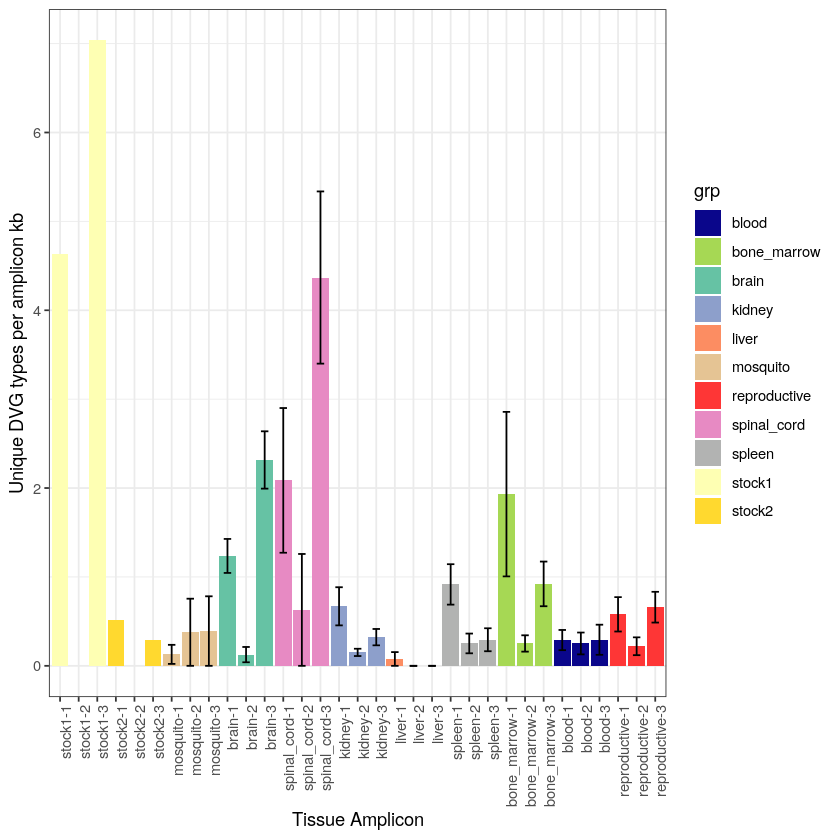

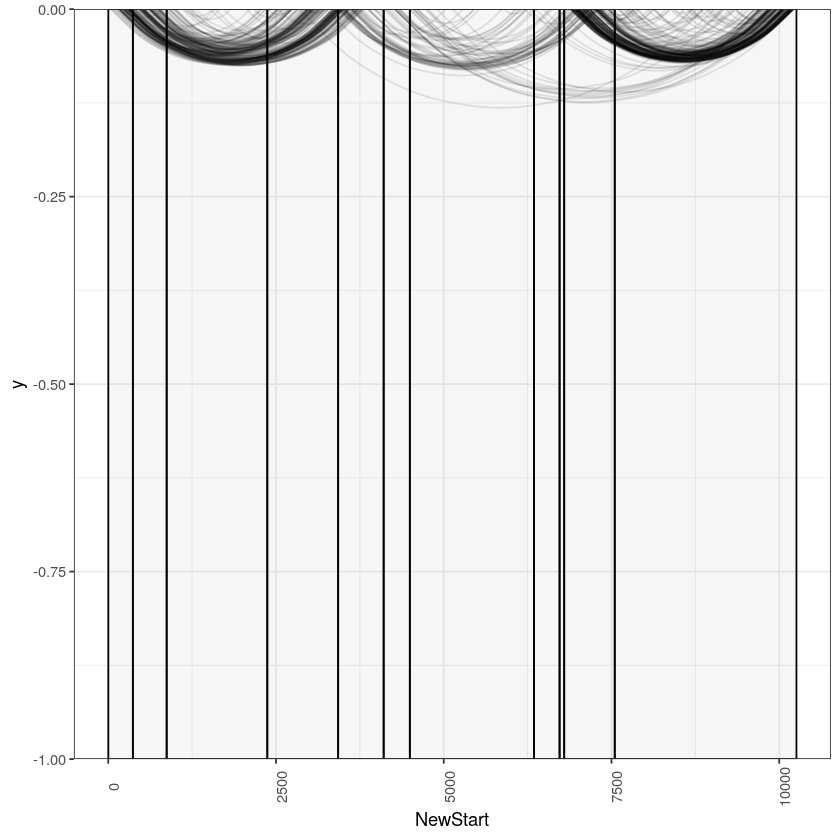

[1] 53
[1] 53


Number of DVGs found to be top across all samples (ZIKA_0.75): 53



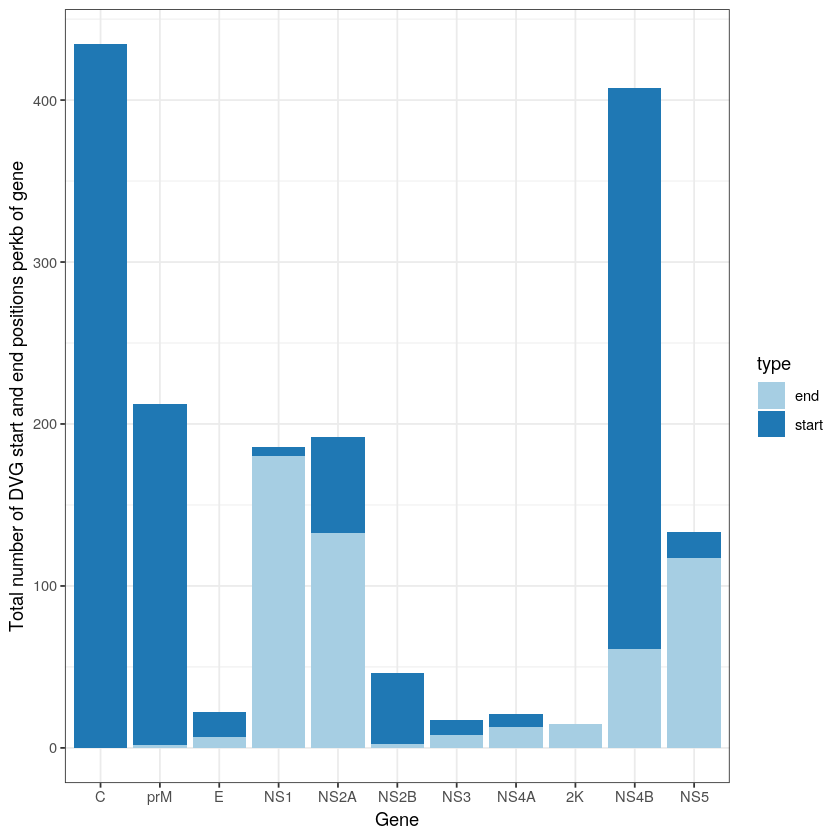

Count in stock and at least one mouse (ZIKA_0.75): 16

Count across mice (no stock) (ZIKA_0.75): 66

Count within mice across tissues (ZIKA_0.75): 0

Count within only one mouse one tissue (ZIKA_0.75): 411



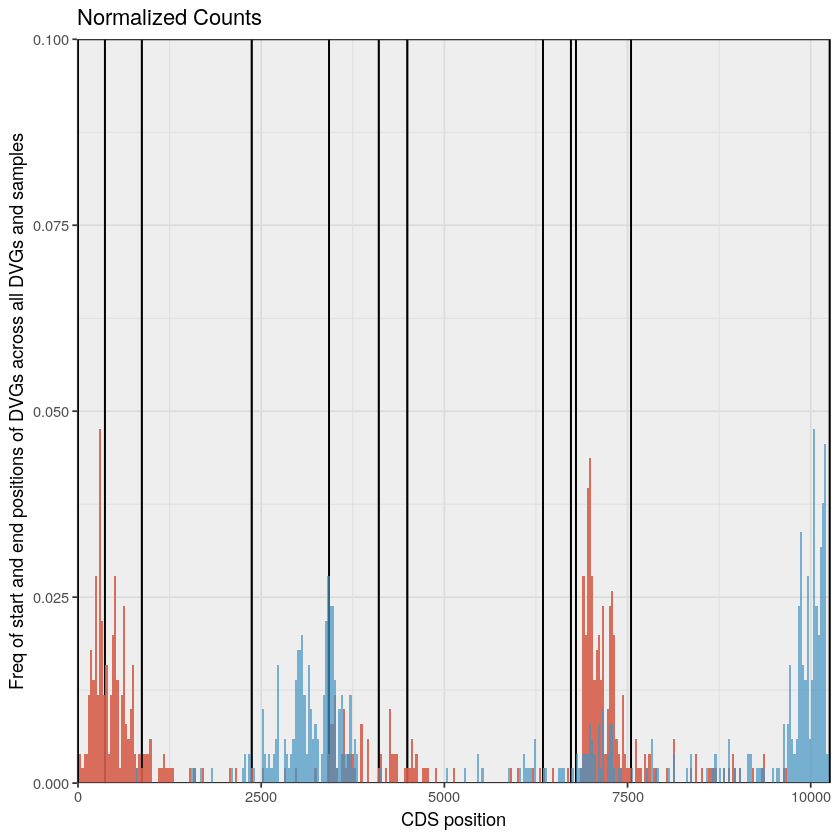

[1] "0.50"
ZIKA_0.50


`summarise()` ungrouping output (override with `.groups` argument)

Dimensions before filtering: 1075934

Dimensions after filtering: 59734



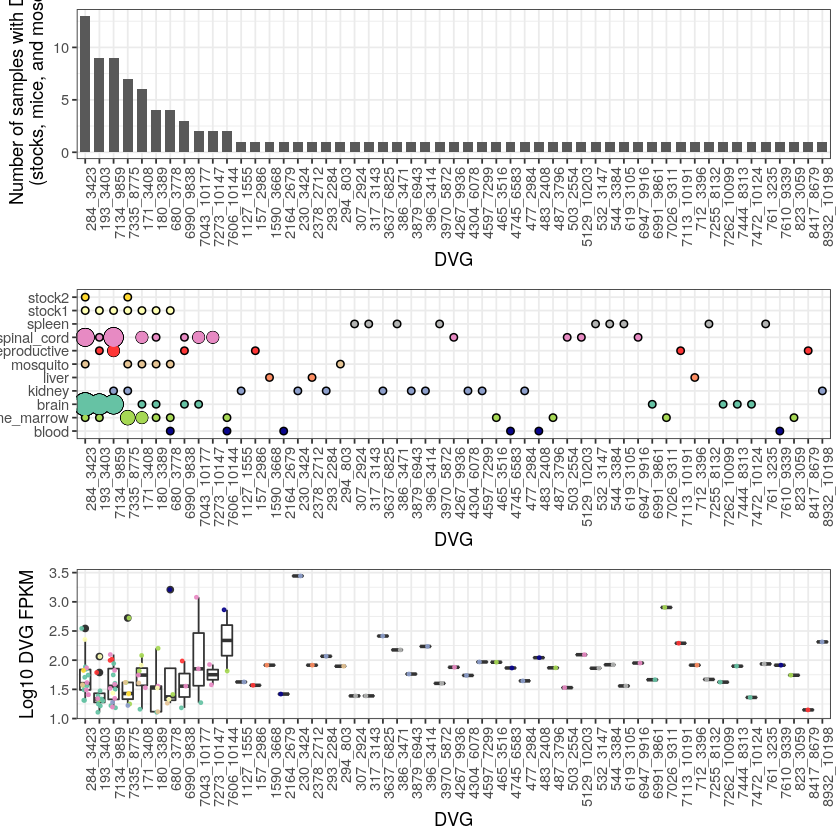

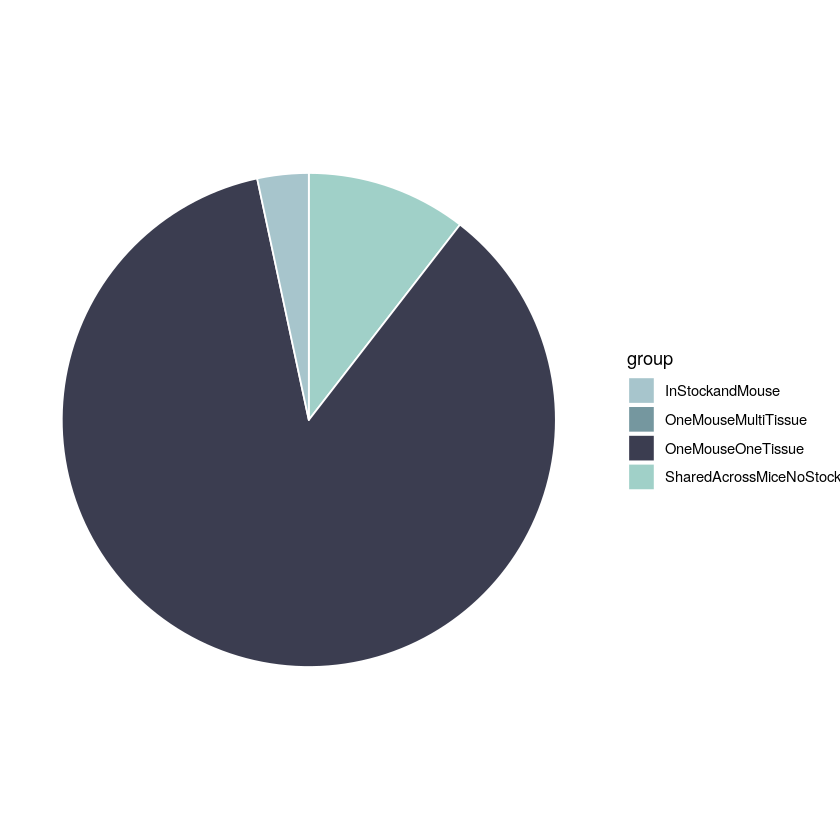

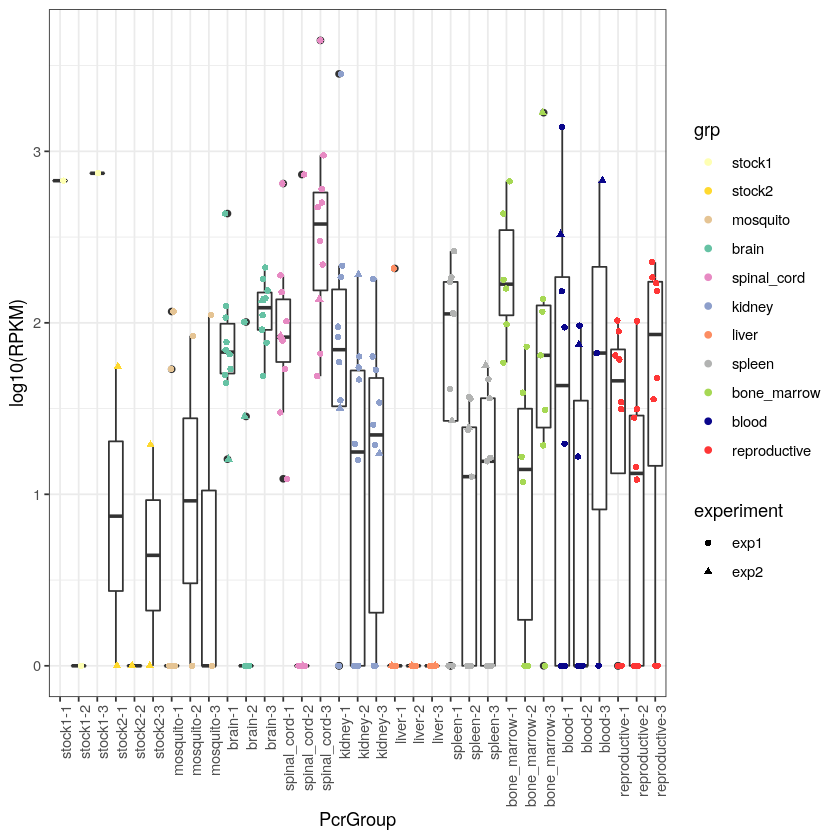

Kruskal Test on DVG FPKM (ZIKA_0.50) p-value: 1.39626291772948e-10



ZIKA_0.50
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 110.5787, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   1.273648
         |     1.0000
         |
 blood-3 |  -0.234215  -1.185018
         |     1.0000     1.0000
         |
bone_mar |  -1.722480  -2.856880  -1.091321
         |     1.0000     1.0000     1.0000
         |
bone_mar |   0.998255  -0.215792   0.986674   2.545015
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -0.446433  -1.665462  -0.105043   1.256756  -1.384331
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -0.822337  -2.129126  -0.351680   1.046047  -1

Kruskal Test on DVG diversity (ZIKA_0.50) p-value: 4.15792360093554e-14



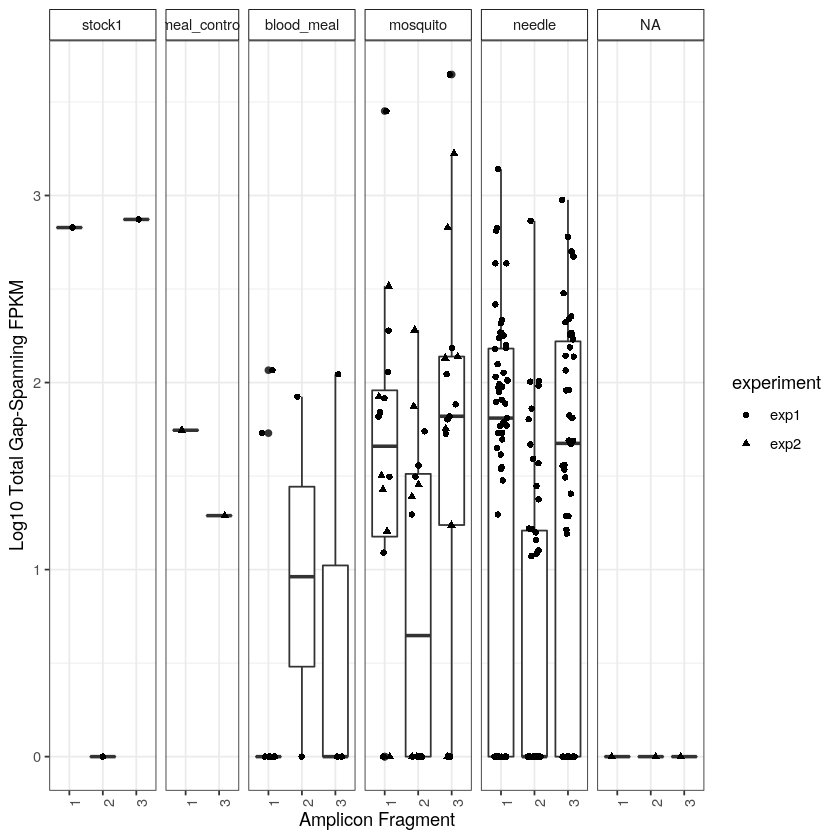

ZIKA_0.50
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 132.0234, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   0.641705
         |     1.0000
         |
 blood-3 |  -0.179543  -0.657424
         |     1.0000     1.0000
         |
bone_mar |  -2.375875  -2.903275  -1.642704
         |     1.0000     0.9749     1.0000
         |
bone_mar |   0.184372  -0.417978   0.312716   2.394892
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -1.456316  -2.031401  -0.916092   0.951568  -1.533728
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -2.200128  -2.791623  -1.400711   0.463802  -2

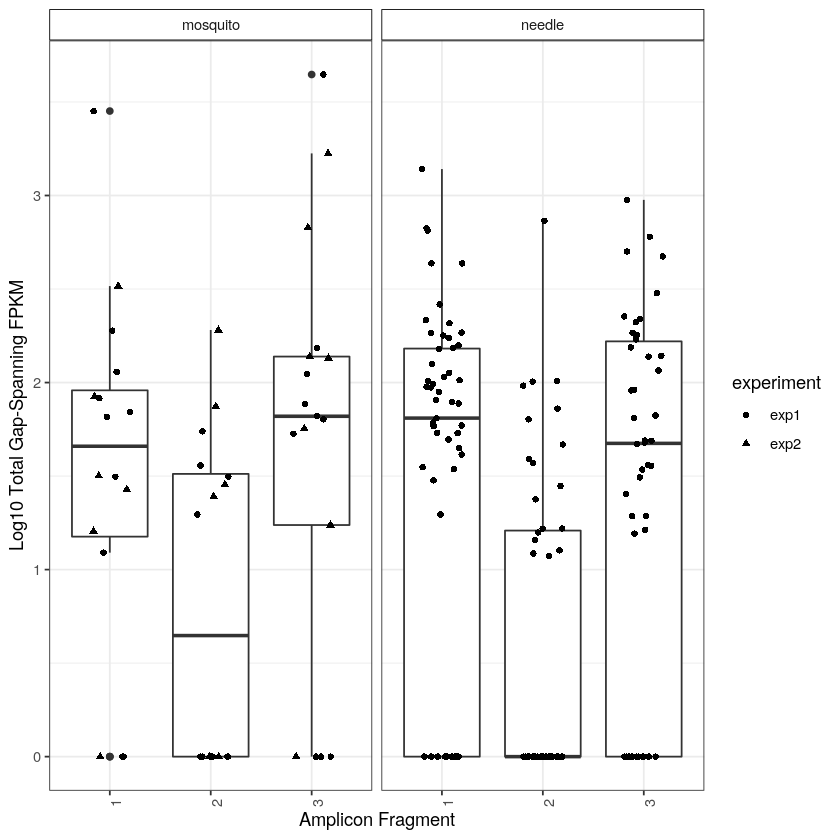

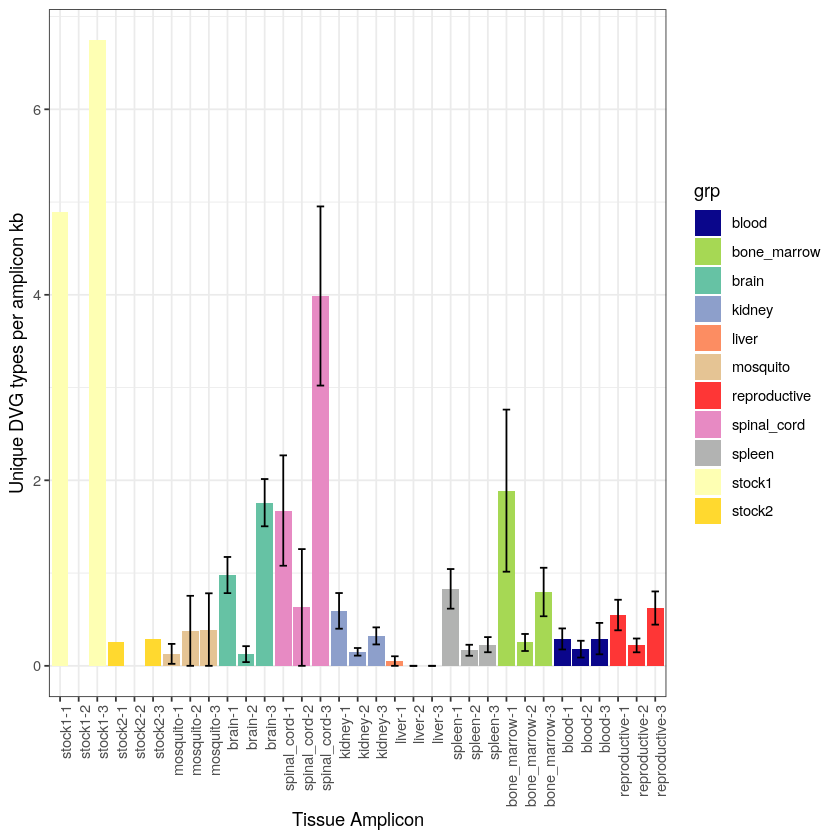

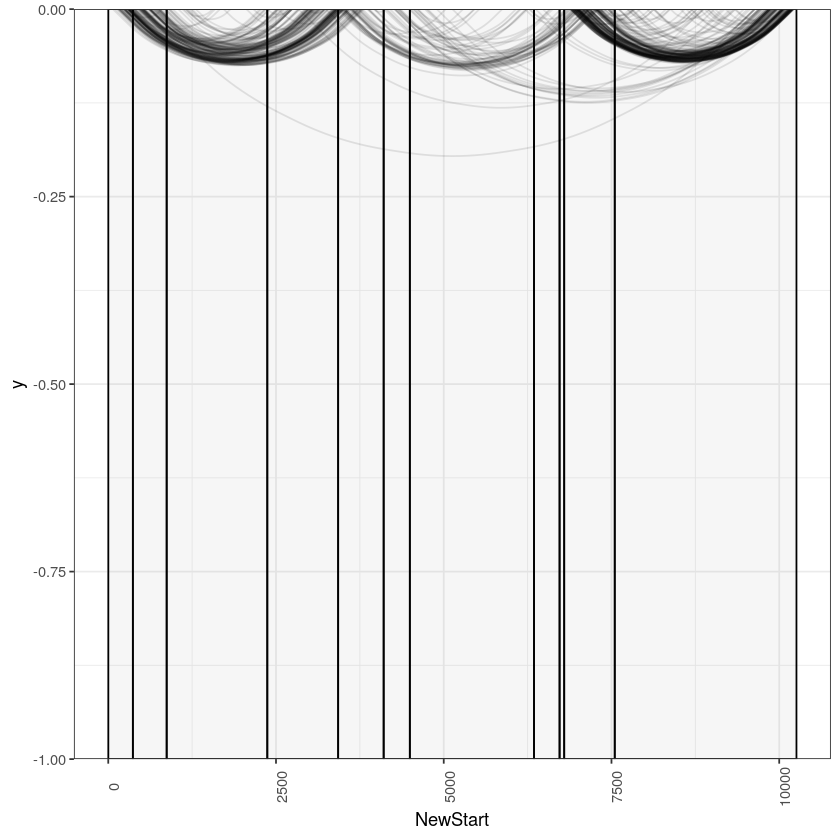

[1] 50
[1] 50


Number of DVGs found to be top across all samples (ZIKA_0.50): 50



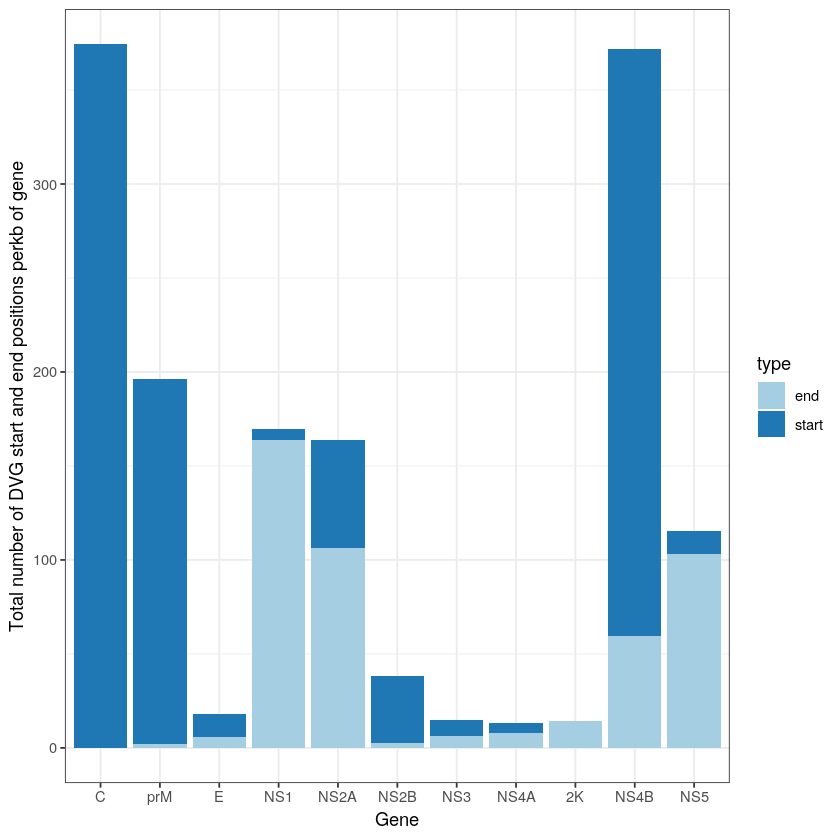

Count in stock and at least one mouse (ZIKA_0.50): 13

Count across mice (no stock) (ZIKA_0.50): 63

Count within mice across tissues (ZIKA_0.50): 0

Count within only one mouse one tissue (ZIKA_0.50): 353



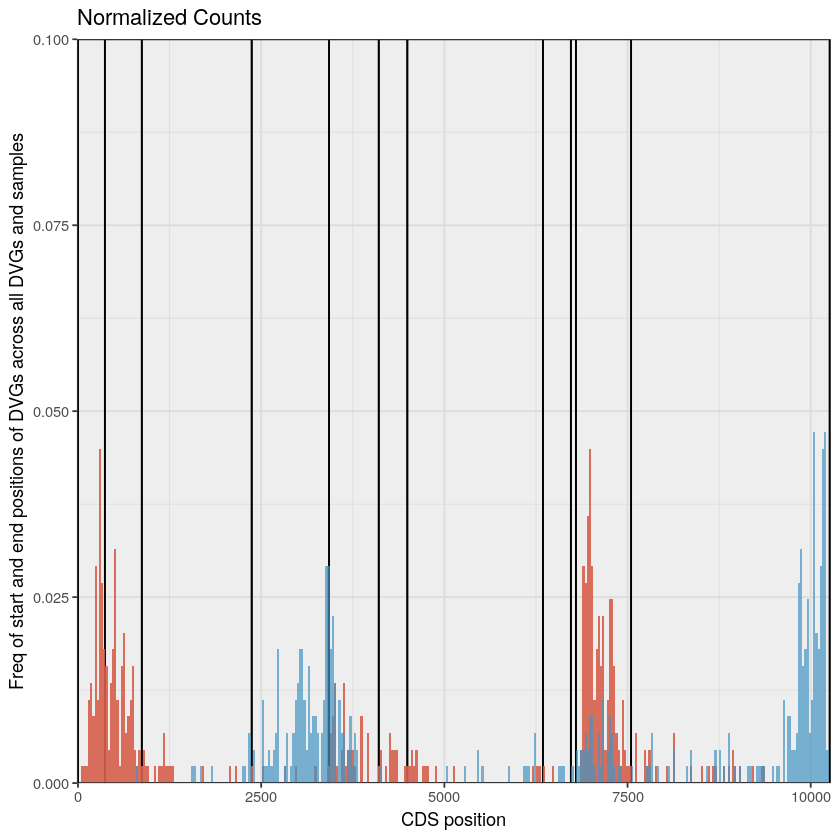

[1] "0.25"
ZIKA_0.25


`summarise()` ungrouping output (override with `.groups` argument)

Dimensions before filtering: 656834

Dimensions after filtering: 92234



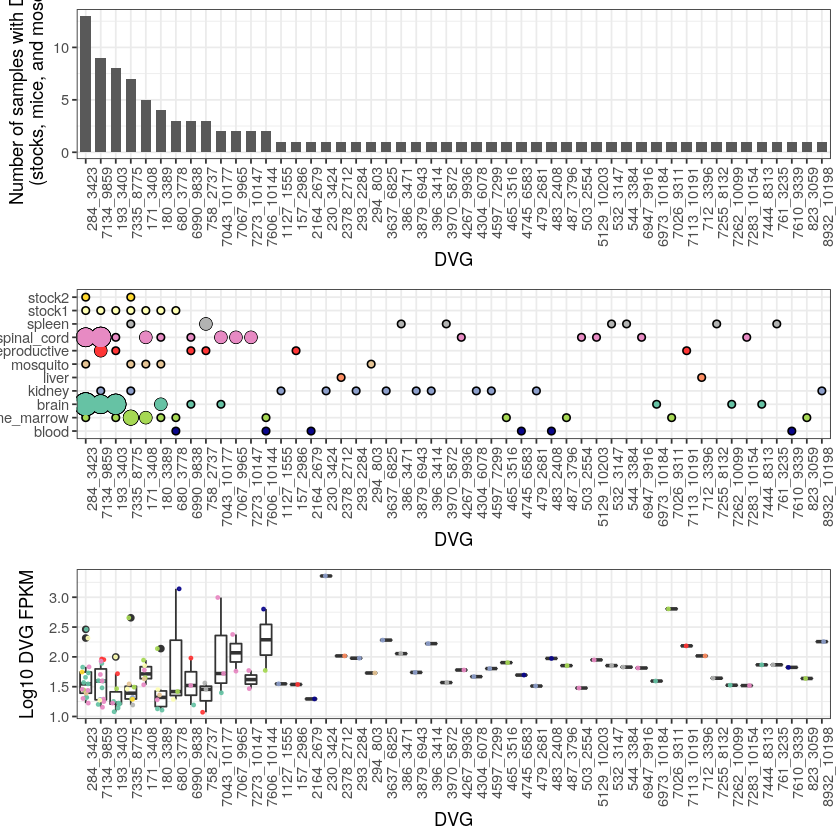

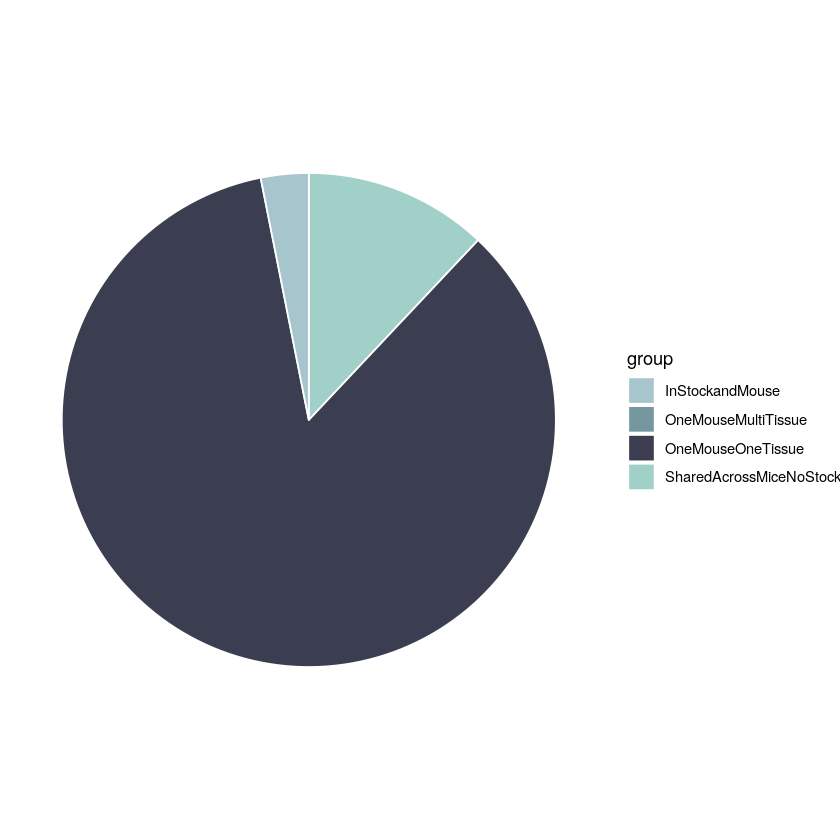

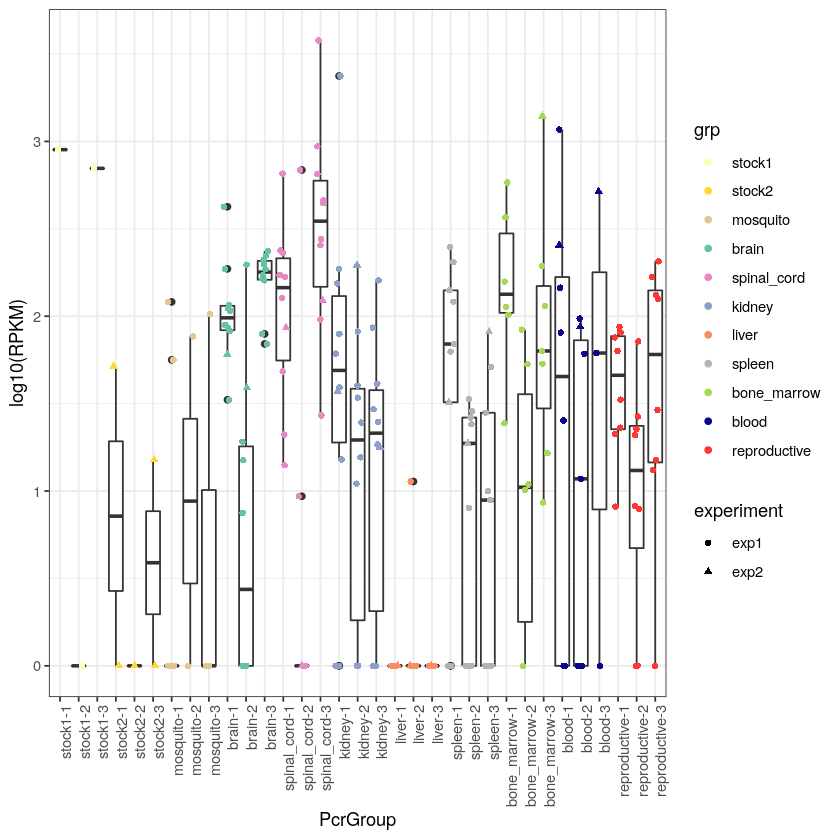

Kruskal Test on DVG FPKM (ZIKA_0.25) p-value: 4.8243531006334e-12



ZIKA_0.25
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 119.613, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   0.824464
         |     1.0000
         |
 blood-3 |  -0.163833  -0.779080
         |     1.0000     1.0000
         |
bone_mar |  -1.500457  -2.223498  -0.989134
         |     1.0000     1.0000     1.0000
         |
bone_mar |   0.939900   0.145418   0.874719   2.282746
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -0.800691  -1.573550  -0.439786   0.711680  -1.657237
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -1.371628  -2.186099  -0.819870   0.309294  -2.

Kruskal Test on DVG diversity (ZIKA_0.25) p-value: 1.19975901248119e-15



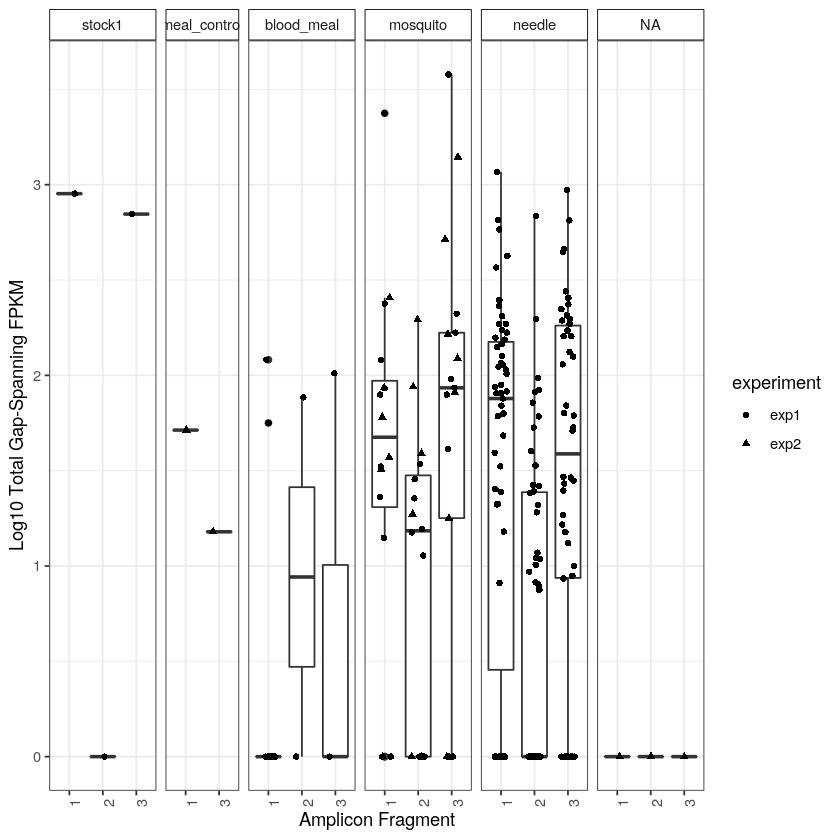

ZIKA_0.25
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 141.0661, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   0.168902
         |     1.0000
         |
 blood-3 |  -0.087469  -0.212490
         |     1.0000     1.0000
         |
bone_mar |  -2.093063  -2.188913  -1.514858
         |     1.0000     1.0000     1.0000
         |
bone_mar |   0.060915  -0.097990   0.130270   2.014863
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -1.840492  -1.945588  -1.294555   0.319653  -1.771269
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -2.982845  -3.048471  -2.059411  -0.550939  -2

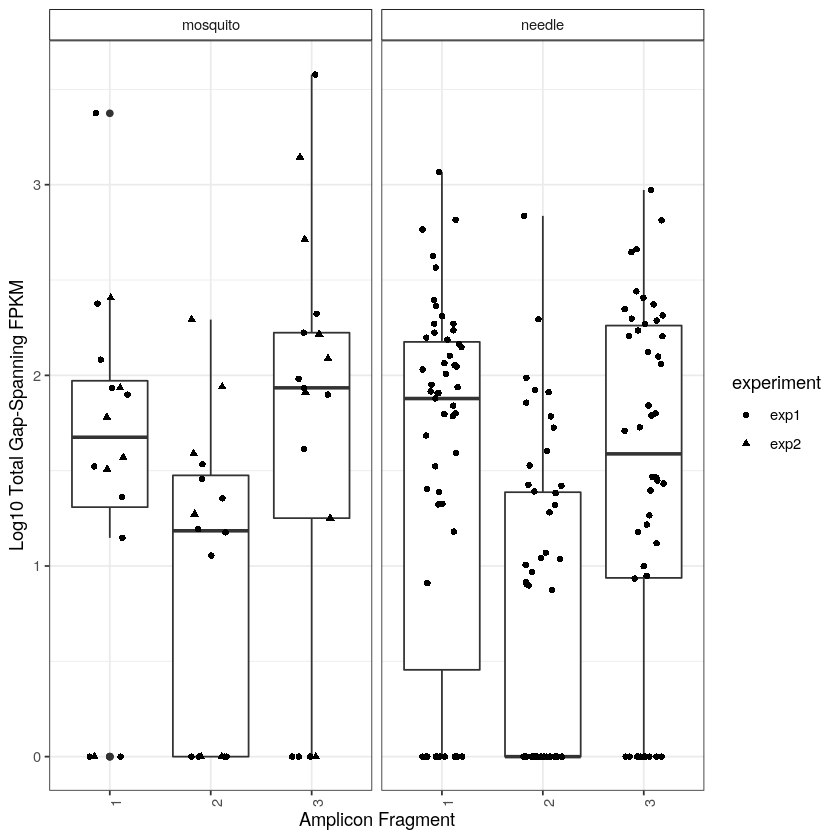

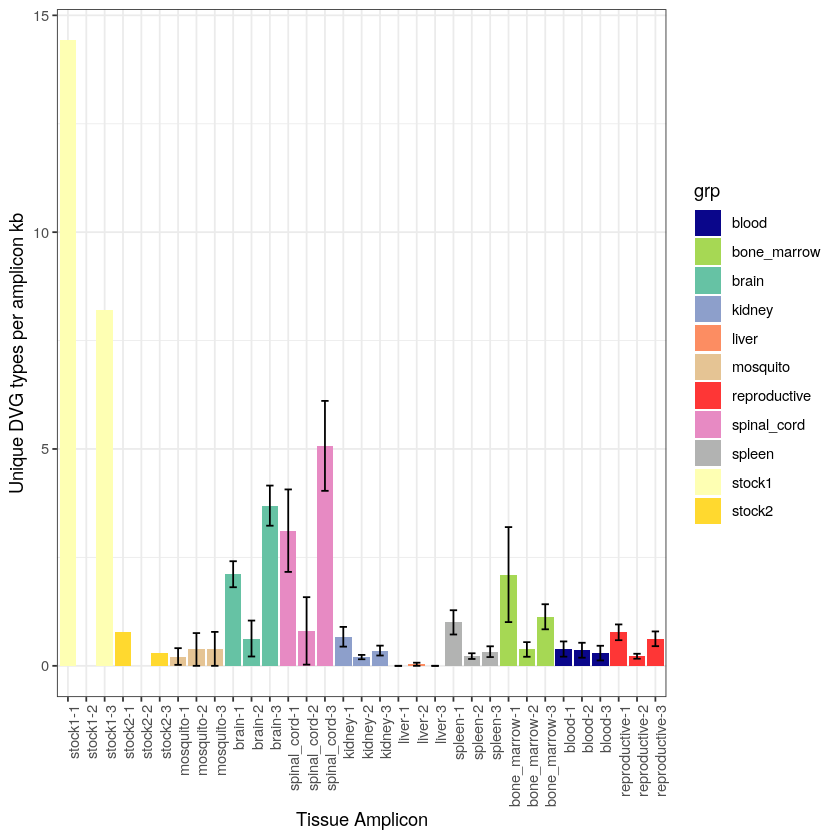

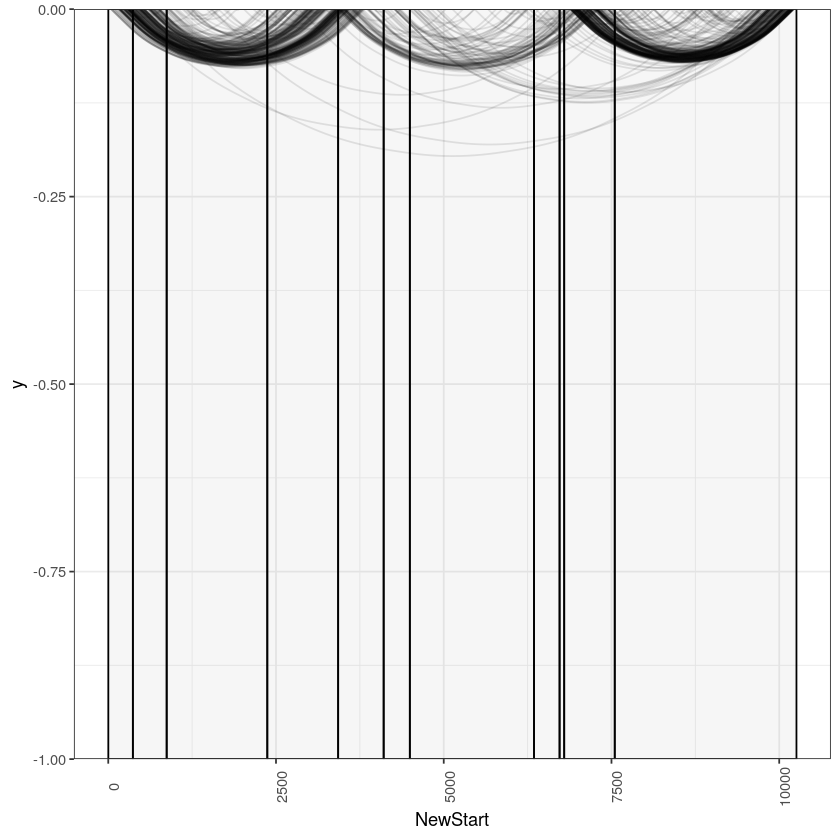

[1] 53
[1] 53


Number of DVGs found to be top across all samples (ZIKA_0.25): 53



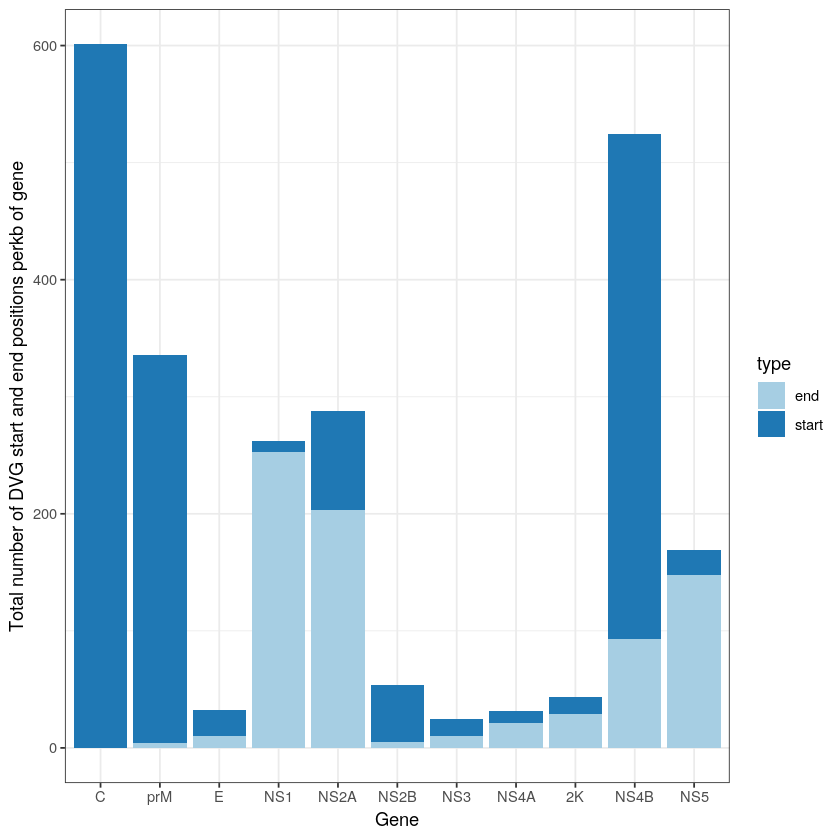

Count in stock and at least one mouse (ZIKA_0.25): 31

Count across mice (no stock) (ZIKA_0.25): 96

Count within mice across tissues (ZIKA_0.25): 0

Count within only one mouse one tissue (ZIKA_0.25): 533



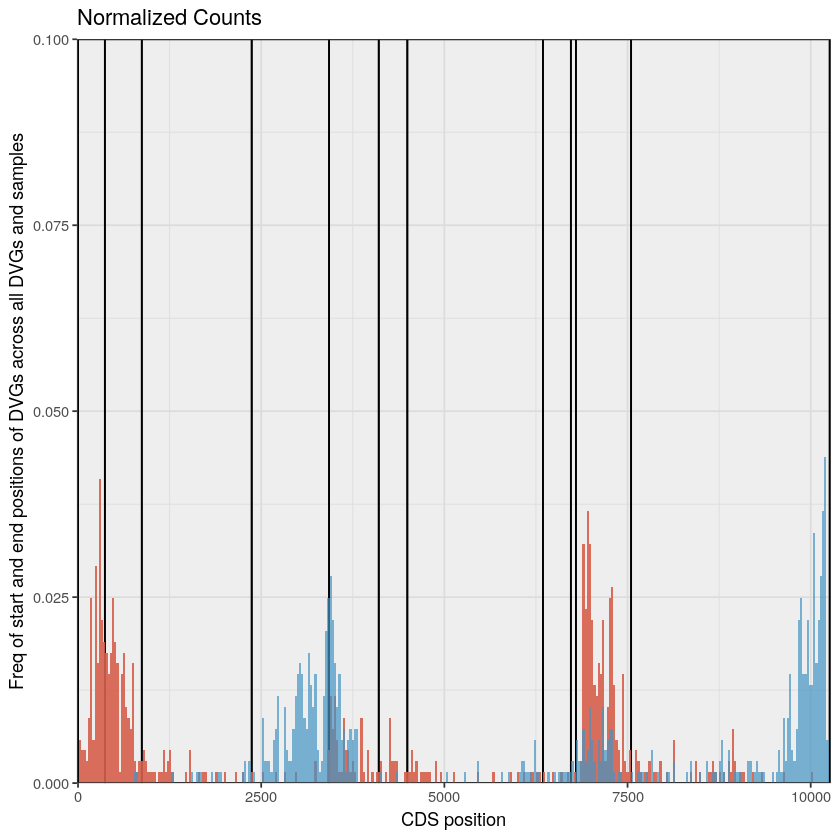

[1] "0.10"
ZIKA_0.10


`summarise()` ungrouping output (override with `.groups` argument)

Dimensions before filtering: 328534

Dimensions after filtering: 51234



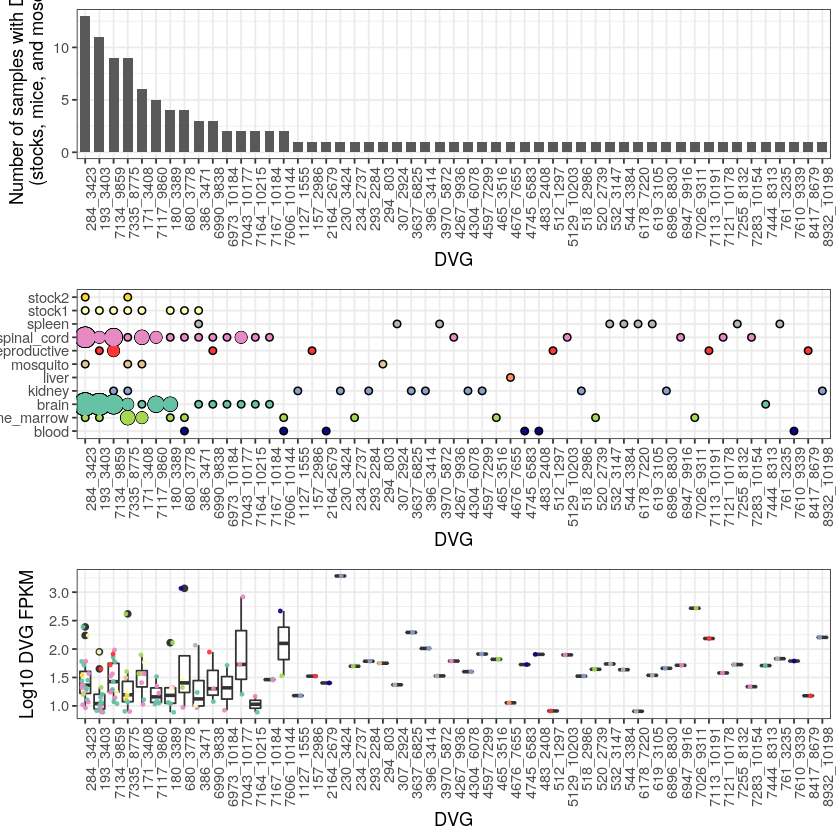

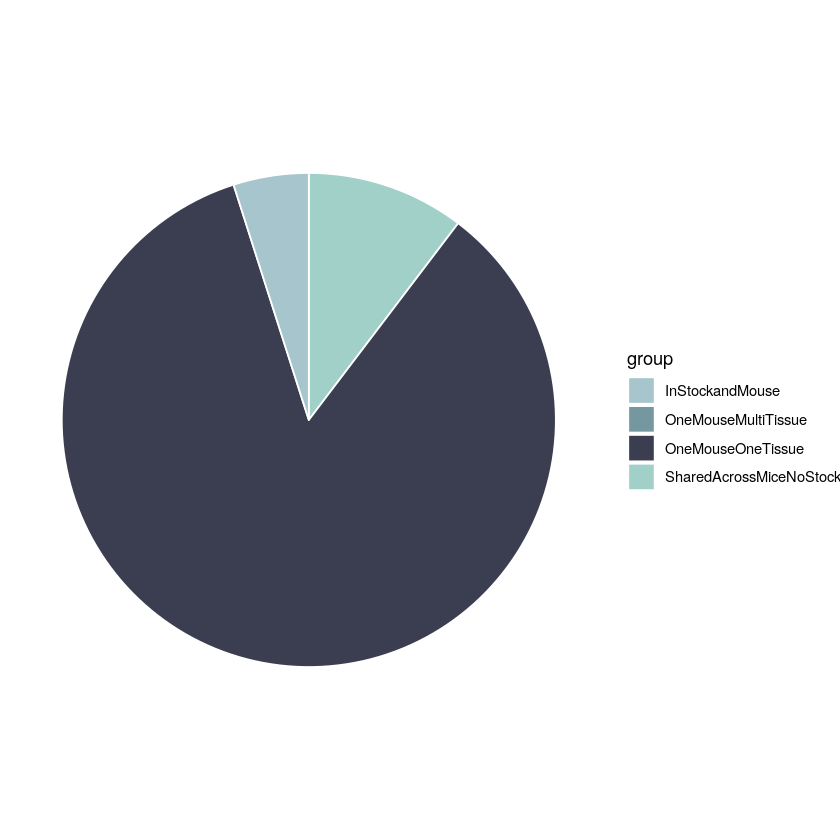

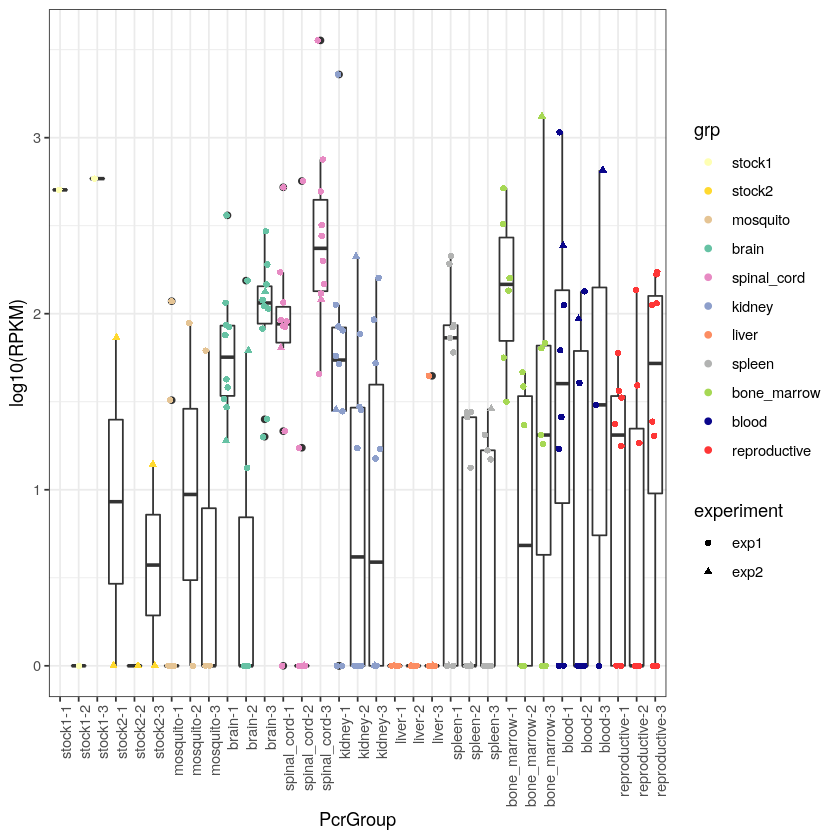

Kruskal Test on DVG FPKM (ZIKA_0.10) p-value: 8.95672642409172e-10



ZIKA_0.10
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 105.479, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   1.111400
         |     1.0000
         |
 blood-3 |   0.070132  -0.764745
         |     1.0000     1.0000
         |
bone_mar |  -1.373219  -2.366911  -1.115960
         |     1.0000     1.0000     1.0000
         |
bone_mar |   1.318736   0.246238   0.940054   2.518094
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |   0.415875  -0.673439   0.243101   1.719891  -0.893258
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -0.652178  -1.794947  -0.542071   0.837083  -1.

Kruskal Test on DVG diversity (ZIKA_0.10) p-value: 1.97499916097842e-11



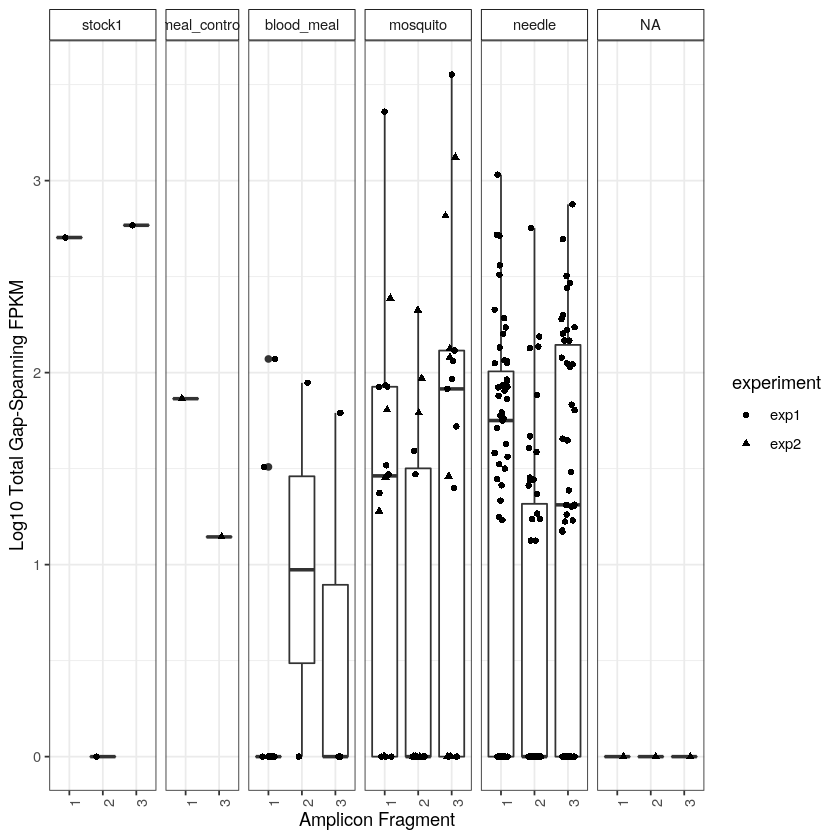

ZIKA_0.10
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 115.8577, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   0.525229
         |     1.0000
         |
 blood-3 |  -0.002986  -0.396852
         |     1.0000     1.0000
         |
bone_mar |  -1.716119  -2.154480  -1.307847
         |     1.0000     1.0000     1.0000
         |
bone_mar |   0.839962   0.326772   0.644391   2.390995
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |  -0.570999  -1.061418  -0.425318   1.134702  -1.346550
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |  -1.718000  -2.205234  -1.234878   0.216676  -2

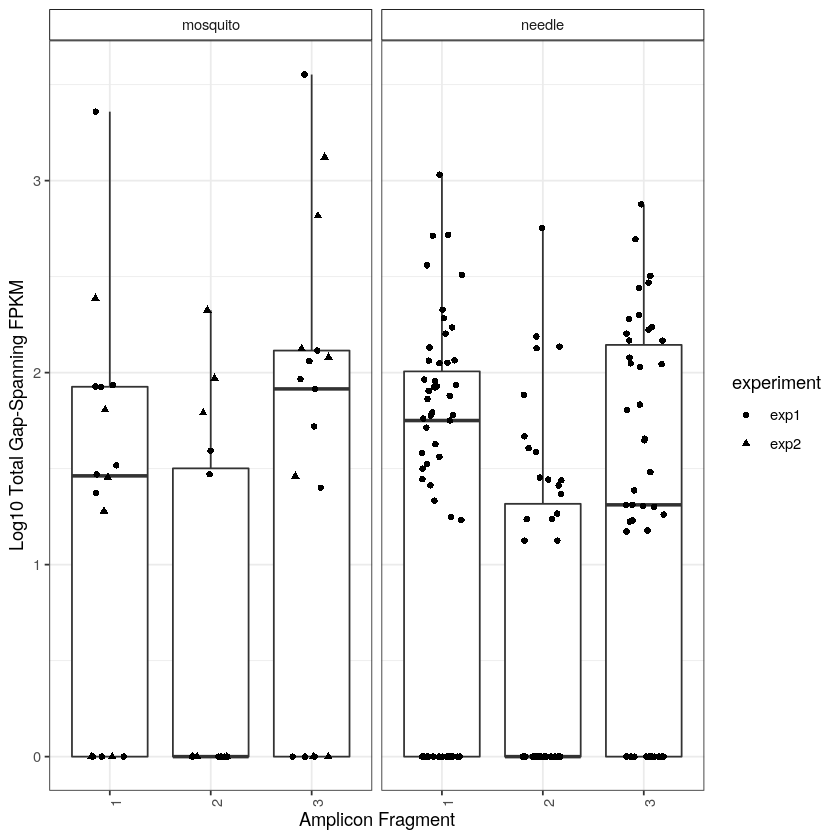

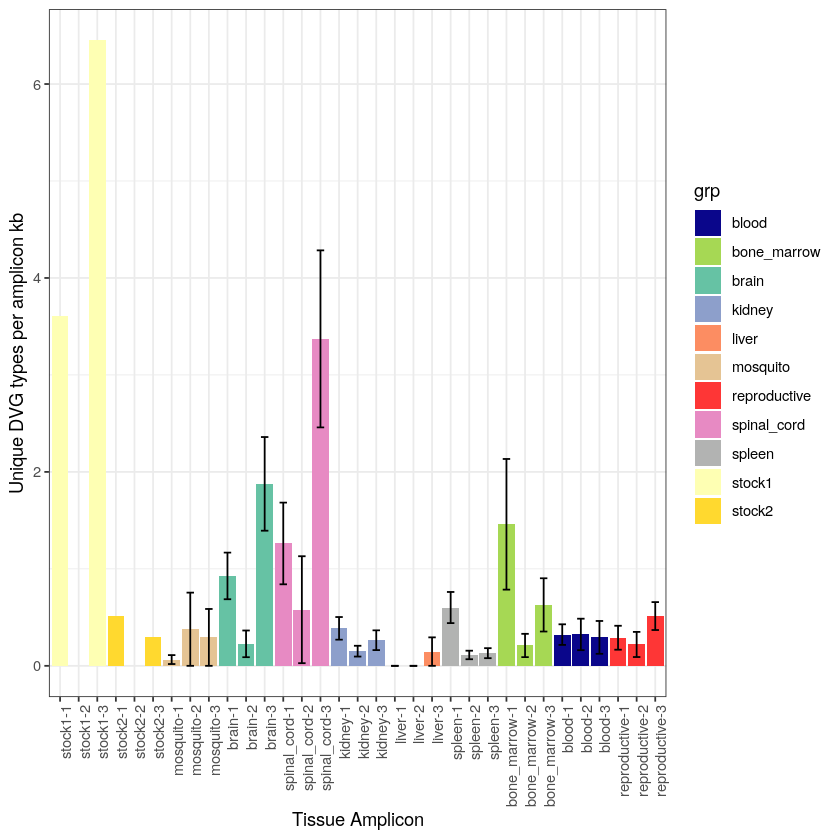

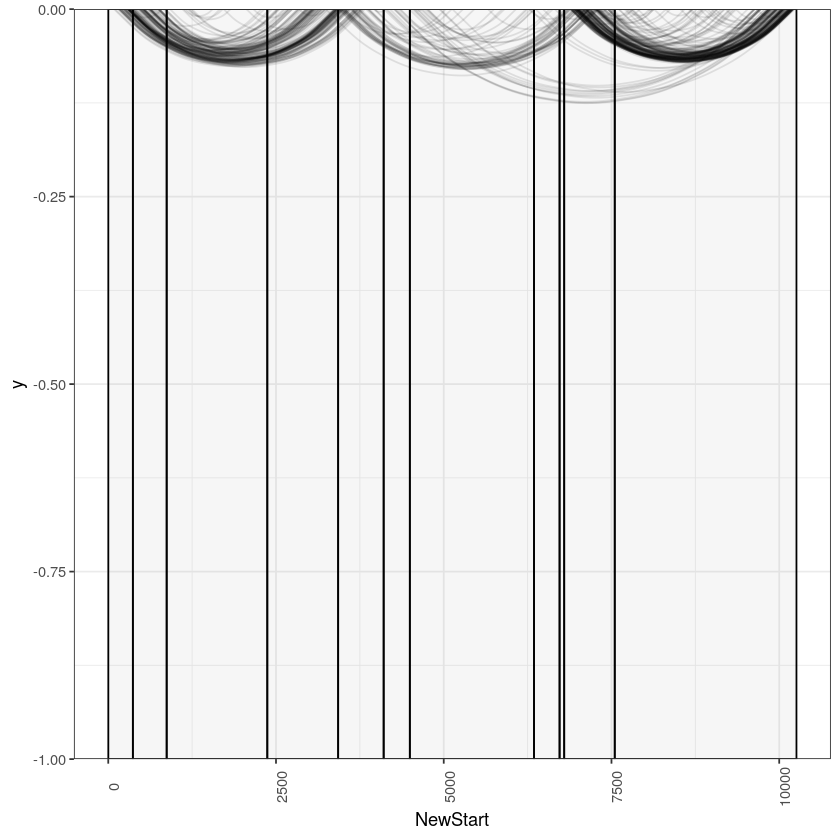

[1] 59
[1] 59


Number of DVGs found to be top across all samples (ZIKA_0.10): 59



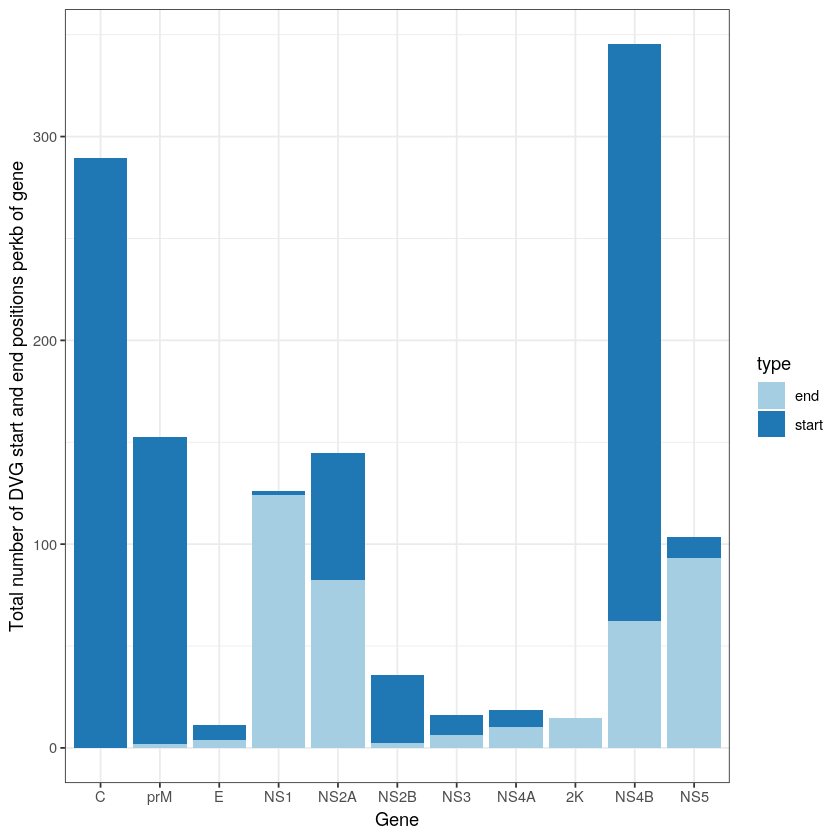

Count in stock and at least one mouse (ZIKA_0.10): 12

Count across mice (no stock) (ZIKA_0.10): 51

Count within mice across tissues (ZIKA_0.10): 3

Count within only one mouse one tissue (ZIKA_0.10): 321



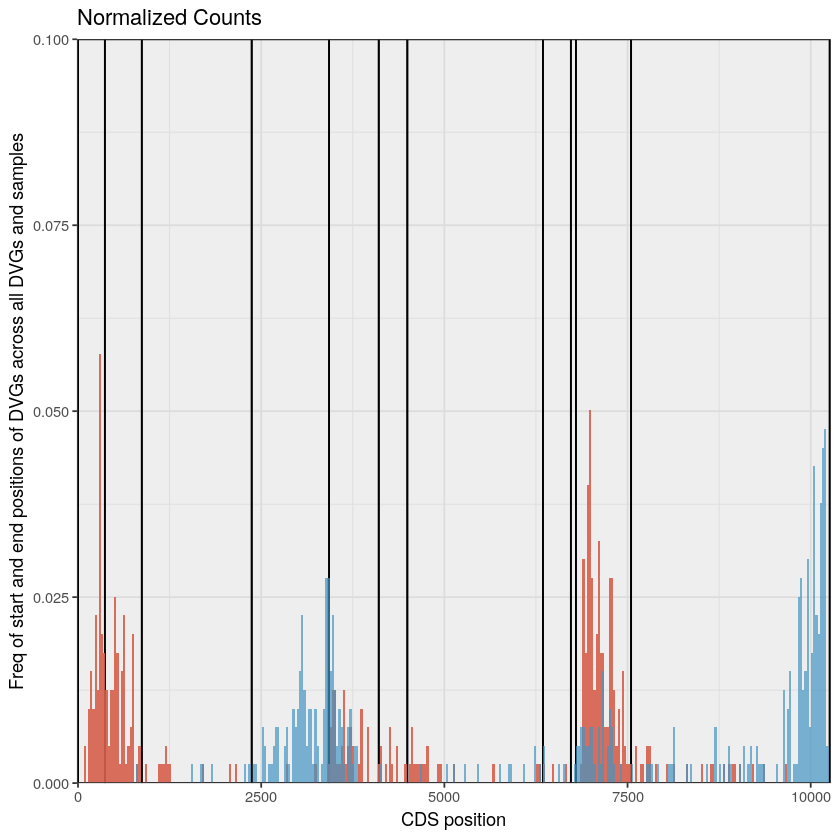

[1] "0.05"
ZIKA_0.05


`summarise()` ungrouping output (override with `.groups` argument)

Dimensions before filtering: 193534

Dimensions after filtering: 9034



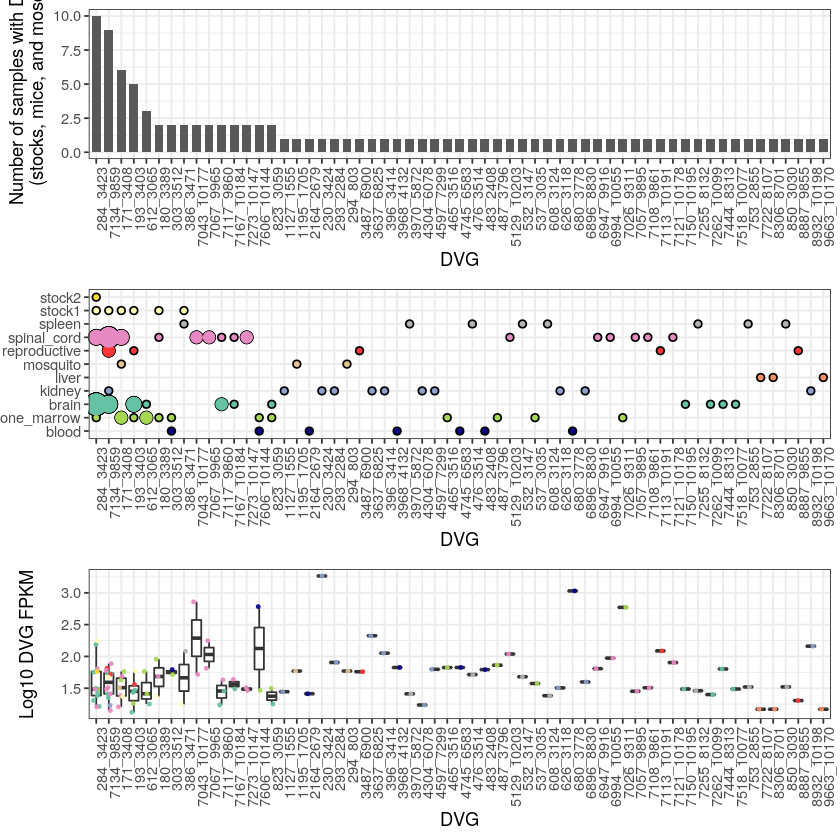

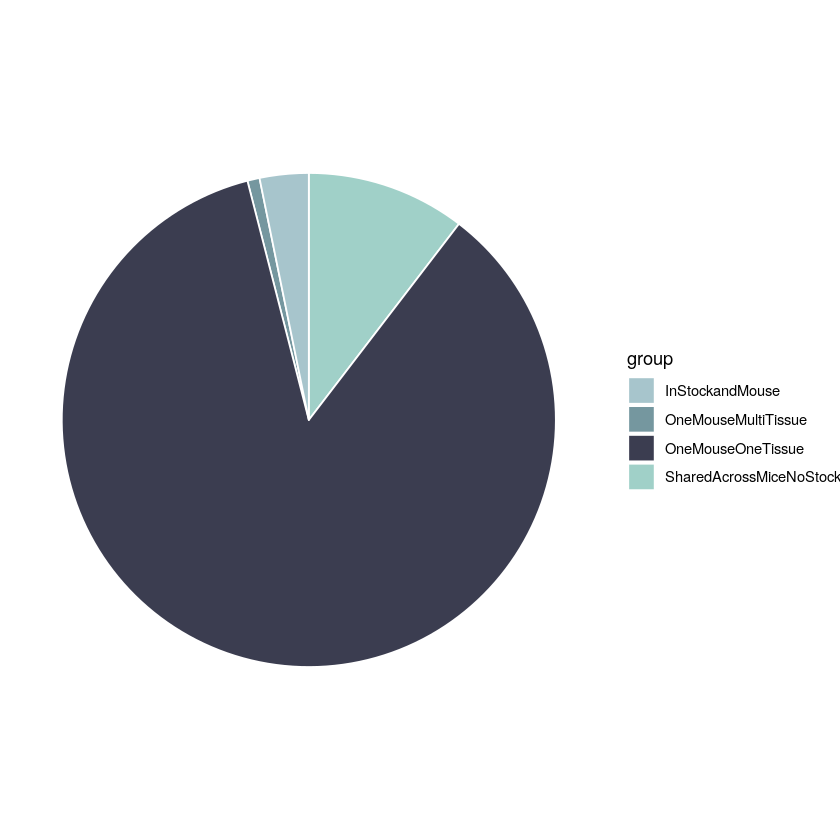

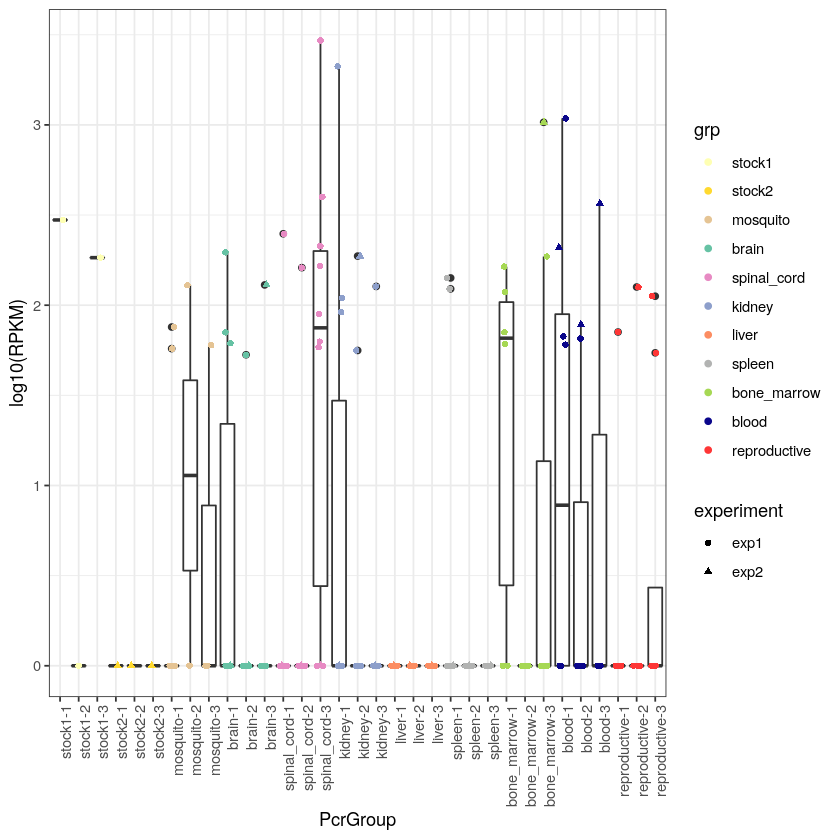

Kruskal Test on DVG FPKM (ZIKA_0.05) p-value: 0.00260789088380172



ZIKA_0.05
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 58.8838, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   1.164002
         |     1.0000
         |
 blood-3 |   0.447831  -0.433648
         |     1.0000     1.0000
         |
bone_mar |  -0.609018  -1.674015  -0.893911
         |     1.0000     1.0000     1.0000
         |
bone_mar |   2.316993   1.166337   1.340867   2.737033
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |   0.877947  -0.276972   0.219106   1.407909  -1.432444
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |   1.131904  -0.132951   0.355056   1.676648  -1.

Kruskal Test on DVG diversity (ZIKA_0.05) p-value: 0.00123284852425315



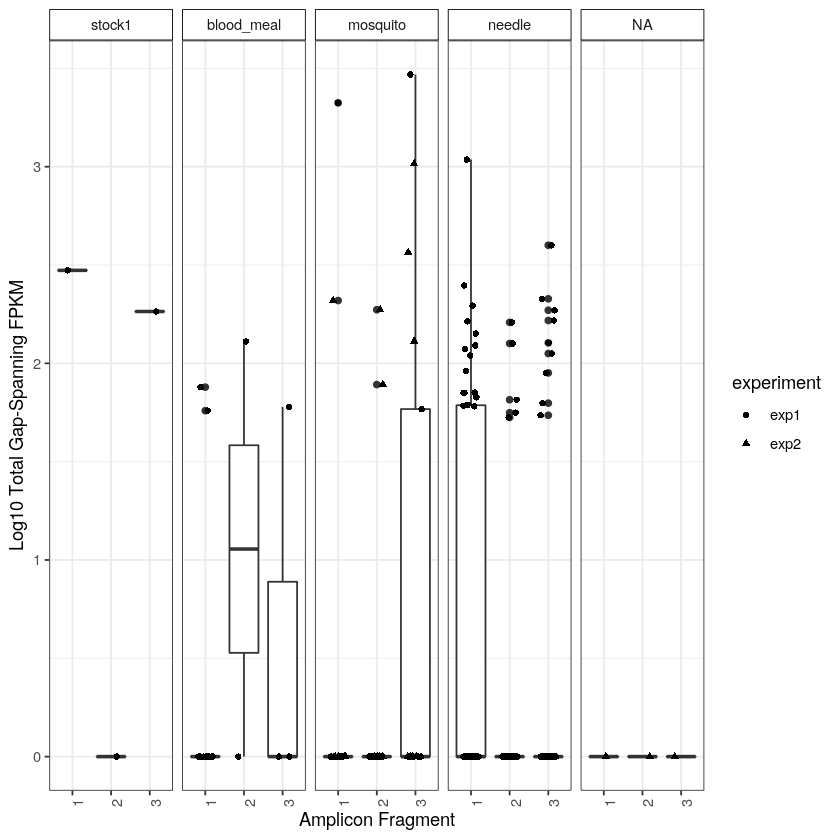

ZIKA_0.05
  Kruskal-Wallis rank sum test

data: x and group
Kruskal-Wallis chi-squared = 61.7146, df = 32, p-value = 0


                           Comparison of x by group                            
                                 (Bonferroni)                                  
Col Mean-|
Row Mean |    blood-1    blood-2    blood-3   bone_mar   bone_mar   bone_mar
---------+------------------------------------------------------------------
 blood-2 |   1.159889
         |     1.0000
         |
 blood-3 |   0.505024  -0.374452
         |     1.0000     1.0000
         |
bone_mar |  -0.728383  -1.786059  -1.039836
         |     1.0000     1.0000     1.0000
         |
bone_mar |   2.185151   1.042182   1.185413   2.725362
         |     1.0000     1.0000     1.0000     1.0000
         |
bone_mar |   0.678885  -0.465729   0.013699   1.338600  -1.489641
         |     1.0000     1.0000     1.0000     1.0000     1.0000
         |
 brain-1 |   1.064915  -0.193109   0.247965   1.739949  -1.

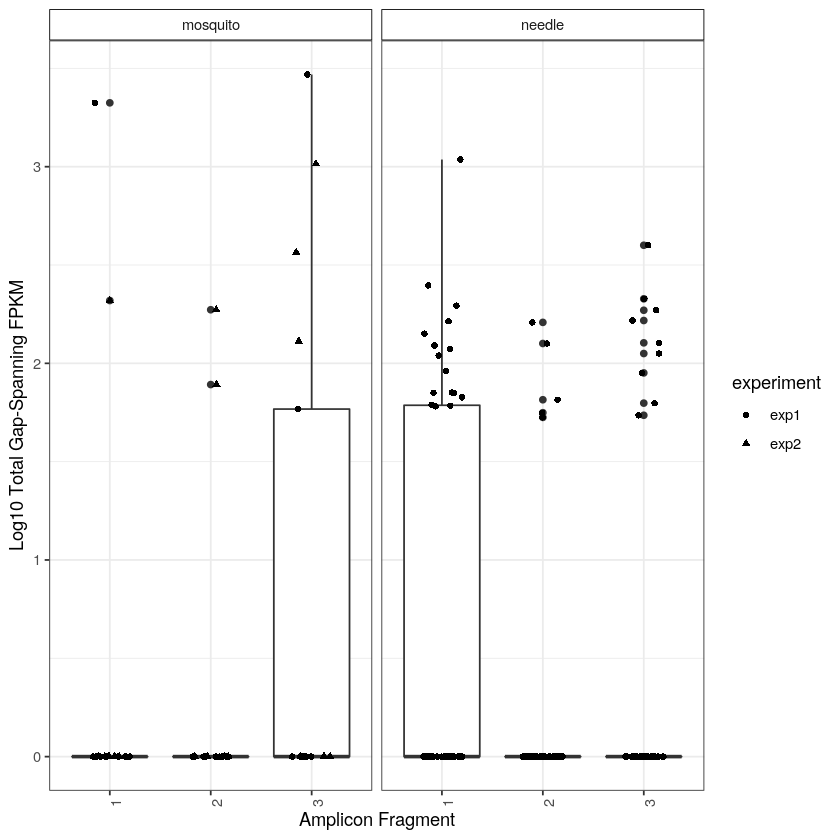

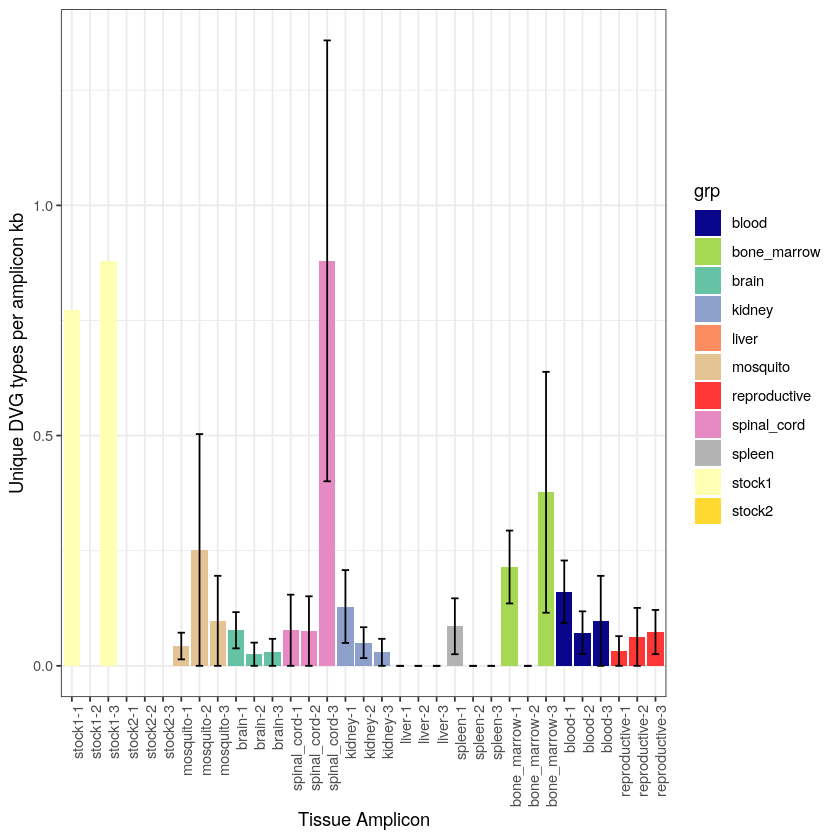

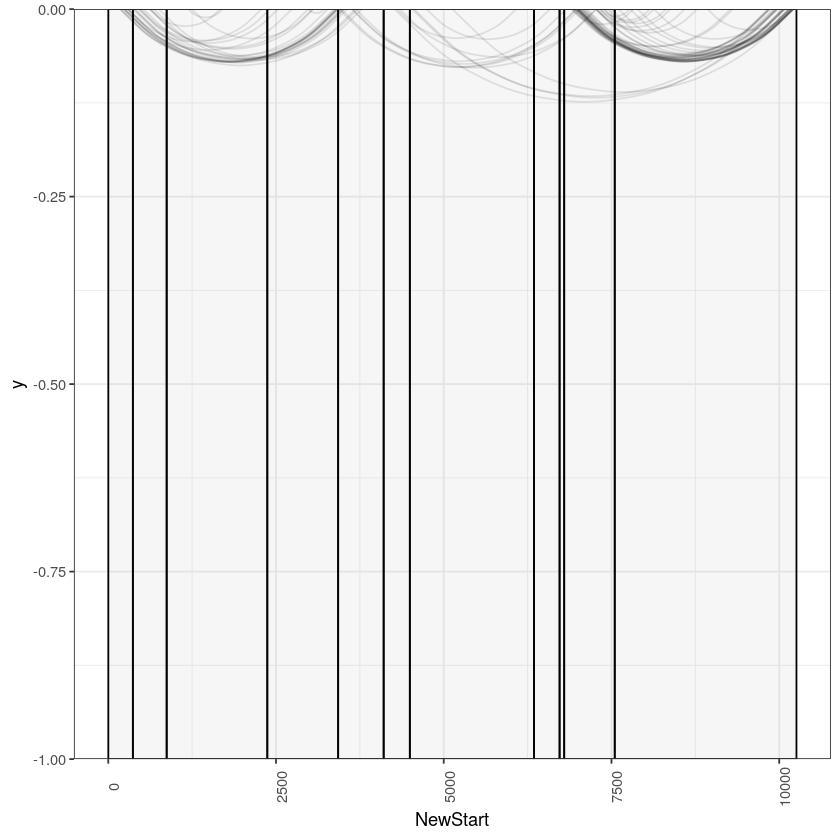

[1] 32
[1] 32


Number of DVGs found to be top across all samples (ZIKA_0.05): 32



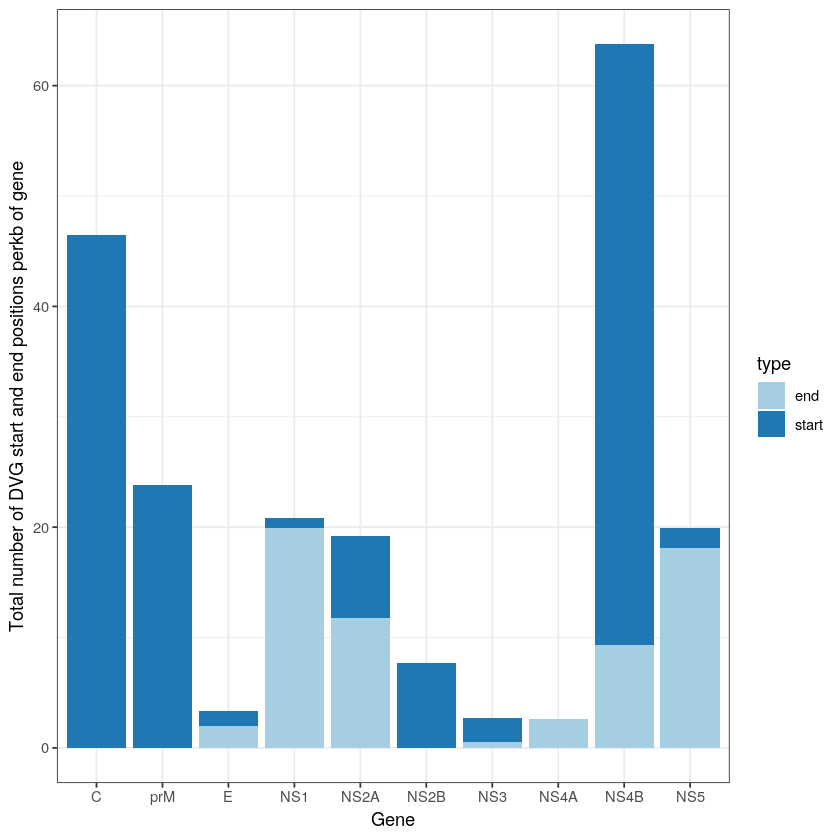

Count in stock and at least one mouse (ZIKA_0.05): 3

Count across mice (no stock) (ZIKA_0.05): 4

Count within mice across tissues (ZIKA_0.05): 0

Count within only one mouse one tissue (ZIKA_0.05): 74



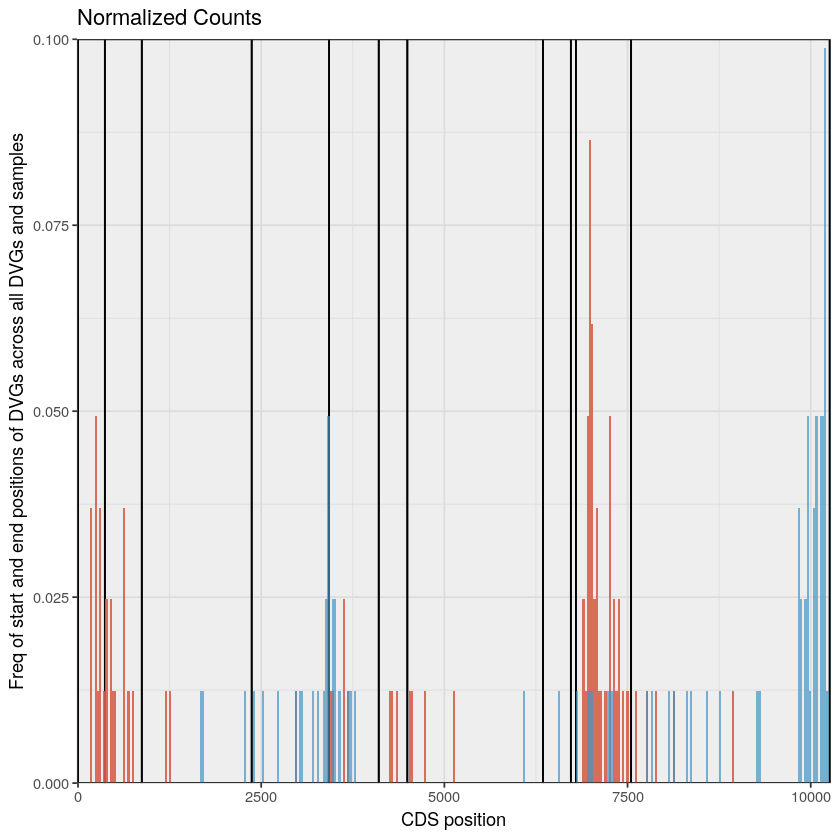

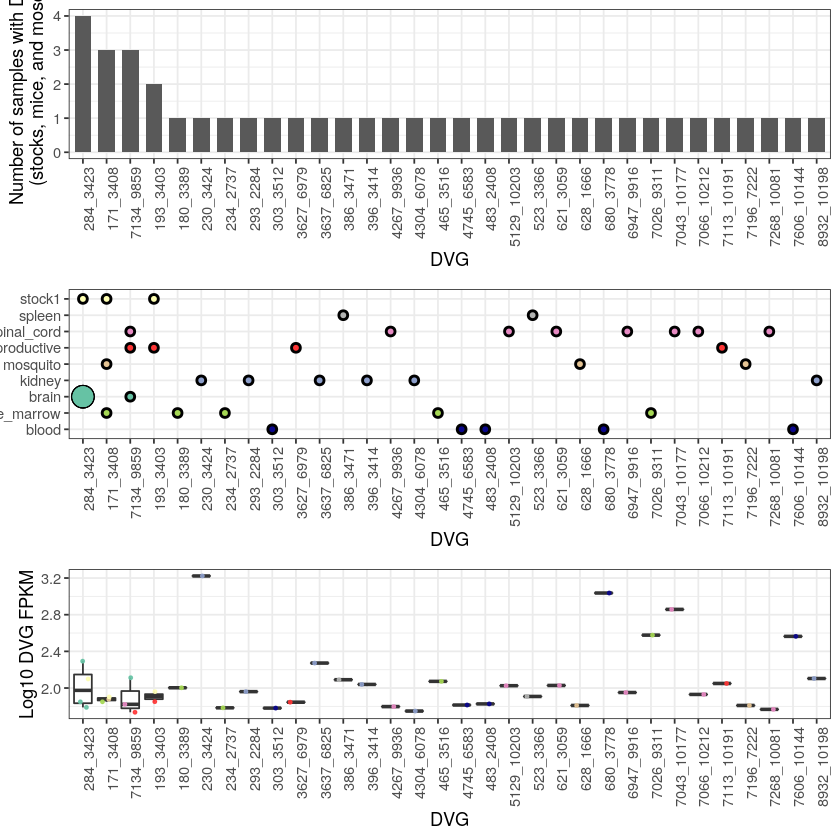

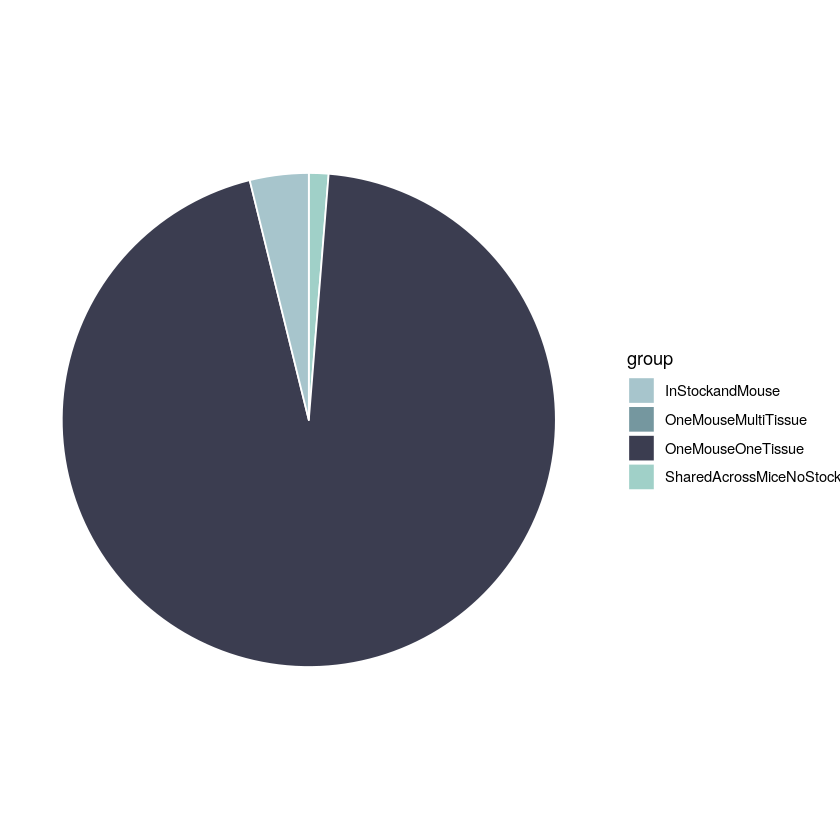

In [35]:
top_plas = "plas" # we are using the fpkm calc by amplicon and subsampling to filter out DVGs

freqs  = c('1','0.75','0.50','0.25','0.10','0.05')

zika = data.frame()

ZIKA_f = data.frame()

for (f in freqs){
    print(f)
    
    subsamp = glue("ZIKA_{f}") # generate the subsampling name
    
    print(subsamp)
    
    dfname = glue("{wkdir}FinalDVGfiles/ZIKA.DVG.FINAL.OneGap.N1.Mis1.M25.csv") # file name for dvgs
    
    x = MergeOutWMeta(dfname, metadata) # read and merge with metadata
    
    x = filter(x, subsample == f) %>% droplevels() # filter out for subsample that we want to use
    
    x2 = CompareBC(x) # compare stock two samples and take only what is in both
    
    x3 = MergeWAvgBC(x2, x, ampdf) # add back the two stock 2 samples to the dataframe (removing the replicates as well)
    
    p = PlasmidDVG(x3) # grab information on the plasmid - which will be used for cutoffs. (This is not completely the case now. Used to filter out DVG coordinates but not used for FPKM threshold)
        
    plasdvg = c(p[[1]]) # a list of dvgs that are found in the plasmid sample - will use to filter out DVGs in sample. These are likely to be sequence specific/aligner DVGs rather than biologically relevant DVGs

    # calculating the maximum DVG_RPKM_FRAG for the plasmid by pcr and subsample
    plasmid_cutoffs = x3 %>% 
        filter(name == 'plasmid_control') %>% 
            #group_by(pcr, subsample) %>% 
            group_by(subsample) %>% 
            summarise(DVG_RPKM_PLAS = max(DVG_RPKM_FRAG)) # determine the max FPKM for each subsample/amplicon and append to df. Used to filter.

    #x4 = merge(x3, plasmid_cutoffs, by = c('pcr','subsample'), all.x = TRUE)  # merge the plasmid cutoffs to the x3 dataframe - used to filter
    x4 = merge(x3, plasmid_cutoffs, by = c('subsample'), all.x = TRUE)  # merge the plasmid cutoffs to the x3 dataframe - used to filter

    df_f = FiltDVGs(x4, plasdvg, tissue_list2)  # filtering out the dataframe using the plasmid cutoffs 

    AllSamps = NoDVG(metadata, f) # add in samples with 0 dvgs
    
    # merge the two dataframes together keeping ALL of the metadata info (will generate rows with NA)
    df = merge(df_f, AllSamps, 
                     by=c('name','tissue','experiment','transmission','mouse_id', 'pcr'), 
                     all = TRUE)
    
    df = df[!duplicated(df), ] %>% droplevels() # always check to make sure merging didn't generate dups
    
    df$subsample = f # add sub samp freq info
    
    df$segment = 'MR766' # add segment
    
    df$segment_size = 10260 # add genome size
    
    zika = rbind(zika, df)
    
    fpkm = CalcFPKM(df, ampdf) # calculate fpkm (including samples that have 0 dvgs)
    
    fpkm = fpkm %>% filter(tissue %in% tissue_list2) %>% droplevels()
    
    #reorder factors for figures
    fpkm$tissue = factor(fpkm$tissue,levels=tissue_ord)
    
    fpkm$PcrGroup = paste0(fpkm$tissue, '-',fpkm$pcr)
    
    fpkm$transmission =factor(fpkm$transmission,levels=transord)
    
    fpkm$PcrGroup = factor(fpkm$PcrGroup,levels=orderlist)

    ZIKA_f = rbind(ZIKA_f, fpkm)
    
    # generate dvg figures and stats tables
    fpkm_stats = FPM_Figs(fpkm, glue("{wkdir}DVG_Figures/fpkm"), RedColScale, subsamp, top_plas) # FPKM figures
    
    fpkm_stats = fpkm_stats %>% filter(padj <= 0.05) %>% droplevels()
    
    write.csv(fpkm_stats,
             file=glue("{wkdir}/DVG_FPKMstats/DunnTest.SigVal.DVG.FPKM.{subsamp}.{top_plas}.csv"),
             row.names=FALSE)
    
    # the diversity function adds in samples that had 0 dvgs called
    Div_stats = DVGDiversity(df_f, reduced, glue("{wkdir}DVG_Figures/DVG_diversity"), subsamp, top_plas)  # diversity figures
    
    Div_stats = Div_stats %>% filter(padj <= 0.05) %>% droplevels()
    
    write.csv(Div_stats,
             file=glue("{wkdir}/DVG_DiversityStats/DunnTest.SigVal.DVG.Diversity.{subsamp}.{top_plas}.csv"),
             row.names = FALSE)
    
    CurvyAll(df_f, Gene_df, glue("{wkdir}DVG_Figures/curvy"), subsamp, top_plas)  # curve plot figures
    
    CountGenes(df_f, Gene_ID, Gene_df, glue("{wkdir}DVG_Figures/Counts"), subsamp, top_plas)  # counting DVGs in each gene figure
    
    Histo(df_f, Gene_df, glue("{wkdir}DVG_Figures/histos"), subsamp, top_plas)  # histogram of start/end points figure
        
    DVG.FPKM = TopShare(df_f, ampdf, RedColScale, glue("{wkdir}DVG_Figures/SharedDVGs"), subsamp, top_plas)  # Figure showing shared/top DVGs
        
    PiePlot(df_f, glue("{wkdir}DVG_Figures/PIE"), subsamp, top_plas)  # pie plot figure 

}

In [36]:
ZIKA = DVG_fpkm(zika)
ZIKA$DVG_RPKM[is.na(ZIKA$DVG_RPKM)] = 0 # if there aren't any DVGS make fpkm 0 
ZIKA = ZIKA[!duplicated(ZIKA),] %>% droplevels()

In [37]:
# filter out DFs for different subsampling frequencies
z100 = FiltIt(ZIKA, "1")
z75 =  FiltIt(ZIKA, "0.75")
z50 =  FiltIt(ZIKA, "0.50")
z25 =  FiltIt(ZIKA, "0.25")
z10 =  FiltIt(ZIKA, "0.10")
z05 =  FiltIt(ZIKA, "0.05")


In [38]:
# merge the subsampling frequencies into one df
z = merge(z05, z10, by=c('segment','pcr','NewGap','transmission','tissue','name','experiment'), all = TRUE)
z = merge(z, z25, by=c('segment','pcr','NewGap','transmission','tissue','name','experiment'), all = TRUE)
z = merge(z, z50, by=c('segment','pcr','NewGap','transmission','tissue','name','experiment'), all = TRUE)
z = merge(z, z75, by=c('segment','pcr','NewGap','transmission','tissue','name','experiment'), all = TRUE)
z = merge(z, z100, by=c('segment','pcr','NewGap','transmission','tissue','name','experiment'), all = TRUE)

# melt from wide format to long format so we can compare no subsampling to subsampling at different frequencies
z_melt = melt(z, id.vars = c('segment','pcr','NewGap','transmission','tissue','name','experiment','Sub1'))

z_melt[is.na(z_melt)] = 0 # any NAs indicate that it wasn't identified either in the subsampled bam or the nonsubsampled bam


In [39]:
# rename the filtered dfs 
colnames(z05) = c('segment','pcr','NewGap','transmission','tissue','name','experiment',"DVG.FPKM")
z05$subsample = 'S5'

colnames(z10) = c('segment','pcr','NewGap','transmission','tissue','name','experiment',"DVG.FPKM")
z10$subsample = 'S10'

colnames(z25) = c('segment','pcr','NewGap','transmission','tissue','name','experiment',"DVG.FPKM")
z25$subsample = 'S25'

colnames(z50) = c('segment','pcr','NewGap','transmission','tissue','name','experiment',"DVG.FPKM")
z50$subsample = 'S50'

colnames(z75) = c('segment','pcr','NewGap','transmission','tissue','name','experiment',"DVG.FPKM")
z75$subsample = 'S75'

colnames(z100) = c('segment','pcr','NewGap','transmission','tissue','name','experiment',"DVG.FPKM")
z100$subsample = 'S100'

# bind together to make faceted plots
z2 = rbind(z05, z10)
z2 = rbind(z2, z25)
z2 = rbind(z2, z50)
z2 = rbind(z2, z75)
z2 = rbind(z2, z100)

In [40]:
# the fpkm boxplots, but faceted by subsampling frequency
#xplot = ggplot(fpkm, aes(x=PcrGroup, log10(RPKM))) + 
xplot = ggplot(ZIKA_f, aes(x=PcrGroup, log10(RPKM))) + 
    geom_boxplot() +
    geom_jitter(width=0.25, aes(color=tissue, shape=experiment)) +
    theme_bw() +
    facet_wrap(.~subsample, ncol = 3) +
    RedColScale +
    ylab("Log10 total DVG FPKM") + 
    xlab("Tissue-PCR Amplicon") + 
    theme(legend.key = element_blank(), 
          strip.background = element_rect(colour="black", fill="white"),
          axis.text.x = element_text(angle =90,hjust=1))

ggsave(xplot,
          file=glue("{wkdir}/DVG_Figures/CompareSub/FPKM.Boxplots.Subsamps.{top_plas}.pdf"),
     width=15, height=8,limitsize=FALSE, useDingbats=FALSE)


In [41]:
# correlation with the subsampled data and the nonsubsampled data
# looking at individual dvg species fpkm values
z_melt = z_melt %>% filter(tissue %in% tissue_list2) %>% droplevels()

xplot2 = ggplot(z_melt, aes(x = Sub1, y = value)) +
    geom_point(aes(color=tissue, shape = experiment), alpha = 0.5) +
    ylab("Individual DVG FPKM (subsampling)") + 
    xlab("Individual DVG FPKM (no subsampling)") + 
    facet_grid(.~variable) +
    theme_bw() + 
    RedColScale + 
    theme(legend.key = element_blank(), 
          strip.background = element_rect(colour="black", fill="white")) 

ggsave(xplot2,
          file=glue("{wkdir}/DVG_Figures/CompareSub/DVG.Correlations.{top_plas}.pdf"),
     width=12, height=3,limitsize=FALSE, useDingbats=FALSE)

In [42]:
# filtering the df to calculate the correlation values
c5 = z_melt %>% filter(variable == 'Sub0.05') %>% droplevels()
c10 = z_melt %>% filter(variable == 'Sub0.10') %>% droplevels()
c25 = z_melt %>% filter(variable == 'Sub0.25') %>% droplevels()
c50 = z_melt %>% filter(variable == 'Sub0.50') %>% droplevels()
c75 = z_melt %>% filter(variable == 'Sub0.75') %>% droplevels()

cor(c5$Sub1, c5$value)
cor(c10$Sub1, c10$value)
cor(c25$Sub1, c25$value)
cor(c50$Sub1, c50$value)
cor(c75$Sub1, c75$value)


[1] 0.9693573

[1] 0.9792655

[1] 0.9865422

[1] 0.9910591

[1] 0.9991036

In [43]:
sessionInfo()

R version 4.0.2 (2020-06-22)
Platform: x86_64-conda_cos6-linux-gnu (64-bit)
Running under: Ubuntu 18.04.5 LTS

Matrix products: default
BLAS/LAPACK: /home/kate/anaconda3/envs/r_env/lib/libopenblasp-r0.3.10.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] grid      stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] dunn.test_1.3.5 glue_1.4.2      plotly_4.9.2.1  gridExtra_2.3  
 [5] reshape2_1.4.4  forcats_0.5.0   stringr_1.4.0   dplyr_1.0.2    
 [9] purrr_0.3.4     readr_1.4.0     tidyr_1.1.2     tibble_3.0.4   
[13] tidyverse_1.3.0 ggplot2_3.3.2   plyr_1.8.6     

loaded via a namespace (and 